In [3]:
import twint
import pandas as pd


import networkx as nx
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import powerlaw
warnings.filterwarnings('ignore')


%matplotlib inline 

### PULIZIA CRAWLED DATA

In [4]:
df = pd.read_csv("climatechange.csv", sep='\t')

In [3]:
type(df)

pandas.core.frame.DataFrame

In [4]:
df.tail(2)

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
50017,1175070693391765507,1175070693391765507,2019-09-20 17:34:19 ora legale Europa occidentale,2019-09-20,17:34:19,200,19811643,lvz,LVZ,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
50018,1175070453859094528,1175070453859094528,2019-09-20 17:33:22 ora legale Europa occidentale,2019-09-20,17:33:22,200,881570054801944576,gswnature,Georgie Ward,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [5]:
# Get all names 
for col_name in df.columns: 
    print(col_name)

id
conversation_id
created_at
date
time
timezone
user_id
username
name
place
tweet
language
mentions
urls
photos
replies_count
retweets_count
likes_count
hashtags
cashtags
link
retweet
quote_url
video
thumbnail
near
geo
source
user_rt_id
user_rt
retweet_id
reply_to
retweet_date
translate
trans_src
trans_dest


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50019 entries, 0 to 50018
Data columns (total 36 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               50019 non-null  int64  
 1   conversation_id  50019 non-null  int64  
 2   created_at       50019 non-null  object 
 3   date             50019 non-null  object 
 4   time             50019 non-null  object 
 5   timezone         50019 non-null  int64  
 6   user_id          50019 non-null  int64  
 7   username         50019 non-null  object 
 8   name             50007 non-null  object 
 9   place            18 non-null     object 
 10  tweet            50019 non-null  object 
 11  language         50019 non-null  object 
 12  mentions         50019 non-null  object 
 13  urls             50019 non-null  object 
 14  photos           50019 non-null  object 
 15  replies_count    50019 non-null  int64  
 16  retweets_count   50019 non-null  int64  
 17  likes_count 

Toglie created_at, time, timezone, lasciando la data
Sono dati ripetuti 

In [5]:
df.drop(['trans_dest', 'trans_src','translate','retweet_date','geo','source','user_rt_id', 'user_rt','retweet_id',
        'near','place','thumbnail', 'time', 'timezone', 'video', 'photos', 'cashtags', 'created_at'], axis=1, inplace=True)

In [14]:
#No valori nulli!
df['language'].isnull().values.any()

False

In [7]:
Lingue=list(set(df['language']))
Lingue

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50019 entries, 0 to 50018
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               50019 non-null  int64 
 1   conversation_id  50019 non-null  int64 
 2   date             50019 non-null  object
 3   user_id          50019 non-null  int64 
 4   username         50019 non-null  object
 5   name             50007 non-null  object
 6   tweet            50019 non-null  object
 7   language         50019 non-null  object
 8   mentions         50019 non-null  object
 9   urls             50019 non-null  object
 10  replies_count    50019 non-null  int64 
 11  retweets_count   50019 non-null  int64 
 12  likes_count      50019 non-null  int64 
 13  hashtags         50019 non-null  object
 14  link             50019 non-null  object
 15  retweet          50019 non-null  bool  
 16  quote_url        6653 non-null   object
 17  reply_to         50019 non-null

Restingendo il range di tweet con numero di likes, retweet e replies
Si arriva a 26382 valori totali

In [11]:
df=df[df['likes_count']>=5]
df=df[df['replies_count']>=1]
df=df[df['retweets_count']>=3]

In [12]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26382 entries, 5 to 50017
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               26382 non-null  int64 
 1   conversation_id  26382 non-null  int64 
 2   date             26382 non-null  object
 3   user_id          26382 non-null  int64 
 4   username         26382 non-null  object
 5   name             26372 non-null  object
 6   tweet            26382 non-null  object
 7   language         26382 non-null  object
 8   mentions         26382 non-null  object
 9   urls             26382 non-null  object
 10  replies_count    26382 non-null  int64 
 11  retweets_count   26382 non-null  int64 
 12  likes_count      26382 non-null  int64 
 13  hashtags         26382 non-null  object
 14  link             26382 non-null  object
 15  retweet          26382 non-null  bool  
 16  quote_url        2791 non-null   object
 17  reply_to         26382 non-null

##### Salvo il file pulito sul csv 'climatechange_1'

In [13]:
df.to_csv('climatechange_1.csv')

In [14]:
df=pd.read_csv("climatechange_1.csv")

In [15]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mir-9\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Faccio questa funzione per pulire i tags dalle quadre, la applico a una nuova colonna (clean_tags)

In [16]:
def remove_content(text):
    text = re.sub(r"\[", "", text) #remove urls
    text=re.sub(r'\]','',text) #remove urls

    return text

In [17]:
df['clean_tags']=df['hashtags'].apply(lambda x: remove_content(x))

In [18]:
df.insert(0, 'clean_tags', df.pop('clean_tags'))

In [19]:
df.insert(1, 'hashtags', df.pop('hashtags'))

In [20]:
df.head(1)

,clean_tags,hashtags,Unnamed: 0,id,conversation_id,date,user_id,username,name,tweet,language,mentions,urls,replies_count,retweets_count,likes_count,link,retweet,quote_url,reply_to
0,"'fossilfuels', 'wind', 'solar', 'green', 'hydr...","['fossilfuels', 'wind', 'solar', 'green', 'hyd...",5,1546251358231298052,1183520402791895041,2022-07-10,59386332,arikring,Arik Ring - Energy Engineering Expert,@ProfStrachan @ECOWARRIORSS @ChristineMilne @m...,en,"[{'screen_name': 'guytaur', 'name': 'scott. tr...",['https://reneweconomy.com.au/integrated-wind-...,2,54,59,https://twitter.com/arikring/status/1546251358...,False,NaN,"[{'screen_name': 'ProfStrachan', 'name': 'Prof..."


In [21]:
#Ti crea un dizionario in cui le chiavi sono i tag singoli e i valori sono gli id degli user
tags_dict = {}
for i in range(len(df)):
    ll = df["clean_tags"][i].split(",")[:-1]
    for tg in ll:
        if tg not in tags_dict:
            tags_dict[tg] = [df["user_id"][i]]
        else:
            tags_dict[tg].append(df["user_id"][i])

In [22]:
#Crea la lista di tags dalle chiavi del dizionario e li associa alla variabile tag
tags = list(tags_dict.keys())
#crea una lista costituita da coppie di tags
couple_tags = []
for i in range(len(tags)):
    for j in tags[i+1:]:
        couple_tags.append((tags[i], j)) 

In [23]:
#couple_tags

In [24]:
len(couple_tags)

53763265

In [25]:
len(tags)

10370

In [20]:
len(tags)

18790

In [26]:
source = []
target = []
count = []
nodes = []
for i in couple_tags:
    ll = list(set(tags_dict[i[0]]) & set(tags_dict[i[1]]))
    if len(ll)>0:
        source.append(i[0])
        target.append(i[1])
        count.append(len(ll))
        nodes.append(i[0])
        nodes.append(i[1])

In [27]:
nodes = list(set(nodes)) #list()crea una lista; set(nodes) prende i nodi senza ripetizioni

In [28]:
len(nodes)

10156

In [29]:
new_df = pd.DataFrame({"Id": nodes})
new_df.to_csv("../Fridayforfuture/nodes.csv", index=False)

In [30]:
new_df = pd.DataFrame({"Source": source,
                       "Target": target,
                      "Count": count})
new_df.to_csv("../Fridayforfuture/edges.csv", index=False)

###### Controllo preliminare dei nodi ed edges

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import math
import numpy as np
import networkx as nx
from operator import itemgetter

In [32]:
path = "../Fridayforfuture/edges.csv"
path_all = "../Fridayforfuture/climatechange_1.csv"
path_nodes = "../Fridayforfuture/nodes.csv"

In [33]:
df = pd.read_csv(path)

In [34]:
df.sort_values('Count', ascending=False)

,Source,Target,Count
9631,'fridaysforfuture','fridaysforfuture',630
16408,'climatestrike','fridaysforfuture',459
20767,'fridaysforfuture','climatestrike',351
9629,'fridaysforfuture','climatestrike',334
1843,'climateaction','fridaysforfuture',268
...,...,...,...
110107,'finland','emobility',1
110108,'finland','coronavirus',1
110109,'finland','china',1
110110,'finland','ghg',1


In [35]:
G = nx.read_edgelist(path, comments = "S", delimiter = ",", data=(("Count", int),))

In [36]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key = itemgetter(1), reverse = True)
print(" ---- Top 20 nodes by degree ----")
for d in sorted_degree[:20]:
    print("\t" + str(d))

 ---- Top 20 nodes by degree ----
	("'fridaysforfuture'", 8692)
	("'climatestrike'", 3828)
	("'climateaction'", 2719)
	("'climatecrisis'", 2690)
	("'climateemergency'", 2356)
	("'climatechange'", 2128)
	("'klimaschutz'", 2114)
	("'climatejustice'", 2113)
	("'klimastreik'", 1999)
	("'fridayforfuture'", 1937)
	("'klimakrise'", 1901)
	("'gretathunberg'", 1764)
	("'climatestrikeonline'", 1756)
	("'climateactionnow'", 1611)
	("'peoplenotprofit'", 1557)
	("'nomoreemptypromises'", 1488)
	("'cop26'", 1476)
	("'uprootthesystem'", 1473)
	("'climate'", 1466)
	("'fff'", 1459)


In [37]:
nodes = []
others = []
for i in range(len(sorted_degree)):
    if i<100002:
        nodes.append(sorted_degree[i][0])
        #print("N.nodi:",nodes)
    else:
        others.append(sorted_degree[i][0])

In [38]:
len(nodes)

13990

In [39]:
new_df = df[(df["Source"].isin(nodes)) & (df["Target"].isin(nodes))] 

In [40]:
new_df.to_csv("../Fridayforfuture/edges_10K.csv",  index=False)

In [41]:
new_df = pd.DataFrame({"Id": nodes})
new_df.to_csv("../Fridayforfuture/nodes_10K.csv", index=False)

In [42]:
other_df = pd.DataFrame({"Id": others})
other_df.to_csv("../Fridayforfuture/nodes_3K.csv", index=False)

In [43]:
edges=pd.read_csv('edges_10k.csv')

## Risultato pulizia:

In [44]:
print(nx.info(G))

Graph with 13990 nodes and 255964 edges


In [44]:
df_questions = pd.read_csv(path_all)

In [48]:
all_string = ""
for i in range(len(df_questions)):
    ll = df_questions["hashtags"][i].split(",")[:-1]
    for tg in ll:
        all_string = all_string + tg + " "

In [46]:
# Total number of tags
len(all_string.split())

0

In [ ]:
count = 0
for i in range(len(df_questions)):
    ll = df_questions["Tags"][i].split("|-|")[:-1]
    count = count + len(ll)

In [ ]:
#Average number of tags per question
count/len(df_questions)

In [ ]:
len(set(all_string.split()))

In [ ]:
from collections import Counter
word_could_dict=Counter(all_string.split())
wordcloud = WordCloud(width = 1000, height = 500 , colormap="Blues").generate_from_frequencies(word_could_dict)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
#plt.show()
plt.savefig(img_path+'/tag_cloud.png', bbox_inches='tight')
plt.close()

In [ ]:
word_could_dict.most_common(6)

In [ ]:
for i in range(1, 4):
    print(word_could_dict.most_common()[-i])

In [ ]:
from collections import Counter
word_could_dict=Counter(all_string.split())

In [ ]:
word_could_dict

In [ ]:
less_10=0
less_100 =0
over_1000=0
tot_apperance = 0
for i, k in enumerate(word_could_dict):
    if word_could_dict[k] < 100:
        if word_could_dict[k] < 10:
            less_10 += 1
        less_100 +=1
    if word_could_dict[k] > 1000:
        over_1000+=1
    tot_apperance +=1

In [ ]:
less_10/tot_apperance

In [ ]:
less_100/tot_apperance

In [ ]:
over_1000/tot_apperance

In [ ]:
over_1000

In [ ]:
node = [i for i in range(0,len(sorted_degree))]
count = []
for i in sorted_degree:
    count.append(i[1])

In [ ]:
plt.scatter(node, count, c="b", alpha=0.5, )

## TENTATIVO CON I CODICI DEL PROF

In [45]:
df = pd.read_csv('edges_10k.csv')

In [46]:
df.head(1)

,Source,Target,Count
0,['cloebianco','ddlzan',9


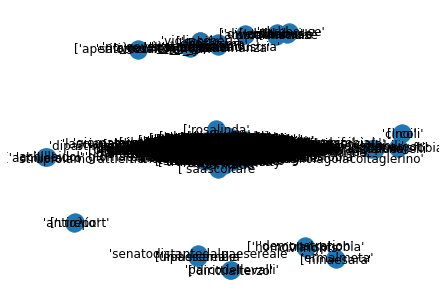

In [58]:
#Each row is an edge with a source and a target
G = nx.from_pandas_edgelist(df, source='Source', target='Target')
nx.draw(G,with_labels=True)

In [49]:
for n in G.nodes():
    print(n)
    pass

['cloebianco'
 'ddlzan'
 'diritti'
['ddlzan'
 'iussoli'
 'repubblica'
 'lgbt'
 'omotransfobia'
 'pd'
 'transfobia'
['lgbt'
 'omofobia'
['eutanasialegale'
 'meloni'
['meloni'
['renzi'
 'letta'
 'eutanasialegale'
 'stoptransfobia'
 'pride'
 'zan'
 'donazzandimettiti'
 'veneto'
 'belluno'
['omotransfobia'
 'lega'
 'salvini'
 'fedez'
 'roma'
 'elenadonazzan'
['salvini'
 'misgendering'
['pride'
 'stopomofobia'
['pd'
['omofobia'
['eutanasia'
 'redditodicittadinanza'
['fakenews'
 'vitalizio'
 'renzi'
 'gender'
 'noddlzan'
['noddlzan'
 'loveislove'
['letta'
 'senato'
['italiaviva'
 'milano'
['milano'
 'migranti'
['pridemonth2022'
 'greenpass'
 'matrimonioegualitario'
 'abilismo'
['famiglia'
 'padova'
['vaiolodellescimmie'
['fedez'
['palermo'
['pillon'
['stopomofobia'
['zan'
 'cosenza'
 '17maggio'
['leggezan'
['draghi'
 'ungheria'
 'orban'
 'italiaviva'
['greenpass'
['arcigay'
 'pdc'
 '27ottobre'
 'leggezan'
['conte'
['25aprile'
['chilhavisto'
 'ddlzan_subito_legge'
 'cittadinanza'
['studentiin

['daciamaraini'
 'quantestorie'
 'mariafra'
['stronger'
 'loveisintheair'
 'xfactor'
 'emma'
 'media'
 'maggioranza'
 'leggzan'
 'mafie'
 'corrotto'
['ddlzansubito'
['vergogna'
['lariachetira'
['rizzo'
 'manovra'
 'coffeebreak'
['articolo'
 'nonunpassoindietro'
 'stopomolesbobitransafobia'
 'richardgere'
['calenda'
 'civiltá'
 'omosessuali'
['massimoranieri'
 'rtl1025'
 'juliaroberts'
['arabiaviva'
 'paragone'
['nazivax'
 'miocuginonews'
 'terzadose'
 'voto'
 'parlamentari'
 'vergognosi'
 'dignità'
 'aumenti'
 'rincari'
 'quota102'
 'giovani'
['nazipass'
['tolleranza'
 'amministrative'
 'arcodellapace'
['messaggero'
 'mattino'
 'byebyeddlzan'
['emma'
['affossamento'
 'applausi'
 'riad'
 'applaudono'
['libero'
['giappone'
 'campagna'
 'vaccinale'
 'ivermectina'
 'popolazione'
 'dirittoerovescio'
 'apollo'
 'sardine'
 'moschea'
 'pisa'
 'pauradichi'
['loveisintheair'
 'xfactor2021'
['xfactor2021'
 'afghanistan'
 'arcigay'
 'live'
 'untemaalgiorno'
['saviano'
['formigli'
 'piazzapultia'
 

 '6000sardine'
['facebook'
 'facebookdown'
 'facebookban'
 'facebook_suppress_hindu_voices'
 'politicallycorrect'
 'xijinping'
['psi'
 'facebook'
 'carcere'
 'ricattorenzi'
 'vergognarenzi'
 'cricca'
['ricattorenzi'
['italiavivammerda'
 'legammerda'
 'matteommerda'
['montecitorio'
 'rignano'
 'cacciari'
['fedex'
['vergognarenzi'
 'coraggio'
['sfascisti'
['sessismo'
 'ciclismo'
['ondapride'
['tenerezza'
 'domenica'
 'legadeifratellidiforzaitaliaviva'
 'cdu'
 'conteter'
 'oconteoilvoto'
 'renzischif'
 'becciu'
 'sloaneavenue'
['napolipride'
 '3luglio'
 'londra'
 'connection'
 'renziano'
 'gaypride2021'
 'fascioleghisti'
['democratico'
 'condanna'
['3luglio'
 'baseriformista'
['malika'
 'recoveryplan'
['antifascista'
 'malika'
 'mercedes'
 'fessi'
['italiamortaccivostri'
 'rousseau'
['blacklivesmatter'
 '2luglio'
 'byoblu'
['laico'
['comunisti'
['gaza'
 'hamas'
 'temposcaduto'
['santamariacapuavetere'
['mercedes'
 'fondi'
 'buonisti'
['blm'
 'chiesapedofilia'
 'simonabaldassarre'
 'albert

 'pioeameeo'
 'buonagiornata'
 'marinaterragni'
 'oggi'
 '5maggio'
 'pps'
['5f'
 'togarossa'
 'lastampa'
['pinocchio'
 'finocchio'
 '4maggio'
['lauratecce'
 'tecce'
 'mansplanning'
 'dagospia'
 'tizianoferro'
 'primomaggio'
 'concertoprimomaggio'
 'ostruzionismo'
['lapeggior_destra_disempre'
 'babbi'
 'zerozero7'
['primomaggio'
 'gaynazismo'
 'bastoni'
['combattere'
 'votareserve'
['fiano'
 'suormonia'
['laltrastoria'
 'suormoniaalfieri'
 'capezzone'
 'vladimiroguadagno'
 'nonvireggopiù'
 'zanzanologi'
 'rosibraidotti'
['fedezzume'
 'wlart21'
 'wlalibertàdiopinione'
 'demaniacideltatuaggio'
['magistratura'
['censure'
 'concertoneprimomaggio'
 'ilariacapitani'
 '3maggio'
 'disoccupato'
['mes'
 'renzifamerenda'
 'dopodinoi'
['casofedez'
 'siperoisti'
['3maggio'
 'concerto1maggio'
['8maggio'
['salvinibloccami'
['alessandraamorosoday'
 'alessandraamoroso'
 'domenicain'
 'vittoriosgarbi'
['1m2021'
 'sindaco'
['barbaradurso'
 'barbaradurso'
 'concerto'
 'sfigadilegno'
 'bloccasalvini'
 '1m20

In [50]:
for e in G.edges():
    print(e)
    pass

("['cloebianco'", " 'ddlzan'")
("['cloebianco'", " 'diritti'")
("['cloebianco'", "['ddlzan'")
("['cloebianco'", " 'iussoli'")
("['cloebianco'", " 'repubblica'")
("['cloebianco'", " 'lgbt'")
("['cloebianco'", " 'omotransfobia'")
("['cloebianco'", " 'pd'")
("['cloebianco'", " 'transfobia'")
("['cloebianco'", "['lgbt'")
("['cloebianco'", " 'omofobia'")
("['cloebianco'", "['eutanasialegale'")
("['cloebianco'", " 'meloni'")
("['cloebianco'", "['meloni'")
("['cloebianco'", "['renzi'")
("['cloebianco'", " 'letta'")
("['cloebianco'", " 'eutanasialegale'")
("['cloebianco'", " 'stoptransfobia'")
("['cloebianco'", " 'pride'")
("['cloebianco'", " 'zan'")
("['cloebianco'", " 'donazzandimettiti'")
("['cloebianco'", " 'veneto'")
("['cloebianco'", " 'belluno'")
("['cloebianco'", "['omotransfobia'")
("['cloebianco'", " 'lega'")
("['cloebianco'", " 'salvini'")
("['cloebianco'", " 'fedez'")
("['cloebianco'", " 'roma'")
("['cloebianco'", " 'elenadonazzan'")
("['cloebianco'", "['salvini'")
("['cloebianco'"

(" 'ddlzan'", "['rivoltapride'")
(" 'ddlzan'", "['bari'")
(" 'ddlzan'", " 'centrodestra'")
(" 'ddlzan'", " 'napoli'")
(" 'ddlzan'", " 'lesbica'")
(" 'ddlzan'", "['genova'")
(" 'ddlzan'", " 'brescia'")
(" 'ddlzan'", " 'rimini'")
(" 'ddlzan'", " 'palermopride2021'")
(" 'ddlzan'", "['contagi'")
(" 'ddlzan'", "['ilovetorino'")
(" 'ddlzan'", " 'possibile'")
(" 'ddlzan'", "['sorpresa'")
(" 'ddlzan'", " 'gioia'")
(" 'ddlzan'", " 'orvinio'")
(" 'ddlzan'", " 'reggioemilia'")
(" 'ddlzan'", "['talebani'")
(" 'ddlzan'", " 'afganistan'")
(" 'ddlzan'", " 'moralisti'")
(" 'ddlzan'", " 'bigotti'")
(" 'ddlzan'", " 'applaudire'")
(" 'ddlzan'", " 'nega'")
(" 'ddlzan'", "['lapeggiore_destra_disempre'")
(" 'ddlzan'", "['moltopiudizan'")
(" 'ddlzan'", " 'tvtalk'")
(" 'ddlzan'", " 'aboliamoilconcordato'")
(" 'ddlzan'", " 'violenzadigenere'")
(" 'ddlzan'", " 'rivoltapride'")
(" 'ddlzan'", " 'rivoltapridebologna'")
(" 'ddlzan'", "['bellezza'")
(" 'ddlzan'", " 'piazze'")
(" 'ddlzan'", " 'piazzamaggiore'")
(" 'd

(" 'ddlzan'", " 'briatore'")
(" 'ddlzan'", " 'farinetti'")
(" 'ddlzan'", " 'debenedetti'")
(" 'ddlzan'", " 'nazareno'")
(" 'ddlzan'", "['bolzano'")
(" 'ddlzan'", " 'tajani'")
(" 'ddlzan'", " 'orbán'")
(" 'ddlzan'", "['castellani'")
(" 'ddlzan'", " 'chiaranonscappare'")
(" 'ddlzan'", " 'retwett'")
(" 'ddlzan'", " 'retweeetplease'")
(" 'ddlzan'", " 'gaudino'")
(" 'ddlzan'", "['ceccardi'")
(" 'ddlzan'", "['nichivendola'")
(" 'ddlzan'", " 'imanjane'")
(" 'ddlzan'", " 'influencer'")
(" 'ddlzan'", " 'artisti'")
(" 'ddlzan'", "['lacittà'")
(" 'ddlzan'", "['dimissioni'")
(" 'ddlzan'", "['sorge'")
(" 'ddlzan'", "['stopinfluencer'")
(" 'ddlzan'", "['pdino'")
(" 'ddlzan'", " 'frocionedimerda'")
(" 'ddlzan'", " 'sorgi'")
(" 'ddlzan'", " 'minotaricco'")
(" 'ddlzan'", " '7luglio'")
(" 'ddlzan'", "['bassetti'")
(" 'ddlzan'", " 'movida'")
(" 'ddlzan'", " 'discoteche'")
(" 'ddlzan'", "['populismo'")
(" 'ddlzan'", " 'cappato'")
(" 'ddlzan'", " 'lampedusa'")
(" 'ddlzan'", " 'castellani'")
(" 'ddlzan'", "

(" 'ddlzan'", "['musica'")
(" 'ddlzan'", " 'passione'")
(" 'ddlzan'", " 'lirica'")
(" 'ddlzan'", "['giovanardi'")
(" 'ddlzan'", " 'elettori'")
(" 'ddlzan'", "['massoneria'")
(" 'ddlzan'", " 'isentinelli'")
(" 'ddlzan'", "['ilcattivopensiero'")
(" 'ddlzan'", "['fedezddlzan'")
(" 'ddlzan'", "['antinoo'")
(" 'ddlzan'", "['tempoascaduto'")
(" 'ddlzan'", "['sentinelli'")
(" 'ddlzan'", " 'ddlzanmilano'")
(" 'ddlzan'", " 'pippobaudo'")
(" 'ddlzan'", "['baudo'")
(" 'ddlzan'", "['circeo'")
(" 'ddlzan'", " 'neanderthal'")
(" 'ddlzan'", "['iltempoèscaduto'")
(" 'ddlzan'", " 'concertone'")
(" 'ddlzan'", "['pose'")
(" 'ddlzan'", " 'nopasaran'")
(" 'ddlzan'", " '7maggio'")
(" 'ddlzan'", " 'bookmorning'")
(" 'ddlzan'", "['5sciacalli'")
(" 'ddlzan'", " 'varianti'")
(" 'ddlzan'", " 'amala'")
(" 'ddlzan'", " 'arcopace'")
(" 'ddlzan'", " 'noalbavaglio'")
(" 'ddlzan'", "['noiamiamochicipare'")
(" 'ddlzan'", " '8maggio'")
(" 'ddlzan'", "['babbi'")
(" 'ddlzan'", " 'autogrill'")
(" 'ddlzan'", " 'contestazion

(" 'diritti'", " 'omofobe'")
(" 'diritti'", " 'sessiste'")
(" 'diritti'", " 'sinistraitaliana'")
(" 'diritti'", "['prodi'")
(" 'diritti'", "['vergognatevi'")
(" 'diritti'", " '2novembre'")
(" 'diritti'", " 'reportrai3'")
(" 'diritti'", " 'iusssoli'")
(" 'diritti'", "['fascismo'")
(" 'diritti'", " 'rai3'")
(" 'diritti'", " 'portualiditrieste'")
(" 'diritti'", "['farfalle'")
(" 'diritti'", " 'footballamericano'")
(" 'diritti'", "['arcigaynapoli'")
(" 'diritti'", "['cerno'")
(" 'diritti'", "['halloween'")
(" 'diritti'", " 'g20'")
(" 'diritti'", " '31ottobre'")
(" 'diritti'", " 'tagliola'")
(" 'diritti'", " 'noodio'")
(" 'diritti'", " 'dio'")
(" 'diritti'", "['fascisti_e_vigliacchi'")
(" 'diritti'", " 'zucca'")
(" 'diritti'", " 'festanazionale'")
(" 'diritti'", " 'festadellarepubblica'")
(" 'diritti'", " 'rappresentazione'")
(" 'diritti'", " 'classepolitica'")
(" 'diritti'", " 'negazione'")
(" 'diritti'", " 'nogreenpassobligatorio'")
(" 'diritti'", " 'covidiots'")
(" 'diritti'", "['umbria'

("['ddlzan'", " 'terapiediconversione'")
("['ddlzan'", "['cile'")
("['ddlzan'", " 'nozzegay'")
("['ddlzan'", "['patrickzaki'")
("['ddlzan'", " 'sexnotgender'")
("['ddlzan'", " 'ragazze'")
("['ddlzan'", "['danimarca'")
("['ddlzan'", " 'pontida'")
("['ddlzan'", " '6dicembre'")
("['ddlzan'", " 'sessismo'")
("['ddlzan'", " 'tari'")
("['ddlzan'", " 'solidarietà'")
("['ddlzan'", " 'grazierenzi'")
("['ddlzan'", "['senato'")
("['ddlzan'", " 'lotito'")
("['ddlzan'", " 'votosegreto'")
("['ddlzan'", " 'franchitiratori'")
("['ddlzan'", "['platinette'")
("['ddlzan'", " 'mauriziocostanzoshow'")
("['ddlzan'", " 'zorzi'")
("['ddlzan'", "['3dicembre'")
("['ddlzan'", " 'platinette'")
("['ddlzan'", " 'maurocoruzzi'")
("['ddlzan'", " 'privilegi'")
("['ddlzan'", " 'vittimismo'")
("['ddlzan'", " 'tommasozorzi'")
("['ddlzan'", " 'ascolipiceno'")
("['ddlzan'", " 'soul'")
("['ddlzan'", " 'udc'")
("['ddlzan'", "['2dicembre'")
("['ddlzan'", " 'europarlamento'")
("['ddlzan'", " 'natale'")
("['ddlzan'", " 'maria'"

("['ddlzan'", "['italiamorta'")
("['ddlzan'", " 'idealstandard'")
("['ddlzan'", "['agorarai'")
("['ddlzan'", " 'bellanova'")
("['ddlzan'", "['mafia'")
("['ddlzan'", " 'salvinisciacallo'")
("['ddlzan'", "['radioradicale'")
("['ddlzan'", "['notinmyname'")
("['ddlzan'", " 'parlamentoitaliano'")
("['ddlzan'", "['votosegreto'")
("['ddlzan'", "['hastatorenzi'")
("['ddlzan'", "['radioanchio'")
("['ddlzan'", " 'matteorenzi'")
("['ddlzan'", " 'antisociali'")
("['ddlzan'", " 'tripletta'")
("['ddlzan'", " 'paraolimpiadi'")
("['ddlzan'", " 'tokyo'")
("['ddlzan'", "['usa'")
("['ddlzan'", " 'italiamorta'")
("['ddlzan'", "['franchitiratori'")
("['ddlzan'", "['pdnetwork'")
("['ddlzan'", "['discriminazioni'")
("['ddlzan'", " 'sociale'")
("['ddlzan'", "['droga'")
("['ddlzan'", " 'papafrancesco'")
("['ddlzan'", "['donandregallo'")
("['ddlzan'", " 'leggefornero'")
("['ddlzan'", " 'comics'")
("['ddlzan'", "['loureed'")
("['ddlzan'", "['shame'")
("['ddlzan'", "['unioneeuropea'")
("['ddlzan'", " 'natale2021'

("['ddlzan'", "['iononstoconorban'")
("['ddlzan'", " 'iostoconleuropa'")
("['ddlzan'", " 'blacklivesmetter'")
("['ddlzan'", "['lavoratori'")
("['ddlzan'", " 'inginocchiare'")
("['ddlzan'", " 'dichiarazioni'")
("['ddlzan'", "['urbinati'")
("['ddlzan'", "['flick'")
("['ddlzan'", " 'iomiinginocchio'")
("['ddlzan'", "['galattino'")
("['ddlzan'", " 'santasede'")
("['ddlzan'", "['patuanelli'")
("['ddlzan'", " 'spintimelabs'")
("['ddlzan'", " 'puglisi'")
("['ddlzan'", " 'pontifex'")
("['ddlzan'", "['iostoconorban'")
("['ddlzan'", " 'prideweek'")
("['ddlzan'", " 'gulag'")
("['ddlzan'", " 'cheguevara'")
("['ddlzan'", " 'imprese'")
("['ddlzan'", " 'vaccinocovid'")
("['ddlzan'", " 'sanità'")
("['ddlzan'", "['stopgender'")
("['ddlzan'", " 'saviano'")
("['ddlzan'", " 'tagadala7'")
("['ddlzan'", " '24giugno'")
("['ddlzan'", " 'rosybindi'")
("['ddlzan'", " 'parlamentosovrano'")
("['ddlzan'", " 'ciccarelli'")
("['ddlzan'", "['alessandramussolini'")
("['ddlzan'", " 'falene'")
("['ddlzan'", " 'ingerenza

(" 'iussoli'", " 'pregliasco'")
(" 'iussoli'", " 'ciampolillo'")
(" 'iussoli'", " 'simonebaroni'")
(" 'iussoli'", "['amici'")
(" 'iussoli'", " 'mariadefilippi'")
(" 'iussoli'", " 'drusilla'")
(" 'iussoli'", " '13gennaio'")
(" 'iussoli'", " 'sanremo2022'")
(" 'iussoli'", " 'referendumcaccia'")
(" 'iussoli'", " 'down'")
(" 'iussoli'", " 'sestofiorentino'")
(" 'iussoli'", " '10dicembre'")
(" 'iussoli'", "['roggiani'")
(" 'iussoli'", " 'stupro'")
(" 'iussoli'", " 'morelli'")
(" 'iussoli'", "['toti'")
(" 'iussoli'", " 'torino'")
(" 'iussoli'", "['buongiornoatutti'")
(" 'iussoli'", "['resiatiamo'")
(" 'iussoli'", " 'propagandalive'")
(" 'iussoli'", "['svizzera'")
(" 'iussoli'", " '30dicembre'")
(" 'iussoli'", " 'tampontax'")
(" 'iussoli'", " 'laicità'")
(" 'iussoli'", " 'vaticano'")
(" 'iussoli'", "['unannosenzadiritti'")
(" 'iussoli'", "['vigiliadinatale'")
(" 'iussoli'", "['tuiach'")
(" 'iussoli'", "['iostoconmimmolucano'")
(" 'iussoli'", " 'ilfascismoéreato'")
(" 'iussoli'", "['borgonovo'

(" 'lgbt'", "['pridemonth'")
(" 'lgbt'", " 'democrazia'")
(" 'lgbt'", "['cognomi'")
(" 'lgbt'", " 'lgbqt'")
(" 'lgbt'", "['pridemonth2022'")
(" 'lgbt'", "['repubblica'")
(" 'lgbt'", "['biden'")
(" 'lgbt'", " 'abortomicidio'")
(" 'lgbt'", " 'greenpass'")
(" 'lgbt'", " 'obbligovaccinale'")
(" 'lgbt'", "['censura'")
(" 'lgbt'", " 'chetempochefa'")
(" 'lgbt'", " 'fazio'")
(" 'lgbt'", " 'rai'")
(" 'lgbt'", " 'chiesa'")
(" 'lgbt'", " 'lgbtiq'")
(" 'lgbt'", "['sportfemminili'")
(" 'lgbt'", " 'noomofobia'")
(" 'lgbt'", " 'matrimonioegualitario'")
(" 'lgbt'", " 'dirittinegati'")
(" 'lgbt'", " 'ancheoggilettatace'")
(" 'lgbt'", " 'spininelfianco'")
(" 'lgbt'", " 'ciaopd'")
(" 'lgbt'", "['femminista'")
(" 'lgbt'", " 'femminista'")
(" 'lgbt'", "['parlamento'")
(" 'lgbt'", " '1giugno'")
(" 'lgbt'", " 'rainbowdays'")
(" 'lgbt'", " 'prideseason'")
(" 'lgbt'", " 'transrightsarehumanrights'")
(" 'lgbt'", " 'humanrights'")
(" 'lgbt'", " 'transwomenarewomen'")
(" 'lgbt'", " 'orgogliogay'")
(" 'lgbt'", " 

(" 'lgbt'", "['leytrans'")
(" 'lgbt'", "['lobbygay'")
(" 'lgbt'", " '6luglio'")
(" 'lgbt'", " 'dalema'")
(" 'lgbt'", " 'cuperlo'")
(" 'lgbt'", " 'marino'")
(" 'lgbt'", "['amarcord'")
(" 'lgbt'", " 'pertini'")
(" 'lgbt'", "['marattin'")
(" 'lgbt'", " 'oriettaberti'")
(" 'lgbt'", " 'ferrari'")
(" 'lgbt'", "['coraggio'")
(" 'lgbt'", " '6giugno'")
(" 'lgbt'", "['fico'")
(" 'lgbt'", "['azzolina'")
(" 'lgbt'", "['recuperiamoleparole'")
(" 'lgbt'", " 'lunedi'")
(" 'lgbt'", " 'maschietto'")
(" 'lgbt'", " 'femminuccia'")
(" 'lgbt'", " 'regeni'")
(" 'lgbt'", " 'eccheccazzo'")
(" 'lgbt'", " 'azzolina'")
(" 'lgbt'", " '5luglio'")
(" 'lgbt'", "['5luglio'")
(" 'lgbt'", " 'emendamento'")
(" 'lgbt'", " 'ehefüralle'")
(" 'lgbt'", "['omofobo'")
(" 'lgbt'", " '4luglio'")
(" 'lgbt'", "['4luglio'")
(" 'lgbt'", "['facebook'")
(" 'lgbt'", " 'politicallycorrect'")
(" 'lgbt'", "['psi'")
(" 'lgbt'", " 'facebook'")
(" 'lgbt'", " 'cacciari'")
(" 'lgbt'", "['sessismo'")
(" 'lgbt'", " 'ciclismo'")
(" 'lgbt'", "['on

(" 'omotransfobia'", "['newprofilepic'")
(" 'omotransfobia'", " 'transomolesbobifobia'")
(" 'omotransfobia'", " 'webcomics'")
(" 'omotransfobia'", " 'antoniocabras'")
(" 'omotransfobia'", " 'violenze'")
(" 'omotransfobia'", "['democrazia'")
(" 'omotransfobia'", "['nonsononessuno'")
(" 'omotransfobia'", " 'iononesisto'")
(" 'omotransfobia'", "['fascisti'")
(" 'omotransfobia'", "['restiamoliberi'")
(" 'omotransfobia'", " 'borghi'")
(" 'omotransfobia'", " 'varese'")
(" 'omotransfobia'", " 'pride2021'")
(" 'omotransfobia'", " 'stopddlzan'")
(" 'omotransfobia'", " 'bellanova'")
(" 'omotransfobia'", " 'salvinisciacallo'")
(" 'omotransfobia'", "['notinmyname'")
(" 'omotransfobia'", "['votosegreto'")
(" 'omotransfobia'", " 'matteorenzi'")
(" 'omotransfobia'", "['usa'")
(" 'omotransfobia'", " 'italiamorta'")
(" 'omotransfobia'", "['franchitiratori'")
(" 'omotransfobia'", "['discriminazioni'")
(" 'omotransfobia'", " 'papafrancesco'")
(" 'omotransfobia'", "['loureed'")
(" 'omotransfobia'", " 'bas

(" 'pd'", "['domani'")
(" 'pd'", "['crotone'")
(" 'pd'", " 'coglione'")
(" 'pd'", "['giustizia'")
(" 'pd'", " 'legaassissina'")
(" 'pd'", " 'partito'")
(" 'pd'", "['22luglio'")
(" 'pd'", " 'antonellafaggi'")
(" 'pd'", " 'diversitá'")
(" 'pd'", " 'ferragnez'")
(" 'pd'", "['ettoremariacolombo'")
(" 'pd'", " 'emendamenti'")
(" 'pd'", " 'iostoconborghi'")
(" 'pd'", " '21luglio'")
(" 'pd'", " 'animebelle'")
(" 'pd'", " 'riformadellagiustizia'")
(" 'pd'", "['21luglio'")
(" 'pd'", " 'cinquestelle'")
(" 'pd'", " 'hashtag'")
(" 'pd'", " 'riformagiustizia'")
(" 'pd'", " 'pascale'")
(" 'pd'", " 'sostegnibis'")
(" 'pd'", " 'fiducia'")
(" 'pd'", " 'formigoni'")
(" 'pd'", " 'votate_oggi_ddlzan'")
(" 'pd'", "['binetti'")
(" 'pd'", " 'saman'")
(" 'pd'", " 'orwelliano'")
(" 'pd'", " 'merdeomofobe'")
(" 'pd'", " 'leggezansubito'")
(" 'pd'", "['whirlpool'")
(" 'pd'", " 'pianodipoliticaeriqualificazioneindustriale'")
(" 'pd'", "['studio24'")
(" 'pd'", "['capanna'")
(" 'pd'", " 'negazionisti'")
(" 'pd'", "

("['lgbt'", "['lesbofobia'")
("['lgbt'", "['bignami'")
("['lgbt'", " 'talebani'")
("['lgbt'", "['worldpride'")
("['lgbt'", " 'mettefrederiksen'")
("['lgbt'", "['fuoriinomi'")
("['lgbt'", "['thread'")
("['lgbt'", "['rainbow'")
("['lgbt'", "['ferragosto'")
("['lgbt'", " 'licenziamenti'")
("['lgbt'", " 'zaia'")
("['lgbt'", " 'sanremo'")
("['lgbt'", " 'tv'")
("['lgbt'", " 'stop'")
("['lgbt'", "['olimpiadi'")
("['lgbt'", " 'tassadisuccessione'")
("['lgbt'", " 'foggia'")
("['lgbt'", " 'sangue'")
("['lgbt'", " 'tokyo2020'")
("['lgbt'", "['instagram'")
("['lgbt'", "['fognini'")
("['lgbt'", "['faraone'")
("['lgbt'", "['controcorrente'")
("['lgbt'", " 'lgtbq'")
("['lgbt'", " 'fognini'")
("['lgbt'", " 'ferragni'")
("['lgbt'", "['adrieli'")
("['lgbt'", " 'cartabia'")
("['lgbt'", "['tomdaley'")
("['lgbt'", " 'olimpiadi'")
("['lgbt'", "['tokyo2020'")
("['lgbt'", "['giuseppeconte'")
("['lgbt'", "['nonmifidodellalega'")
("['lgbt'", "['crotone'")
("['lgbt'", "['giustizia'")
("['lgbt'", " 'ferragnez'")


(" 'omofobia'", "['ue'")
(" 'omofobia'", " 'leggemancino'")
(" 'omofobia'", " 'adozioni'")
(" 'omofobia'", "['27ottobre'")
(" 'omofobia'", " 'terni'")
(" 'omofobia'", " 'restiamoliberi'")
(" 'omofobia'", "['palermopride'")
(" 'omofobia'", " 'stoputeroinaffitto'")
(" 'omofobia'", "['zurlo'")
(" 'omofobia'", " 'presidente'")
(" 'omofobia'", "['gandolfini'")
(" 'omofobia'", " 'medioevo'")
(" 'omofobia'", " 'santainquisizione'")
(" 'omofobia'", " 'piazzapulita'")
(" 'omofobia'", " 'familyday'")
(" 'omofobia'", " 'gandolfini'")
(" 'omofobia'", " 'orientamentosessuale'")
(" 'omofobia'", "['governo'")
(" 'omofobia'", "['infrastrutture'")
(" 'omofobia'", "['dibattista'")
(" 'omofobia'", "['m5s'")
(" 'omofobia'", "['ferrara'")
(" 'omofobia'", " 'dibattista'")
(" 'omofobia'", " 'vergogna'")
(" 'omofobia'", "['itala'")
(" 'omofobia'", " 'governodraghi'")
(" 'omofobia'", " 'puzzer'")
(" 'omofobia'", " 'puzzerdaspo'")
(" 'omofobia'", "['gandhi'")
(" 'omofobia'", "['presidentedellarepubblica'")
(" '

(" 'meloni'", " 'renzifaischifo'")
(" 'meloni'", "['enricoletta'")
(" 'meloni'", " 'cattolicesimo'")
(" 'meloni'", "['unionicivili'")
(" 'meloni'", " 'italiaviva'")
(" 'meloni'", " 'camera'")
(" 'meloni'", " 'giornatainternazionalecontrolomofobia'")
(" 'meloni'", "['idahobit2022'")
(" 'meloni'", "['greenpass'")
(" 'meloni'", " 'fakenews'")
(" 'meloni'", "['omobitransfobia'")
(" 'meloni'", "['raffaellacarra'")
(" 'meloni'", " 'pdc'")
(" 'meloni'", " '27ottobre'")
(" 'meloni'", " 'lobby'")
(" 'meloni'", " 'comunisti'")
(" 'meloni'", "['lgbtqi'")
(" 'meloni'", "['selfid'")
(" 'meloni'", " 'alias'")
(" 'meloni'", " 'leggezan'")
(" 'meloni'", "['omofobi'")
(" 'meloni'", " 'ddlzanemoltopiu'")
(" 'meloni'", "['èlitaliachevogliamo'")
(" 'meloni'", "['mirabelli'")
(" 'meloni'", "['conte'")
(" 'meloni'", " '11maggio'")
(" 'meloni'", " 'salvinivergognati'")
(" 'meloni'", "['11maggio'")
(" 'meloni'", " 'omofobo'")
(" 'meloni'", " 'cirinnà'")
(" 'meloni'", " 'malpezzi'")
(" 'meloni'", "['4maggio'")

("['meloni'", "['cerno'")
("['meloni'", "['halloween'")
("['meloni'", " 'halloween2021'")
("['meloni'", " 'halloween21'")
("['meloni'", " 'buonadomenica'")
("['meloni'", " '31ottobre'")
("['meloni'", " 'tagliola'")
("['meloni'", " 'zucca'")
("['meloni'", " 'piazzacarignano'")
("['meloni'", " 'nogreenpassobligatorio'")
("['meloni'", " 'covidiots'")
("['meloni'", " 'coronavirus'")
("['meloni'", "['ballandoconlestelle'")
("['meloni'", " 'renziani'")
("['meloni'", "['sicilia'")
("['meloni'", " 'ddlzanbucato'")
("['meloni'", " 'cirinna'")
("['meloni'", "['pride2021'")
("['meloni'", " 'centrodestra'")
("['meloni'", "['lapeggiore_destra_disempre'")
("['meloni'", " 'tvtalk'")
("['meloni'", "['terni'")
("['meloni'", "['30ottobre'")
("['meloni'", " 'marioadinolfi'")
("['meloni'", "['polonia'")
("['meloni'", "['karmab'")
("['meloni'", "['berlusconi'")
("['meloni'", "['propagandalive'")
("['meloni'", "['ddlzanleggecontroomofobia'")
("['meloni'", "['xf2021'")
("['meloni'", "['ercolano'")
("['meloni

("['renzi'", " 'imitare'")
("['renzi'", " 'coglioni'")
("['renzi'", " 'droga'")
("['renzi'", " 'eliovito'")
("['renzi'", " 'montecitorio'")
("['renzi'", " 'panchine'")
("['renzi'", " '28novembre'")
("['renzi'", "['ddlzan_subito_legge'")
("['renzi'", "['27novembre'")
("['renzi'", " 'statigenerali'")
("['renzi'", "['eliovito'")
("['renzi'", " '27novembre'")
("['renzi'", " 'senesentivalanecessità'")
("['renzi'", "['26novembre'")
("['renzi'", " 'liceocavour'")
("['renzi'", "['violenzasulledonne'")
("['renzi'", " '25novembre'")
("['renzi'", " '26novembre'")
("['renzi'", " 'sentinelli'")
("['renzi'", "['michelebravi'")
("['renzi'", "['25novembre'")
("['renzi'", " 'giornatacontrolaviolenzasulledonne'")
("['renzi'", " 'bonetti'")
("['renzi'", "['bonetti'")
("['renzi'", " 'controlaviolenzasulledonne'")
("['renzi'", " 'famigliearcobaleno'")
("['renzi'", " 'femminicidio'")
("['renzi'", "['roma'")
("['renzi'", " '23novembre'")
("['renzi'", " 'barista'")
("['renzi'", " 'maiorino'")
("['renzi'", " '

(" 'letta'", " 'udc'")
(" 'letta'", "['2dicembre'")
(" 'letta'", " 'europarlamento'")
(" 'letta'", " 'natale'")
(" 'letta'", " 'maria'")
(" 'letta'", " 'gesu'")
(" 'letta'", " '2dicembre'")
(" 'letta'", "['topogigio'")
(" 'letta'", " 'facci'")
(" 'letta'", " 'gretabaccaglia'")
(" 'letta'", " '1dicembre'")
(" 'letta'", "['europarlamento'")
(" 'letta'", " 'panchina'")
(" 'letta'", " 'inclusivita'")
(" 'letta'", "['natale'")
(" 'letta'", " 'modena'")
(" 'letta'", " '30novembre'")
(" 'letta'", " 'covid_19'")
(" 'letta'", " 'trump'")
(" 'letta'", " 'sicilia'")
(" 'letta'", "['misoginia'")
(" 'letta'", " 'papillon'")
(" 'letta'", " 'gonna'")
(" 'letta'", " 'ddlzanleggecontroomofobia'")
(" 'letta'", " '29novembre'")
(" 'letta'", "['28novembre'")
(" 'letta'", " 'imitare'")
(" 'letta'", " 'coglioni'")
(" 'letta'", " 'droga'")
(" 'letta'", " 'eliovito'")
(" 'letta'", " 'montecitorio'")
(" 'letta'", " 'panchine'")
(" 'letta'", " '28novembre'")
(" 'letta'", "['ddlzan_subito_legge'")
(" 'letta'", "

(" 'eutanasialegale'", "['ricattorenzi'")
(" 'eutanasialegale'", " 'legadeifratellidiforzaitaliaviva'")
(" 'eutanasialegale'", " 'cdu'")
(" 'eutanasialegale'", "['malika'")
(" 'eutanasialegale'", "['antifascista'")
(" 'eutanasialegale'", " 'temposcaduto'")
(" 'eutanasialegale'", "['enna'")
(" 'eutanasialegale'", " 'fuoriinomi'")
(" 'eutanasialegale'", "['milanopride'")
(" 'eutanasialegale'", "['orlando'")
(" 'eutanasialegale'", "['pridemonth2021'")
(" 'eutanasialegale'", "['leyen'")
(" 'eutanasialegale'", " 'cristolgbt'")
(" 'eutanasialegale'", " 'mancino'")
(" 'eutanasialegale'", "['iononstoconorban'")
(" 'eutanasialegale'", " 'iostoconleuropa'")
(" 'eutanasialegale'", " '24giugno'")
(" 'eutanasialegale'", " 'abolishfrontex'")
(" 'eutanasialegale'", " 'paridirittilavoro'")
(" 'eutanasialegale'", " 'aumentosalario'")
(" 'eutanasialegale'", " 'riformairpef'")
(" 'eutanasialegale'", " 'scuolapubblica'")
(" 'eutanasialegale'", "['24giugno'")
(" 'eutanasialegale'", " '23giugno'")
(" 'eutan

(" 'zan'", "['europarlamento'")
(" 'zan'", " 'panchina'")
(" 'zan'", " 'inclusivita'")
(" 'zan'", "['natale'")
(" 'zan'", " 'modena'")
(" 'zan'", " '30novembre'")
(" 'zan'", "['arcobaleno'")
(" 'zan'", "['misoginia'")
(" 'zan'", " 'papillon'")
(" 'zan'", " 'gonna'")
(" 'zan'", " 'ddlzanleggecontroomofobia'")
(" 'zan'", " '29novembre'")
(" 'zan'", " 'droga'")
(" 'zan'", " '28novembre'")
(" 'zan'", "['ddlzan_subito_legge'")
(" 'zan'", "['eliovito'")
(" 'zan'", " '27novembre'")
(" 'zan'", " 'senesentivalanecessità'")
(" 'zan'", "['violenzasulledonne'")
(" 'zan'", " '25novembre'")
(" 'zan'", " '26novembre'")
(" 'zan'", " 'sentinelli'")
(" 'zan'", " 'bonetti'")
(" 'zan'", "['bonetti'")
(" 'zan'", " 'femminicidio'")
(" 'zan'", " 'maiorino'")
(" 'zan'", " 'forzanuova'")
(" 'zan'", "['novax'")
(" 'zan'", " 'circomassimo'")
(" 'zan'", " '22novembre'")
(" 'zan'", "['tdor'")
(" 'zan'", " 'tdor2021'")
(" 'zan'", " 'transfreedommarch'")
(" 'zan'", " 'personetrans'")
(" 'zan'", "['cuzzocrea'")
(" 'z

("['omotransfobia'", "['michellehunziker'")
("['omotransfobia'", " 'gerryscotti'")
("['omotransfobia'", " 'barilla'")
("['omotransfobia'", "['vanityfair'")
("['omotransfobia'", " 'zaki_cittadino_italiano'")
("['omotransfobia'", "['vita'")
("['omotransfobia'", "['stopzan'")
("['omotransfobia'", "['propagandatop'")
("['omotransfobia'", " 'libertàdipensiero'")
("['omotransfobia'", " 'giordano'")
("['omotransfobia'", " 'coercizione'")
("['omotransfobia'", "['petizione'")
("['omotransfobia'", "['francescamichielin'")
("['omotransfobia'", "['vittoriosgarbi'")
("['omotransfobia'", " '4aprile'")
("['omotransfobia'", "['reato'")
("['omotransfobia'", "['salvinimmerda'")
("['omotransfobia'", " 'tempodilegge'")
(" 'lega'", " 'dirittiumani'")
(" 'lega'", " 'diritticivili'")
(" 'lega'", "['transfobia'")
(" 'lega'", "['iussoli'")
(" 'lega'", "['adinolfi'")
(" 'lega'", "['gender'")
(" 'lega'", " 'politicamentecorretto'")
(" 'lega'", "['adozioni'")
(" 'lega'", " 'bibbiano'")
(" 'lega'", " 'eutanasia'")

(" 'lega'", "['lgtbiq'")
(" 'lega'", " 'conferenzastampa'")
(" 'lega'", "['washington'")
(" 'lega'", " 'marijuana'")
(" 'lega'", " 'omosex'")
(" 'lega'", " 'stonewall'")
(" 'lega'", " 'audizioni'")
(" 'lega'", "['7giugno'")
(" 'lega'", " 'orgogliosamente'")
(" 'lega'", "['nordio'")
(" 'lega'", "['fuorilarabbia'")
(" 'lega'", " '4giugno'")
(" 'lega'", " 'giovanniflick'")
(" 'lega'", " 'genitore1'")
(" 'lega'", " 'genitore2'")
(" 'lega'", " 'padre'")
(" 'lega'", " '30maggio'")
(" 'lega'", " 'pudore'")
(" 'lega'", "['1giugno'")
(" 'lega'", "['tuesday'")
(" 'lega'", " 'tuesdayvibe'")
(" 'lega'", " 'marteddlzan'")
(" 'lega'", " 'noiamiamochicipare'")
(" 'lega'", "['formigoni'")
(" 'lega'", " 'legaviva'")
(" 'lega'", " 'coprifuoco'")
(" 'lega'", " 'paesibassi'")
(" 'lega'", "['28maggio'")
(" 'lega'", " 'samanthacristoforetti'")
(" 'lega'", " 'comandantestazionespaziale'")
(" 'lega'", " 'cristoforetti'")
(" 'lega'", " 'auroraleone'")
(" 'lega'", " 'maschilismo'")
(" 'lega'", "['complottisti'"

(" 'salvini'", "['breaking'")
(" 'salvini'", " 'opensenato'")
(" 'salvini'", "['maiorino'")
(" 'salvini'", "['fi'")
(" 'salvini'", " 'tuiach'")
(" 'salvini'", "['opensenato'")
(" 'salvini'", " 'durigon'")
(" 'salvini'", "['centrodestra'")
(" 'salvini'", " 'legaladrona'")
(" 'salvini'", " 'bernini'")
(" 'salvini'", " 'forza'")
(" 'salvini'", " 'la'")
(" 'salvini'", " 'faraone'")
(" 'salvini'", " 'vladimirluxuria'")
(" 'salvini'", " 'fico'")
(" 'salvini'", "['lepore'")
(" 'salvini'", " 'religione'")
(" 'salvini'", " 'ballottaggi2021'")
(" 'salvini'", " 'priorità'")
(" 'salvini'", " 'fascista'")
(" 'salvini'", "['comingoutday'")
(" 'salvini'", " '11ottobre'")
(" 'salvini'", "['senzapaura'")
(" 'salvini'", " '1ottobre'")
(" 'salvini'", " 'buonanotte'")
(" 'salvini'", "['amministrative'")
(" 'salvini'", " '30settembre'")
(" 'salvini'", " 'festini'")
(" 'salvini'", " '29settembre'")
(" 'salvini'", " 'orgia'")
(" 'salvini'", "['maurocoruzzi'")
(" 'salvini'", " 'egonu'")
(" 'salvini'", " 'scia

(" 'fedez'", "['europarlamento'")
(" 'fedez'", " 'panchina'")
(" 'fedez'", " 'inclusivita'")
(" 'fedez'", "['natale'")
(" 'fedez'", " 'modena'")
(" 'fedez'", " '30novembre'")
(" 'fedez'", "['arcobaleno'")
(" 'fedez'", "['unapanchinaarcobalenoamontecitorio'")
(" 'fedez'", " 'covid_19'")
(" 'fedez'", " 'trump'")
(" 'fedez'", " 'sicilia'")
(" 'fedez'", "['misoginia'")
(" 'fedez'", " 'papillon'")
(" 'fedez'", " 'gonna'")
(" 'fedez'", " 'ddlzanleggecontroomofobia'")
(" 'fedez'", " '29novembre'")
(" 'fedez'", "['28novembre'")
(" 'fedez'", " 'imitare'")
(" 'fedez'", " 'coglioni'")
(" 'fedez'", " 'droga'")
(" 'fedez'", " 'eliovito'")
(" 'fedez'", " 'montecitorio'")
(" 'fedez'", " 'panchine'")
(" 'fedez'", " '28novembre'")
(" 'fedez'", "['ddlzan_subito_legge'")
(" 'fedez'", "['27novembre'")
(" 'fedez'", " 'statigenerali'")
(" 'fedez'", "['eliovito'")
(" 'fedez'", " '27novembre'")
(" 'fedez'", " 'senesentivalanecessità'")
(" 'fedez'", "['26novembre'")
(" 'fedez'", " 'liceocavour'")
(" 'fedez'", 

(" 'fedez'", " 'comencini'")
(" 'fedez'", "['figli'")
(" 'fedez'", " 'razzi'")
(" 'fedez'", " 'distrofia'")
(" 'fedez'", "['michellehunziker'")
(" 'fedez'", " 'gerryscotti'")
(" 'fedez'", " 'barilla'")
(" 'fedez'", " 'cambiateonorevole'")
(" 'fedez'", "['dadgad'")
(" 'fedez'", " 'colors'")
(" 'fedez'", " 'uguali'")
(" 'fedez'", "['populisti'")
(" 'fedez'", " 'moderati'")
(" 'fedez'", " 'liberali'")
(" 'fedez'", " 'euroscettici'")
(" 'fedez'", " 'rizzo'")
(" 'fedez'", " 'ibambinisonobambini'")
(" 'fedez'", "['fascio'")
(" 'fedez'", "['16aprile'")
(" 'fedez'", "['marcorizzo'")
(" 'fedez'", " 'caliendo'")
(" 'fedez'", "['donatellaversace'")
(" 'fedez'", " '15aprile'")
(" 'fedez'", " 'astrazeneca'")
(" 'fedez'", " 'islamica'")
(" 'fedez'", "['vita'")
(" 'fedez'", "['stopzan'")
(" 'fedez'", " 'simonelliva'")
(" 'fedez'", " 'intercettazioni'")
(" 'fedez'", " 'libertàdipensiero'")
(" 'fedez'", " 'giordano'")
(" 'fedez'", " 'lolchirideefuori'")
(" 'fedez'", " 'robadapazzi'")
(" 'fedez'", "['lo

(" 'roma'", "['lucca'")
(" 'roma'", " 'etero'")
(" 'roma'", " '15maggio'")
(" 'roma'", " 'tampax'")
(" 'roma'", "['ddlzanemoltopiu'")
(" 'roma'", " 'dàvocealrispetto'")
(" 'roma'", "['rulajebreal'")
(" 'roma'", "['15maggio'")
(" 'roma'", "['piueuropa'")
(" 'roma'", " 'pechino'")
(" 'roma'", " 'raidue'")
(" 'roma'", " 'gaza_under_attack'")
(" 'roma'", "['feltrinelli'")
(" 'roma'", "['gervasoni'")
(" 'roma'", "['servizisegreti'")
(" 'roma'", "['13maggio'")
(" 'roma'", " 'youtube'")
(" 'roma'", " '12maggio'")
(" 'roma'", " 'fano'")
(" 'roma'", "['diegofusaro'")
(" 'roma'", " 'torbella'")
(" 'roma'", "['10maggio'")
(" 'roma'", " 'inter'")
(" 'roma'", " '9maggio'")
(" 'roma'", " 'zoccola'")
(" 'roma'", "['9maggio'")
(" 'roma'", "['navigli'")
(" 'roma'", "['antinoo'")
(" 'roma'", "['sentinelli'")
(" 'roma'", " 'ddlzanmilano'")
(" 'roma'", " 'pippobaudo'")
(" 'roma'", "['baudo'")
(" 'roma'", " 'concertone'")
(" 'roma'", " '7maggio'")
(" 'roma'", "['noiamiamochicipare'")
(" 'roma'", " '8maggio

("['salvini'", " 'corano'")
("['salvini'", " 'domenicaespresso'")
("['salvini'", " 'anni20'")
("['salvini'", "['servizisegreti'")
("['salvini'", " '12maggio'")
("['salvini'", "['familyday'")
("['salvini'", " 'fano'")
("['salvini'", "['davigo'")
("['salvini'", " 'stolti'")
("['salvini'", "['diegofusaro'")
("['salvini'", "['10maggio'")
("['salvini'", " 'inter'")
("['salvini'", " '9maggio'")
("['salvini'", "['9maggio'")
("['salvini'", "['giovanardi'")
("['salvini'", "['sentinelli'")
("['salvini'", " 'ddlzanmilano'")
("['salvini'", " 'pippobaudo'")
("['salvini'", "['baudo'")
("['salvini'", "['circeo'")
("['salvini'", " 'neanderthal'")
("['salvini'", " 'concertone'")
("['salvini'", " '7maggio'")
("['salvini'", "['5sciacalli'")
("['salvini'", " '8maggio'")
("['salvini'", "['babbi'")
("['salvini'", " 'autogrill'")
("['salvini'", " 'contestazione'")
("['salvini'", "['massimilianoromeo'")
("['salvini'", " 'disney'")
("['salvini'", " 'biancaneve'")
("['salvini'", " 'elenchi'")
("['salvini'", " '

("['pd'", "['quartarepubblica'")
("['pd'", "['abilismo'")
("['pd'", " 'leggeelettorale'")
("['pd'", "['vaiolodellescimmie'")
("['pd'", "['matteorenzi'")
("['pd'", "['fedez'")
("['pd'", "['leggeelettorale'")
("['pd'", " 'legge'")
("['pd'", " 'discriminazioni'")
("['pd'", "['palermo'")
("['pd'", " 'berlusconi'")
("['pd'", " 'novax'")
("['pd'", " 'politica'")
("['pd'", " 'guerra'")
("['pd'", " 'pillon'")
("['pd'", " 'lapeggiore_destra_disempre'")
("['pd'", "['costituzione'")
("['pd'", "['mps'")
("['pd'", "['pillon'")
("['pd'", " 'adinolfi'")
("['pd'", "['stopomofobia'")
("['pd'", "['zan'")
("['pd'", " 'libertadespressione'")
("['pd'", " 'casellati'")
("['pd'", " '17maggio'")
("['pd'", "['leggezan'")
("['pd'", "['17maggio'")
("['pd'", "['draghi'")
("['pd'", "['europa'")
("['pd'", " 'omotransomofobia'")
("['pd'", " 'enricoletta'")
("['pd'", "['ostellari'")
("['pd'", " 'ideologia'")
("['pd'", " 'sesso'")
("['pd'", " 'umaneadultedisessofemminile'")
("['pd'", " 'ungheria'")
("['pd'", " 'orban'

("['omofobia'", "['ferragnez'")
("['omofobia'", " 'provita'")
("['omofobia'", " 'justasking'")
("['omofobia'", " 'nopropaganda'")
("['omofobia'", " '13luglio'")
("['omofobia'", "['journalist'")
("['omofobia'", " 'lazio'")
("['omofobia'", " 'tg2'")
("['omofobia'", " 'autismo'")
("['omofobia'", " 'euro2020'")
("['omofobia'", " 'ursula'")
("['omofobia'", " 'itscomingrome'")
("['omofobia'", " 'euro2020final'")
("['omofobia'", " '12luglio'")
("['omofobia'", "['eurovision2021'")
("['omofobia'", "['italiainghilterra'")
("['omofobia'", " 'legge164'")
("['omofobia'", " 'italiainghilterra'")
("['omofobia'", " 'babygang'")
("['omofobia'", " 'sky'")
("['omofobia'", "['sgarbi'")
("['omofobia'", "['transrights'")
("['omofobia'", " 'london'")
("['omofobia'", " 'engita'")
("['omofobia'", " 'parolin'")
("['omofobia'", " 'orlando'")
("['omofobia'", " 'blob'")
("['omofobia'", " '9luglio'")
("['omofobia'", " 'volgarità'")
("['omofobia'", " '9agosto'")
("['omofobia'", " 'autobiografia'")
("['omofobia'", " 

(" 'renzi'", " 'lavoro'")
(" 'renzi'", " 'sicurezzasullavoro'")
(" 'renzi'", " 'fecondazioneassistita'")
(" 'renzi'", " 'diritto'")
(" 'renzi'", "['fallimento'")
(" 'renzi'", " 'nome'")
(" 'renzi'", " 'proposti'")
(" 'renzi'", " 'plaudito'")
(" 'renzi'", " 'affossamento'")
(" 'renzi'", " 'popolo'")
(" 'renzi'", " 'italia'")
(" 'renzi'", "['affluenza'")
(" 'renzi'", " 'noquorum'")
(" 'renzi'", "['referendumcannabis'")
(" 'renzi'", " 'ciaone'")
(" 'renzi'", "['bonaccini'")
(" 'renzi'", " 'sinistra'")
(" 'renzi'", " 'vergognatevi'")
(" 'renzi'", " 'casapound'")
(" 'renzi'", "['romapride'")
(" 'renzi'", " 'lgbtqi'")
(" 'renzi'", " 'palestina'")
(" 'renzi'", " 'no'")
(" 'renzi'", " 'trans'")
(" 'renzi'", "['trans'")
(" 'renzi'", " 'colosseo'")
(" 'renzi'", " 'educazioneascuola'")
(" 'renzi'", " 'programmitvseri'")
(" 'renzi'", "['stonewall'")
(" 'renzi'", " 'gender'")
(" 'renzi'", " 'conte'")
(" 'renzi'", " 'draghi'")
(" 'renzi'", " 'covid19'")
(" 'renzi'", " 'la7'")
(" 'renzi'", " 'ddlzan_

(" 'renzi'", " 'persone'")
(" 'renzi'", " 'discrimina'")
(" 'renzi'", " 'ddlza'")
(" 'renzi'", " 'compagni'")
(" 'renzi'", " 'gialli'")
(" 'renzi'", " 'social'")
(" 'renzi'", " 'bagarre'")
(" 'renzi'", "['commissioneeuropea'")
(" 'renzi'", "['votopaleseddlzan'")
(" 'renzi'", "['natura'")
(" 'renzi'", " 'bossi_fini'")
(" 'renzi'", "['roccosiffredi'")
(" 'renzi'", " 'siffredi'")
(" 'renzi'", " '6luglio'")
(" 'renzi'", " 'willyilprincipedibelair'")
(" 'renzi'", " 'webcomic'")
(" 'renzi'", " 'dalema'")
(" 'renzi'", " 'cuperlo'")
(" 'renzi'", " 'marino'")
(" 'renzi'", " 'raffaellacarrá'")
(" 'renzi'", " 'legapersalvini'")
(" 'renzi'", " 'carneedossa'")
(" 'renzi'", " 'votopaleseddlzan'")
(" 'renzi'", " 'pertini'")
(" 'renzi'", "['marattin'")
(" 'renzi'", " 'oriettaberti'")
(" 'renzi'", " 'ferrari'")
(" 'renzi'", " 'rauti'")
(" 'renzi'", "['verdini'")
(" 'renzi'", "['coraggio'")
(" 'renzi'", "['omnibus'")
(" 'renzi'", " 'omnibusla7'")
(" 'renzi'", " '6giugno'")
(" 'renzi'", "['fico'")
(" 're

(" 'gender'", "['campania'")
(" 'gender'", " 'deluca'")
(" 'gender'", " 'omotransfobica'")
(" 'gender'", " 'serva'")
(" 'gender'", " 'montino'")
(" 'gender'", "['bignami'")
(" 'gender'", "['24agosto'")
(" 'gender'", " '24agosto'")
(" 'gender'", " 'supermercato'")
(" 'gender'", " 'assembramenti'")
(" 'gender'", " 'femminicidi'")
(" 'gender'", "['femminicidi'")
(" 'gender'", " '23agosto'")
(" 'gender'", " 'talebani'")
(" 'gender'", " '20agosto'")
(" 'gender'", "['fuoriinomi'")
(" 'gender'", " 'kabul'")
(" 'gender'", "['thread'")
(" 'gender'", " 'love'")
(" 'gender'", "['renzifascista'")
(" 'gender'", " 'renzifaschifo'")
(" 'gender'", " '49milioni'")
(" 'gender'", " '15agosto'")
(" 'gender'", " 'zaia'")
(" 'gender'", "['stelle'")
(" 'gender'", " 'sanlorenzo'")
(" 'gender'", " 'sanlorenzo2021'")
(" 'gender'", " 'desiderio'")
(" 'gender'", " 'linguaggio'")
(" 'gender'", " 'universale'")
(" 'gender'", " 'mondo'")
(" 'gender'", " 'colori'")
(" 'gender'", " 'techetechete'")
(" 'gender'", " 'te

("['noddlzan'", " 'laviano'")
("['noddlzan'", "['figli'")
("['noddlzan'", "['michellehunziker'")
("['noddlzan'", " 'gerryscotti'")
("['noddlzan'", " 'barilla'")
("['noddlzan'", "['fascio'")
("['noddlzan'", " 'libertadiespressione'")
("['noddlzan'", " 'caliendo'")
("['noddlzan'", "['vita'")
("['noddlzan'", "['stopzan'")
("['noddlzan'", " 'libertàdipensiero'")
("['noddlzan'", " 'giordano'")
("['noddlzan'", " 'robadapazzi'")
("['noddlzan'", " 'coercizione'")
("['noddlzan'", "['petizione'")
("['noddlzan'", "['reato'")
(" 'loveislove'", " 'diritticivili'")
(" 'loveislove'", "['adinolfi'")
(" 'loveislove'", "['gender'")
(" 'loveislove'", "['adozioni'")
(" 'loveislove'", " 'bibbiano'")
(" 'loveislove'", " 'eutanasia'")
(" 'loveislove'", "['lgbtqia'")
(" 'loveislove'", " 'pridemonth'")
(" 'loveislove'", "['lgbtq'")
(" 'loveislove'", "['diritti'")
(" 'loveislove'", " 'cannabislegale'")
(" 'loveislove'", "['renzifaischifo'")
(" 'loveislove'", " 'lgbtqia'")
(" 'loveislove'", " 'vox'")
(" 'loveisl

(" 'senato'", " 'unionicivili'")
(" 'senato'", " 'gay'")
(" 'senato'", " 'peace'")
(" 'senato'", "['religione'")
(" 'senato'", " 'destra'")
(" 'senato'", " 'aborto'")
(" 'senato'", " 'noiussoli'")
(" 'senato'", "['uk'")
(" 'senato'", " 'femminismo'")
(" 'senato'", " 'costituzione'")
(" 'senato'", "['italiaviva'")
(" 'senato'", "['sinistra'")
(" 'senato'", "['cannabis'")
(" 'senato'", " 'femministe'")
(" 'senato'", " 'milano'")
(" 'senato'", " 'italiani'")
(" 'senato'", " 'gaypride'")
(" 'senato'", " 'arcobaleno'")
(" 'senato'", " 'ue'")
(" 'senato'", " 'donne'")
(" 'senato'", " 'femmine'")
(" 'senato'", "['milano'")
(" 'senato'", " 'zonabianca'")
(" 'senato'", "['salariominimo'")
(" 'senato'", "['redditodicittadinanza'")
(" 'senato'", " 'migranti'")
(" 'senato'", "['salvinipagliaccio'")
(" 'senato'", "['pridemonth'")
(" 'senato'", " 'democrazia'")
(" 'senato'", "['pridemonth2022'")
(" 'senato'", "['repubblica'")
(" 'senato'", "['biden'")
(" 'senato'", " 'greenpass'")
(" 'senato'", " 'o

(" 'senato'", "['lapeggior_destra_disempre'")
(" 'senato'", " 'babbi'")
(" 'senato'", " 'zerozero7'")
(" 'senato'", " 'gaynazismo'")
(" 'senato'", " 'ilariacapitani'")
(" 'senato'", " '3maggio'")
(" 'senato'", " 'disoccupato'")
(" 'senato'", " 'dopodinoi'")
(" 'senato'", "['casofedez'")
(" 'senato'", " 'siperoisti'")
(" 'senato'", " 'vittoriosgarbi'")
(" 'senato'", "['1m2021'")
(" 'senato'", " 'domenicalive'")
(" 'senato'", " '2maggio'")
(" 'senato'", "['2maggio'")
(" 'senato'", " '1m2o21'")
(" 'senato'", " 'nike'")
(" 'senato'", " 'lobbygay'")
(" 'senato'", " 'verticirai'")
(" 'senato'", " 'dirigentirai'")
(" 'senato'", " 'mediaset'")
(" 'senato'", "['gennarocastaldo'")
(" 'senato'", " 'gruber'")
(" 'senato'", " 'concertodel1maggio'")
(" 'senato'", "['felice'")
(" 'senato'", "['1m2o21'")
(" 'senato'", " 'matrimonio'")
(" 'senato'", " 'lazanzara'")
(" 'senato'", " 'esperanzaderistobar'")
(" 'senato'", " 'coprifuocoalle22'")
(" 'senato'", " 'famigliatradizionale'")
(" 'senato'", "['lgbt

(" 'milano'", " 'bullismo'")
(" 'milano'", " 'ungheria'")
(" 'milano'", " 'orban'")
(" 'milano'", " 'libertàdiespressione'")
(" 'milano'", " '18maggio'")
(" 'milano'", " 'bifobia'")
(" 'milano'", "['uteroinaffitto'")
(" 'milano'", " 'renzifaischifo'")
(" 'milano'", " 'cattolicesimo'")
(" 'milano'", " 'italiaviva'")
(" 'milano'", " 'giornatainternazionalecontrolomofobia'")
(" 'milano'", "['greenpass'")
(" 'milano'", " 'lesbofobia'")
(" 'milano'", " 'omolesbobitransfobia'")
(" 'milano'", "['raffaellacarra'")
(" 'milano'", " '27ottobre'")
(" 'milano'", " 'scuole'")
(" 'milano'", " 'discriminazione'")
(" 'milano'", " 'censura'")
(" 'milano'", " 'leggezan'")
(" 'milano'", "['omofobi'")
(" 'milano'", "['legge'")
(" 'milano'", " 'ddlzanemoltopiu'")
(" 'milano'", "['mirabelli'")
(" 'milano'", "['valerioonida'")
(" 'milano'", "['agoràdemocratiche'")
(" 'milano'", " 'agoràdemocratiche'")
(" 'milano'", " '11maggio'")
(" 'milano'", " 'salvinivergognati'")
(" 'milano'", "['11maggio'")
(" 'milano'",

("['milano'", "['primomaggio'")
("['milano'", " '3maggio'")
("['milano'", " 'disoccupato'")
("['milano'", "['casofedez'")
("['milano'", "['concertone'")
("['milano'", " '2maggio'")
("['milano'", "['2maggio'")
("['milano'", " 'nike'")
("['milano'", " 'verticirai'")
("['milano'", " 'dirigentirai'")
("['milano'", "['gennarocastaldo'")
("['milano'", " 'unitorvergata'")
("['milano'", " 'matrimonio'")
("['milano'", " 'famigliatradizionale'")
("['milano'", "['nomentano'")
("['milano'", " '28aprile'")
("['milano'", " 'omontransfobia'")
("['milano'", " 'unità'")
("['milano'", " 'dicriminazione'")
("['milano'", " 'macerata'")
("['milano'", "['zangrillo'")
("['milano'", " 'fiumicino'")
("['milano'", "['diamociunamano'")
("['milano'", "['copasir'")
("['milano'", " '21aprile'")
("['milano'", " 'offese'")
("['milano'", " 'aggressioni'")
("['milano'", " 'comencini'")
("['milano'", "['figli'")
("['milano'", "['vita'")
("['milano'", "['stopzan'")
("['milano'", " 'radioudine'")
("['milano'", " 'libertàd

(" 'greenpass'", "['massimilianoromeo'")
(" 'greenpass'", " 'sapevatelo'")
(" 'greenpass'", "['festadellavoro'")
(" 'greenpass'", "['mauriziocrozza'")
(" 'greenpass'", " '6maggio'")
(" 'greenpass'", "['iene'")
(" 'greenpass'", " 'alessiamorani'")
(" 'greenpass'", " 'loggiaungheria'")
(" 'greenpass'", "['1maggio'")
(" 'greenpass'", " 'festadeilavoratori'")
(" 'greenpass'", " 'pioeameeo'")
(" 'greenpass'", " 'dagospia'")
(" 'greenpass'", " 'tizianoferro'")
(" 'greenpass'", " 'primomaggio'")
(" 'greenpass'", "['combattere'")
(" 'greenpass'", " 'votareserve'")
(" 'greenpass'", " 'vladimiroguadagno'")
(" 'greenpass'", " 'nonvireggopiù'")
(" 'greenpass'", " 'zanzanologi'")
(" 'greenpass'", "['fedezzume'")
(" 'greenpass'", " 'wlart21'")
(" 'greenpass'", " 'wlalibertàdiopinione'")
(" 'greenpass'", " 'demaniacideltatuaggio'")
(" 'greenpass'", " 'ilariacapitani'")
(" 'greenpass'", " '3maggio'")
(" 'greenpass'", " 'vittoriosgarbi'")
(" 'greenpass'", " '2maggio'")
(" 'greenpass'", " 'lobbygay'")
(

("['famiglia'", " 'pedopornogrfia'")
("['famiglia'", " '12novembre'")
("['famiglia'", " 'casefamiglia'")
("['famiglia'", " 'figli'")
("['famiglia'", " 'pariopportunita'")
("['famiglia'", " 'bologna'")
("['famiglia'", " 'porpora'")
("['famiglia'", "['pesaro'")
("['famiglia'", " '11novembre'")
("['famiglia'", " 'pesaro'")
("['famiglia'", " 'dragrace'")
("['famiglia'", " 'ddlzansubito'")
("['famiglia'", "['27ottobre'")
("['famiglia'", " 'restiamoliberi'")
("['famiglia'", " 'stoputeroinaffitto'")
("['famiglia'", " 'vergogna'")
("['famiglia'", " 'stopgender'")
("['famiglia'", " 'salvinipagliaccio'")
("['famiglia'", " '2novembre'")
("['famiglia'", "['fascismo'")
("['famiglia'", " 'portualiditrieste'")
("['famiglia'", "['farfalle'")
("['famiglia'", " 'footballamericano'")
("['famiglia'", " 'nogreenpassobligatorio'")
("['famiglia'", " 'covidiots'")
("['famiglia'", "['cecchipaone'")
("['famiglia'", " 'ddlzanbucato'")
("['famiglia'", " 'cirinna'")
("['famiglia'", "['pride2021'")
("['famiglia'", 

("['fedez'", " 'papafrancesco'")
("['fedez'", "['unioneeuropea'")
("['fedez'", " 'natale2021'")
("['fedez'", "['giovannabotteri'")
("['fedez'", " 'salutementale'")
("['fedez'", " 'bassetti'")
("['fedez'", "['scozia'")
("['fedez'", "['miofratellorincorreidinosauri'")
("['fedez'", " 'gas'")
("['fedez'", "['greenpassbucato'")
("['fedez'", "['nonunpassoindietro'")
("['fedez'", "['portualiditrieste'")
("['fedez'", " 'giorgiameloni'")
("['fedez'", " 'dlzan'")
("['fedez'", "['upas'")
("['fedez'", " 'staseraitalia'")
("['fedez'", "['italiaomofoba'")
("['fedez'", " '27settembre'")
("['fedez'", "['bandierini'")
("['fedez'", "['iobloccorenziani'")
("['fedez'", " 'iobloccoleghisti'")
("['fedez'", " 'fascisti_e_vigliacchi'")
("['fedez'", " 'fratellidellameloni'")
("['fedez'", " 'ottoemezzo'")
("['fedez'", "['fateschifo'")
("['fedez'", "['mussolini'")
("['fedez'", " 'ditta'")
("['fedez'", " 'boschi'")
("['fedez'", "['sovranisti'")
("['fedez'", "['borghi'")
("['fedez'", " 'italiavile'")
("['fedez'", 

("['palermo'", "['omolesbotransfobia'")
("['palermo'", " 'raggi'")
("['palermo'", "['partitadelcuore'")
("['palermo'", "['temposcaduto'")
("['palermo'", "['tassadisuccessione'")
("['palermo'", "['anni20'")
("['palermo'", " 'battiato'")
("['palermo'", "['sepassailddlzan'")
("['palermo'", "['provita'")
("['palermo'", " 'idahobit2021'")
("['palermo'", "['dietorelle'")
("['palermo'", " '16maggio'")
("['palermo'", " 'toro'")
("['palermo'", " '15maggio'")
("['palermo'", " 'tampax'")
("['palermo'", "['16maggio'")
("['palermo'", "['gervasoni'")
("['palermo'", "['servizisegreti'")
("['palermo'", " '12maggio'")
("['palermo'", " '9maggio'")
("['palermo'", " 'concertone'")
("['palermo'", " '7maggio'")
("['palermo'", " '8maggio'")
("['palermo'", " 'maternita'")
("['palermo'", " 'fedezddlzan'")
("['palermo'", " 'salvinichiacchierone'")
("['palermo'", "['leone'")
("['palermo'", " 'leo'")
("['palermo'", "['leggemancino'")
("['palermo'", " '4maggio'")
("['palermo'", " 'primomaggio'")
("['palermo'", " '

("['pillon'", " 'cirinná'")
("['pillon'", "['sallusti'")
("['pillon'", "['omosessuale'")
("['pillon'", " 'prevenuta'")
("['pillon'", "['giulianopazzaglia'")
("['pillon'", "['stefanolucidi'")
("['pillon'", " 'concordato'")
("['pillon'", " 'invalsi2021'")
("['pillon'", "['pizzoli'")
("['pillon'", "['alessandragallone'")
("['pillon'", " 'zansenzacompromessi'")
("['pillon'", "['gianpietromaffoni'")
("['pillon'", "['15luglio'")
("['pillon'", " 'razzisti'")
("['pillon'", "['zingaretti'")
("['pillon'", " 'primapagina'")
("['pillon'", " 'edicola'")
("['pillon'", "['gasparri'")
("['pillon'", " 'larussa'")
("['pillon'", "['14luglio'")
("['pillon'", "['omolesbobitransfobia'")
("['pillon'", " 'sovranisti'")
("['pillon'", "['codacons'")
("['pillon'", "['paolanugnes'")
("['pillon'", "['discriminazione'")
("['pillon'", " 'ucoii'")
("['pillon'", "['lonardo'")
("['pillon'", " 'gruppomisto'")
("['pillon'", " 'ignaziolarussa'")
("['pillon'", "['ignaziolarussa'")
("['pillon'", "['lucianomalan'")
("['pillo

(" '17maggio'", "['agenda2030'")
(" '17maggio'", " 'leggezan'")
(" '17maggio'", " 'ddlzanemoltopiu'")
(" '17maggio'", "['eurovision'")
(" '17maggio'", "['conte'")
(" '17maggio'", "['escita'")
(" '17maggio'", " 'salvinivergognati'")
(" '17maggio'", "['ossessione'")
(" '17maggio'", " 'cirinnà'")
(" '17maggio'", " 'gpa'")
(" '17maggio'", " 'malpezzi'")
(" '17maggio'", "['4maggio'")
(" '17maggio'", " 'piscina'")
(" '17maggio'", "['cirinnà'")
(" '17maggio'", "['barbareschi'")
(" '17maggio'", " '1maggio'")
(" '17maggio'", " 'mamma'")
(" '17maggio'", " 'papà'")
(" '17maggio'", "['jeanpierremoreno'")
(" '17maggio'", "['zonabianca'")
(" '17maggio'", "['guerra'")
(" '17maggio'", " 'fascismo'")
(" '17maggio'", "['torino'")
(" '17maggio'", "['gay'")
(" '17maggio'", "['ifj22'")
(" '17maggio'", "['15marzo'")
(" '17maggio'", " 'iv'")
(" '17maggio'", "['benzina'")
(" '17maggio'", "['camera'")
(" '17maggio'", "['lega'")
(" '17maggio'", " 'ddlzan_subito_legge'")
(" '17maggio'", " 'immigrazione'")
(" '17

("['draghi'", " 'ue'")
("['draghi'", "['salariominimo'")
("['draghi'", "['redditodicittadinanza'")
("['draghi'", "['biden'")
("['draghi'", " 'chetempochefa'")
("['draghi'", " 'rai'")
("['draghi'", " 'chiesa'")
("['draghi'", " 'lgbtiq'")
("['draghi'", " 'misoginia'")
("['draghi'", " 'palermo'")
("['draghi'", " 'nogreenpass'")
("['draghi'", "['nonciarrendiamo'")
("['draghi'", " 'scuola'")
("['draghi'", " 'agorà'")
("['draghi'", "['iusscholae'")
("['draghi'", "['scalfarotto'")
("['draghi'", "['chiesa'")
("['draghi'", "['trasgender'")
("['draghi'", " 'molenbeek'")
("['draghi'", " 'bruxelles'")
("['draghi'", " 'europa'")
("['draghi'", "['quartarepubblica'")
("['draghi'", " 'pnrr'")
("['draghi'", "['abilismo'")
("['draghi'", " 'leggeelettorale'")
("['draghi'", "['leggeelettorale'")
("['draghi'", " 'discriminazioni'")
("['draghi'", " 'berlusconi'")
("['draghi'", " 'raffaellacarrà'")
("['draghi'", " 'novax'")
("['draghi'", " 'buongiorno'")
("['draghi'", " 'politica'")
("['draghi'", " 'mattarel

(" 'ungheria'", " 'sovranisti'")
(" 'ungheria'", " 'santamariacapuavetere'")
(" 'ungheria'", "['13luglio'")
(" 'ungheria'", "['ddlzan_legge_subito'")
(" 'ungheria'", "['ferragnez'")
(" 'ungheria'", " 'provita'")
(" 'ungheria'", " 'elisabettacasellati'")
(" 'ungheria'", " 'andreaostellari'")
(" 'ungheria'", " '13luglio'")
(" 'ungheria'", " 'autismo'")
(" 'ungheria'", " 'euro2020'")
(" 'ungheria'", " 'ita'")
(" 'ungheria'", " '12luglio'")
(" 'ungheria'", "['eurovision2021'")
(" 'ungheria'", "['11luglio'")
(" 'ungheria'", " 'babygang'")
(" 'ungheria'", " 'sky'")
(" 'ungheria'", "['sgarbi'")
(" 'ungheria'", " 'libero'")
(" 'ungheria'", " 'figlio'")
(" 'ungheria'", " 'raffaellacarra'")
(" 'ungheria'", " 'orlando'")
(" 'ungheria'", " 'blob'")
(" 'ungheria'", "['arcilesbica'")
(" 'ungheria'", " '9luglio'")
(" 'ungheria'", "['orbán'")
(" 'ungheria'", " 'volgarità'")
(" 'ungheria'", " '8luglio'")
(" 'ungheria'", " 'raffaelacarrà'")
(" 'ungheria'", " 'marche'")
(" 'ungheria'", " 'nazareno'")
(" 

(" 'orban'", "['tuesday'")
(" 'orban'", " 'tuesdayvibe'")
(" 'orban'", " 'marteddlzan'")
(" 'orban'", " 'coprifuoco'")
(" 'orban'", " 'paesibassi'")
(" 'orban'", "['28maggio'")
(" 'orban'", " 'samanthacristoforetti'")
(" 'orban'", " 'comandantestazionespaziale'")
(" 'orban'", " 'cristoforetti'")
(" 'orban'", " 'auroraleone'")
(" 'orban'", " 'maschilismo'")
(" 'orban'", "['complottisti'")
(" 'orban'", "['espresso'")
(" 'orban'", "['auroraleone'")
(" 'orban'", "['filippobianchi'")
(" 'orban'", " '26maggio'")
(" 'orban'", " 'radfem'")
(" 'orban'", " 'lbtqia'")
(" 'orban'", " 'legge194'")
(" 'orban'", " 'bigenitorialita'")
(" 'orban'", " 'brosio'")
(" 'orban'", " 'beyoncé'")
(" 'orban'", " 'raggi'")
(" 'orban'", "['partitadelcuore'")
(" 'orban'", "['messina'")
(" 'orban'", " '23maggio'")
(" 'orban'", "['harveymilkday'")
(" 'orban'", "['coprifuoco'")
(" 'orban'", "['temposcaduto'")
(" 'orban'", "['tassadisuccessione'")
(" 'orban'", "['anni20'")
(" 'orban'", "['20maggio'")
(" 'orban'", " 'el

(" 'italiaviva'", "['enna'")
(" 'italiaviva'", " 'fuoriinomi'")
(" 'italiaviva'", " '1luglio'")
(" 'italiaviva'", "['milanopride'")
(" 'italiaviva'", " 'parisottodimettiti'")
(" 'italiaviva'", "['bungabunga'")
(" 'italiaviva'", "['1luglio'")
(" 'italiaviva'", " 'benzina'")
(" 'italiaviva'", "['orlandomerenda'")
(" 'italiaviva'", " 'buonascuola'")
(" 'italiaviva'", "['orlando'")
(" 'italiaviva'", " 'maternità'")
(" 'italiaviva'", "['pridemonth2021'")
(" 'italiaviva'", " 'transfobici'")
(" 'italiaviva'", " '29giugno'")
(" 'italiaviva'", "['reggiocalabria'")
(" 'italiaviva'", " 'orlandomerenda'")
(" 'italiaviva'", "['dirittisenzaconfini'")
(" 'italiaviva'", "['bongiorno'")
(" 'italiaviva'", " 'pridemonth2021'")
(" 'italiaviva'", " '28giugno'")
(" 'italiaviva'", "['lavoro'")
(" 'italiaviva'", " 'cristolgbt'")
(" 'italiaviva'", "['vergo'")
(" 'italiaviva'", " 'pridemilano'")
(" 'italiaviva'", " 'tiktok'")
(" 'italiaviva'", " '27giugno'")
(" 'italiaviva'", " 'immuni'")
(" 'italiaviva'", "['2

(" '27ottobre'", " '30settembre'")
(" '27ottobre'", " 'festini'")
(" '27ottobre'", " '29settembre'")
(" '27ottobre'", " 'orgia'")
(" '27ottobre'", " 'egonu'")
(" '27ottobre'", " 'sciacalli'")
(" '27ottobre'", " '28settembre'")
(" '27ottobre'", " 'sanmarino'")
(" '27ottobre'", " 'svizzera'")
(" '27ottobre'", " 'salvinifaischifo'")
(" '27ottobre'", "['vaticano'")
(" '27ottobre'", " 'raiomofoba'")
(" '27ottobre'", " '10settembre'")
(" '27ottobre'", " 'sessiemo'")
(" '27ottobre'", " '9settembre'")
(" '27ottobre'", " 'bot'")
(" '27ottobre'", " 'arezzo'")
(" '27ottobre'", "['mahmood'")
(" '27ottobre'", " 'incendiomilano'")
(" '27ottobre'", " 'incendio'")
(" '27ottobre'", " 'serva'")
(" '27ottobre'", " 'montino'")
(" '27ottobre'", " '24agosto'")
(" '27ottobre'", " 'supermercato'")
(" '27ottobre'", " 'assembramenti'")
(" '27ottobre'", "['femminicidi'")
(" '27ottobre'", " '23agosto'")
(" '27ottobre'", " 'talebani'")
(" '27ottobre'", " '18agosto'")
(" '27ottobre'", "['renzifascista'")
(" '27otto

(" 'leggezan'", " 'goretzka'")
(" 'leggezan'", " 'gerhung'")
(" 'leggezan'", "['mauriziogasparri'")
(" 'leggezan'", " 'ger'")
(" 'leggezan'", " 'intervista'")
(" 'leggezan'", " '23giugno'")
(" 'leggezan'", "['germaniaungheria'")
(" 'leggezan'", " 'hun'")
(" 'leggezan'", " 'germanyhungary'")
(" 'leggezan'", " 'skyeuro2020'")
(" 'leggezan'", "['guidabardi'")
(" 'leggezan'", " 'pattilateranensi'")
(" 'leggezan'", "['giorgiameloni'")
(" 'leggezan'", "['mariodraghi'")
(" 'leggezan'", "['23giugno'")
(" 'leggezan'", " 'spiderman'")
(" 'leggezan'", "['22giugno'")
(" 'leggezan'", " 'bloccolicenziamenti'")
(" 'leggezan'", "['zaia'")
(" 'leggezan'", "['danieleporcu'")
(" 'leggezan'", " 'gnorri'")
(" 'leggezan'", "['buttafuoco'")
(" 'leggezan'", "['silviolionetti'")
(" 'leggezan'", " 'stopomobitransfobia'")
(" 'leggezan'", "['elodie'")
(" 'leggezan'", " 'emanuelaorlandi'")
(" 'leggezan'", " '22giugno'")
(" 'leggezan'", "['vaderetrovaticano'")
(" 'leggezan'", " 'dimartedi'")
(" 'leggezan'", " 'ulti

(" 'ddlzan_subito_legge'", " 'giornatainternazionalecontrolomofobia'")
(" 'ddlzan_subito_legge'", "['idahobit2022'")
(" 'ddlzan_subito_legge'", " 'idahobit'")
(" 'ddlzan_subito_legge'", " 'lbgtq'")
(" 'ddlzan_subito_legge'", "['giornatamondialecontrolomofobia'")
(" 'ddlzan_subito_legge'", " 'lesbofobia'")
(" 'ddlzan_subito_legge'", " 'omolesbobitransfobia'")
(" 'ddlzan_subito_legge'", " 'fakenews'")
(" 'ddlzan_subito_legge'", "['omobitransfobia'")
(" 'ddlzan_subito_legge'", "['raffaellacarra'")
(" 'ddlzan_subito_legge'", " 'scuole'")
(" 'ddlzan_subito_legge'", " 'discriminazione'")
(" 'ddlzan_subito_legge'", " 'amore'")
(" 'ddlzan_subito_legge'", " 'lobby'")
(" 'ddlzan_subito_legge'", " 'comunisti'")
(" 'ddlzan_subito_legge'", " 'censura'")
(" 'ddlzan_subito_legge'", "['lgbtqi'")
(" 'ddlzan_subito_legge'", " 'omolesbobistransfobia'")
(" 'ddlzan_subito_legge'", "['selfid'")
(" 'ddlzan_subito_legge'", " 'alias'")
(" 'ddlzan_subito_legge'", " 'stopodio'")
(" 'ddlzan_subito_legge'", "['gio

("['studentiinpiazza'", " '13settembre'")
("['studentiinpiazza'", "['femminicidio'")
("['studentiinpiazza'", " 'formigoni'")
("['studentiinpiazza'", "['votate_oggi_ddlzan'")
("['studentiinpiazza'", " 'forzamatteo'")
("['cognomematerno'", " 'referendumcannabis'")
("['cognomematerno'", " 'm5s'")
("['cognomematerno'", "['francia'")
("['cognomematerno'", "['davidsassoli'")
("['cognomematerno'", " 'referendumcaccia'")
("['cognomematerno'", "['svizzera'")
("['cognomematerno'", " 'atreju'")
("['cognomematerno'", "['patrickzaki'")
("['cognomematerno'", "['senato'")
("['cognomematerno'", "['platinette'")
("['cognomematerno'", "['boschi'")
("['cognomematerno'", "['ottoemezzo'")
("['cognomematerno'", "['ferrara'")
("['cognomematerno'", "['ercolano'")
("['cognomematerno'", "['28ottobre'")
("['cognomematerno'", "['eurovision2022'")
("['cognomematerno'", "['maiorino'")
("['cognomematerno'", "['bonettidimettiti'")
("['cognomematerno'", "['durigon'")
("['cognomematerno'", " '13settembre'")
("['cognome

(" 'bergoglio'", " 'zonabianca'")
(" 'bergoglio'", " 'obbligovaccinale'")
(" 'bergoglio'", " 'chetempochefa'")
(" 'bergoglio'", " 'chiesa'")
(" 'bergoglio'", " 'lgbtiq'")
(" 'bergoglio'", " 'invalsi'")
(" 'bergoglio'", " 'misoginia'")
(" 'bergoglio'", " 'usa'")
(" 'bergoglio'", " 'nogreenpass'")
(" 'bergoglio'", "['scalfarotto'")
(" 'bergoglio'", " 'lamorgese'")
(" 'bergoglio'", " 'pillon'")
(" 'bergoglio'", " 'salute'")
(" 'bergoglio'", " 'enricoletta'")
(" 'bergoglio'", "['giroditalia'")
(" 'bergoglio'", " 'mondiali'")
(" 'bergoglio'", " 'qatar'")
(" 'bergoglio'", " 'renzifaischifo'")
(" 'bergoglio'", " 'amore'")
(" 'bergoglio'", " 'censura'")
(" 'bergoglio'", " 'salvinivergognati'")
(" 'bergoglio'", " 'cirinnà'")
(" 'bergoglio'", "['cirinnà'")
(" 'bergoglio'", "['barbareschi'")
(" 'bergoglio'", " 'papa'")
(" 'bergoglio'", "['orban'")
(" 'bergoglio'", " 'buongiornoatutti'")
(" 'bergoglio'", "['lega'")
(" 'bergoglio'", " 'musica'")
(" 'bergoglio'", " 'arabiasaudita'")
(" 'bergoglio'",

(" 'vaticano'", "['sofiagoggia'")
(" 'vaticano'", " 'fratelliditalia'")
(" 'vaticano'", " '18aprile'")
(" 'vaticano'", "['fratelliditalia'")
(" 'vaticano'", " 'fascismo'")
(" 'vaticano'", " 'discriminano'")
(" 'vaticano'", " 'razzistaleghista'")
(" 'vaticano'", " 'veri'")
(" 'vaticano'", " 'falsi'")
(" 'vaticano'", " 'libertàdistampa'")
(" 'vaticano'", " 'pensiero'")
(" 'vaticano'", " 'guerrafondai'")
(" 'vaticano'", " 'pensierounico'")
(" 'vaticano'", "['torino'")
(" 'vaticano'", " 'esorcista'")
(" 'vaticano'", " '13aprile'")
(" 'vaticano'", " 'pedofilia'")
(" 'vaticano'", " 'adozione'")
(" 'vaticano'", " 'coppiegay'")
(" 'vaticano'", "['salerno'")
(" 'vaticano'", "['gay'")
(" 'vaticano'", " 'buongiornoatutti'")
(" 'vaticano'", "['ifj22'")
(" 'vaticano'", "['25marzo'")
(" 'vaticano'", " 'war'")
(" 'vaticano'", "['stoprussia'")
(" 'vaticano'", " 'stopputin'")
(" 'vaticano'", " 'dugin'")
(" 'vaticano'", " '18marzo'")
(" 'vaticano'", "['15marzo'")
(" 'vaticano'", " '14marzo'")
(" 'vatica

("['senato'", " 'libertà'")
("['senato'", " 'lgbtq'")
("['senato'", "['fdi'")
("['senato'", " 'omofobi'")
("['senato'", "['dimartedi'")
("['senato'", " 'transgender'")
("['senato'", " 'referendum'")
("['senato'", " 'salariominimo'")
("['senato'", "['jussoli'")
("['senato'", " 'elodie'")
("['senato'", " 'romapride'")
("['senato'", "['italia'")
("['senato'", " 'matteosalvini'")
("['senato'", "['finevita'")
("['senato'", "['hatespeech'")
("['senato'", " 'quoterosa'")
("['senato'", "['destra'")
("['senato'", " 'fdi'")
("['senato'", " 'finevita'")
("['senato'", " 'giustizia'")
("['senato'", "['pace'")
("['senato'", " 'patrimoniale'")
("['senato'", " 'parlamento'")
("['senato'", " 'lavoro'")
("['senato'", " 'diritto'")
("['senato'", " 'popolo'")
("['senato'", " 'italia'")
("['senato'", "['referendumcannabis'")
("['senato'", "['bonaccini'")
("['senato'", " 'sinistra'")
("['senato'", " 'vergognatevi'")
("['senato'", " 'casapound'")
("['senato'", " 'lgbtqi'")
("['senato'", " 'no'")
("['senato'"

("['platinette'", " 'renzifaischifo'")
("['platinette'", " 'cattolicesimo'")
("['platinette'", " 'giornatainternazionalecontrolomofobia'")
("['platinette'", "['raffaellacarra'")
("['platinette'", " 'discriminazione'")
("['platinette'", " 'censura'")
("['platinette'", "['omofobi'")
("['platinette'", "['legge'")
("['platinette'", " 'ddlzanemoltopiu'")
("['platinette'", " '11maggio'")
("['platinette'", " 'salvinivergognati'")
("['platinette'", "['11maggio'")
("['platinette'", " 'festadellamamma'")
("['platinette'", " 'piscina'")
("['platinette'", "['barbareschi'")
("['platinette'", " 'mafia'")
("['platinette'", " '1maggio'")
("['platinette'", " 'sgarbi'")
("['platinette'", " 'mamma'")
("['platinette'", " 'papà'")
("['platinette'", " 'uteroinaffitto'")
("['platinette'", " 'papa'")
("['platinette'", " '23aprile'")
("['platinette'", " '22aprile'")
("['platinette'", "['orban'")
("['platinette'", "['sofiagoggia'")
("['platinette'", " 'fratelliditalia'")
("['platinette'", " '18aprile'")
("['pla

(" 'ddlzanleggecontroomofobia'", " 'music'")
(" 'ddlzanleggecontroomofobia'", " 'producer'")
(" 'ddlzanleggecontroomofobia'", " 'artist'")
(" 'ddlzanleggecontroomofobia'", " 'espana'")
(" 'ddlzanleggecontroomofobia'", " 'stolti'")
(" 'ddlzanleggecontroomofobia'", "['durigondimettiti'")
(" 'ddlzanleggecontroomofobia'", "['tagadala7'")
(" 'ddlzanleggecontroomofobia'", " 'passion'")
(" 'ddlzanleggecontroomofobia'", " 'cultura'")
(" 'ddlzanleggecontroomofobia'", " 'newsingle'")
(" 'ddlzanleggecontroomofobia'", " 'inter'")
(" 'ddlzanleggecontroomofobia'", "['catcalling'")
(" 'ddlzanleggecontroomofobia'", " '9maggio'")
(" 'ddlzanleggecontroomofobia'", " 'isentinelli'")
(" 'ddlzanleggecontroomofobia'", "['fedezddlzan'")
(" 'ddlzanleggecontroomofobia'", "['circeo'")
(" 'ddlzanleggecontroomofobia'", " 'neanderthal'")
(" 'ddlzanleggecontroomofobia'", " 'concertone'")
(" 'ddlzanleggecontroomofobia'", " '7maggio'")
(" 'ddlzanleggecontroomofobia'", " 'varianti'")
(" 'ddlzanleggecontroomofobia'", " 

("['ddlzan_subito_legge'", " 'concertone'")
("['ddlzan_subito_legge'", " '7maggio'")
("['ddlzan_subito_legge'", " '8maggio'")
("['ddlzan_subito_legge'", "['propaganda'")
("['ddlzan_subito_legge'", "['pennacchi'")
("['ddlzan_subito_legge'", "['fascista'")
("['ddlzan_subito_legge'", " 'noalfascismo'")
("['ddlzan_subito_legge'", "['cinemeloni'")
("['ddlzan_subito_legge'", " 'maternita'")
("['ddlzan_subito_legge'", " 'fedezddlzan'")
("['ddlzan_subito_legge'", " '6maggio'")
("['ddlzan_subito_legge'", " 'salvinichiacchierone'")
("['ddlzan_subito_legge'", "['leone'")
("['ddlzan_subito_legge'", " 'leo'")
("['ddlzan_subito_legge'", " 'veritapergiulioregeni'")
("['ddlzan_subito_legge'", "['biancaneve'")
("['ddlzan_subito_legge'", "['twitterspace'")
("['ddlzan_subito_legge'", " 'loggiaungheria'")
("['ddlzan_subito_legge'", " 'casofedez'")
("['ddlzan_subito_legge'", "['1maggio'")
("['ddlzan_subito_legge'", " 'accise'")
("['ddlzan_subito_legge'", " '4maggio'")
("['ddlzan_subito_legge'", " 'primomag

("['nogreenpass'", " 'quirinale2022'")
("['nogreenpass'", " 'governo'")
("['nogreenpass'", " 'dpcm'")
("['nogreenpass'", " 'tampontax'")
("['nogreenpass'", "['unannosenzadiritti'")
("['nogreenpass'", " 'ronzulli'")
("['nogreenpass'", " 'udc'")
("['nogreenpass'", " 'covid_19'")
("['nogreenpass'", "['eliovito'")
("['nogreenpass'", " 'senesentivalanecessità'")
("['nogreenpass'", "['bonetti'")
("['nogreenpass'", " 'maiorino'")
("['nogreenpass'", "['novax'")
("['nogreenpass'", "['iv'")
("['nogreenpass'", "['maneskin'")
("['nogreenpass'", " 'leu'")
("['nogreenpass'", "['ctcf'")
("['nogreenpass'", "['piazzapulita'")
("['nogreenpass'", " '1novembre'")
("['nogreenpass'", " 'forzaitalia'")
("['nogreenpass'", " 'raveparty'")
("['nogreenpass'", " 'clima'")
("['nogreenpass'", " 'trieste'")
("['nogreenpass'", " 'covidfree'")
("['nogreenpass'", " 'gretathunberg'")
("['nogreenpass'", " 'restiamoliberi'")
("['nogreenpass'", "['governo'")
("['nogreenpass'", "['dibattista'")
("['nogreenpass'", "['m5s'")


("['casapound'", "['discriminazione'")
("['casapound'", " 'ita'")
("['casapound'", "['povia'")
("['casapound'", "['sgarbi'")
("['casapound'", " 'orlando'")
("['casapound'", "['arcilesbica'")
("['casapound'", "['imenjane'")
("['casapound'", "['malika'")
("['casapound'", " 'georgebest'")
("['casapound'", " '7️'")
("['casapound'", " 'iconize'")
("['casapound'", "['malikachalhy'")
("['casapound'", "['orlandomerenda'")
("['casapound'", " 'malikachalhy'")
("['casapound'", "['orlando'")
("['casapound'", "['seid'")
("['casapound'", "['genderfreetoilet'")
("['casapound'", "['elodie'")
("['casapound'", "['haters'")
("['casapound'", "['bellaciao'")
("['casapound'", "['pridevillage'")
("['casapound'", " 'coprifuoco'")
("['casapound'", "['espresso'")
("['casapound'", "['frocio'")
("['casapound'", "['domenicodolce'")
("['casapound'", "['lucca'")
("['casapound'", "['ddlzanemoltopiu'")
("['casapound'", "['feltrinelli'")
("['casapound'", "['festadellamamma'")
("['casapound'", "['passvaccinale'")
(" 'dd

("['28ottobre'", "['24maggio'")
("['28ottobre'", " 'molestie'")
("['28ottobre'", " 'disabilità'")
("['28ottobre'", "['quartarepubblica'")
("['28ottobre'", " 'berlusconi'")
("['28ottobre'", "['ilvocio'")
("['28ottobre'", " '21maggio'")
("['28ottobre'", " 'barillari'")
("['28ottobre'", " 'consigliere'")
("['28ottobre'", " 'notutto'")
("['28ottobre'", " 'novax'")
("['28ottobre'", " 'nobrain'")
("['28ottobre'", " 'ignoranza'")
("['28ottobre'", " 'politica'")
("['28ottobre'", " 'pillon'")
("['28ottobre'", " 'adinolfi'")
("['28ottobre'", " 'ddl'")
("['28ottobre'", " '20maggio'")
("['28ottobre'", " 'rdc'")
("['28ottobre'", " 'sesso'")
("['28ottobre'", " 'divorzio'")
("['28ottobre'", " 'renzifaischifo'")
("['28ottobre'", " 'omolesbobitransfobia'")
("['28ottobre'", " 'discriminazione'")
("['28ottobre'", " 'censura'")
("['28ottobre'", "['11maggio'")
("['28ottobre'", " 'fluida'")
("['28ottobre'", " '10maggio'")
("['28ottobre'", "['4maggio'")
("['28ottobre'", " 'piscina'")
("['28ottobre'", " 'mamm

("['ddlzanbucato'", "['gervasoni'")
("['ddlzanbucato'", "['servizisegreti'")
("['ddlzanbucato'", " '12maggio'")
("['ddlzanbucato'", " 'torbella'")
("['ddlzanbucato'", " '9maggio'")
("['ddlzanbucato'", "['antinoo'")
("['ddlzanbucato'", " '7maggio'")
("['ddlzanbucato'", " '8maggio'")
("['ddlzanbucato'", " 'maternita'")
("['ddlzanbucato'", " 'salvinichiacchierone'")
("['ddlzanbucato'", "['leone'")
("['ddlzanbucato'", " 'leo'")
("['ddlzanbucato'", " '4maggio'")
("['ddlzanbucato'", " '28aprile'")
("['ddlzanbucato'", " 'fiumicino'")
("['ddlzanbucato'", " '21aprile'")
("['ddlzanbucato'", " 'stopomophobia'")
("['ddlzanbucato'", "['mazzuccato'")
("['mussolini'", " 'dirittiumani'")
("['mussolini'", " 'diritticivili'")
("['mussolini'", " 'politicamentecorretto'")
("['mussolini'", " 'cannabis'")
("['mussolini'", " 'lgbtq'")
("['mussolini'", " 'elodie'")
("['mussolini'", "['italia'")
("['mussolini'", " 'patrimoniale'")
("['mussolini'", " 'parlamento'")
("['mussolini'", " 'lavoro'")
("['mussolini'",

("['vaticano'", " '3luglio'")
("['vaticano'", " 'londra'")
("['vaticano'", " 'renziano'")
("['vaticano'", "['3luglio'")
("['vaticano'", " 'baseriformista'")
("['vaticano'", "['malika'")
("['vaticano'", " 'recoveryplan'")
("['vaticano'", " 'malika'")
("['vaticano'", " 'rousseau'")
("['vaticano'", "['blacklivesmatter'")
("['vaticano'", " 'iconize'")
("['vaticano'", " '2luglio'")
("['vaticano'", "['gaza'")
("['vaticano'", " 'hamas'")
("['vaticano'", " 'temposcaduto'")
("['vaticano'", "['malikachalhy'")
("['vaticano'", "['santamariacapuavetere'")
("['vaticano'", "['mercedes'")
("['vaticano'", "['blm'")
("['vaticano'", " 'chiesapedofilia'")
("['vaticano'", " 'simonabaldassarre'")
("['vaticano'", " 'albertobagnai'")
("['vaticano'", "['enna'")
("['vaticano'", " 'fuoriinomi'")
("['vaticano'", "['buonanovellalaica'")
("['vaticano'", " '8permille'")
("['vaticano'", " 'oradireligione'")
("['vaticano'", " '1luglio'")
("['vaticano'", "['milanopride'")
("['vaticano'", " 'parisottodimettiti'")
("['va

(" 'ferragni'", "['democraziaafasialterne'")
(" 'ferragni'", "['berlusconi'")
(" 'ferragni'", " 'umbria'")
(" 'ferragni'", "['29ottobre'")
(" 'ferragni'", " 'morisi'")
(" 'ferragni'", " 'disabili'")
(" 'ferragni'", "['chiaraferragni'")
(" 'ferragni'", " '29ottobre'")
(" 'ferragni'", " 'rinascimentosaudita'")
(" 'ferragni'", " 'bari'")
(" 'ferragni'", " 'minacce'")
(" 'ferragni'", " 'arabia'")
(" 'ferragni'", "['paragone'")
(" 'ferragni'", " '28ottobre'")
(" 'ferragni'", " '20ottobre'")
(" 'ferragni'", " 'arabiaviva'")
(" 'ferragni'", " 'favola'")
(" 'ferragni'", " 'ranaescorpione'")
(" 'ferragni'", " 'fumettiitaliani'")
(" 'ferragni'", " 'vignetta'")
(" 'ferragni'", " 'fumetto'")
(" 'ferragni'", " 'memeitaliani'")
(" 'ferragni'", " 'umorismo'")
(" 'ferragni'", " 'satira'")
(" 'ferragni'", " 'humor'")
(" 'ferragni'", " 'mariafra'")
(" 'ferragni'", " 'xfactor'")
(" 'ferragni'", " 'emma'")
(" 'ferragni'", " 'leggzan'")
(" 'ferragni'", "['ddlzansubito'")
(" 'ferragni'", "['rizzo'")
(" 'fer

("['codacons'", " 'hun'")
("['codacons'", " 'germanyhungary'")
("['codacons'", " 'skyeuro2020'")
("['codacons'", " 'pattilateranensi'")
(" 'ita'", " 'italia'")
(" 'ita'", " 'gay'")
(" 'ita'", " 'democrazia'")
(" 'ita'", "['parlamento'")
(" 'ita'", " 'festadellamamma'")
(" 'ita'", "['novax'")
(" 'ita'", "['democrazia'")
(" 'ita'", " 'gaypass'")
(" 'ita'", " 'tokyo2020'")
(" 'ita'", " 'olimpiadi'")
(" 'ita'", "['noveluneemezza'")
(" 'ita'", " 'concordato'")
(" 'ita'", "['forzaazzurri'")
(" 'ita'", " 'azzurri'")
(" 'ita'", " 'itscomingrome'")
(" 'ita'", " 'orlando'")
(" 'ita'", "['arcilesbica'")
(" 'ita'", "['imenjane'")
(" 'ita'", "['renzie'")
(" 'ita'", " 'iconize'")
(" 'ita'", "['malikachalhy'")
(" 'ita'", "['orlandomerenda'")
(" 'ita'", " 'malikachalhy'")
(" 'ita'", "['orlando'")
(" 'ita'", "['seid'")
(" 'ita'", " '23giugno'")
(" 'ita'", " 'politics'")
(" 'ita'", "['pridevillage'")
(" 'ita'", "['espresso'")
(" 'ita'", "['domenicodolce'")
(" 'ita'", "['lucca'")
(" 'ita'", "['feltrinell

(" 'domenicalive'", " 'pillon'")
(" 'domenicalive'", " 'adinolfi'")
(" 'domenicalive'", "['mattarella'")
(" 'domenicalive'", "['17maggio'")
(" 'domenicalive'", " 'omotransomofobia'")
(" 'domenicalive'", "['ostellari'")
(" 'domenicalive'", " 'giornatainternazionalecontrolomofobia'")
(" 'domenicalive'", "['idahobit2022'")
(" 'domenicalive'", " 'lesbofobia'")
(" 'domenicalive'", " 'fakenews'")
(" 'domenicalive'", "['mirabelli'")
(" 'domenicalive'", "['escita'")
(" 'domenicalive'", " 'cirinnà'")
(" 'domenicalive'", " 'gpa'")
(" 'domenicalive'", " 'malpezzi'")
(" 'domenicalive'", "['cirinnà'")
(" 'domenicalive'", "['zonabianca'")
(" 'domenicalive'", "['gay'")
(" 'domenicalive'", "['ifj22'")
(" 'domenicalive'", " 'iv'")
(" 'domenicalive'", "['camera'")
(" 'domenicalive'", "['lega'")
(" 'domenicalive'", " 'referendumeutanasia'")
(" 'domenicalive'", " 'fi'")
(" 'domenicalive'", " 'arabiasaudita'")
(" 'domenicalive'", "['casellati'")
(" 'domenicalive'", "['presidenzadellarepubblica'")
(" 'domen

(" 'diritticivili'", " 'legalizzazione'")
(" 'diritticivili'", " 'agedo'")
(" 'diritticivili'", " 'agedonazionale'")
(" 'diritticivili'", " 'dirittilgbt'")
(" 'diritticivili'", " 'stopomotransfobia'")
(" 'diritticivili'", " 'paritàdigenere'")
(" 'diritticivili'", " 'norazzismo'")
(" 'diritticivili'", "['deluca'")
(" 'diritticivili'", "['antifascisti'")
(" 'diritticivili'", "['24agosto'")
(" 'diritticivili'", " 'femminicidi'")
(" 'diritticivili'", " 'talebani'")
(" 'diritticivili'", " '20agosto'")
(" 'diritticivili'", " 'kabul'")
(" 'diritticivili'", "['10agosto'")
(" 'diritticivili'", "['renzifaschifo'")
(" 'diritticivili'", " 'ddlcannabis'")
(" 'diritticivili'", " 'tokyo2020'")
(" 'diritticivili'", "['marcelljacobs'")
(" 'diritticivili'", " '100metri'")
(" 'diritticivili'", " 'italiateam'")
(" 'diritticivili'", "['lgtbq'")
(" 'diritticivili'", "['freefromfear'")
(" 'diritticivili'", " 'rewriters'")
(" 'diritticivili'", " 'lgtbq'")
(" 'diritticivili'", " '28luglio'")
(" 'diritticivili'

("['iussoli'", "['ferragnez'")
("['iussoli'", "['bernini'")
("['iussoli'", " 'lapeggiordestradisempre'")
("['iussoli'", "['matrimonio'")
("['iussoli'", " 'euro2020'")
("['iussoli'", "['italiainghilterra'")
("['iussoli'", "['povia'")
("['iussoli'", " 'faraonefaischifo'")
("['iussoli'", " 'sky'")
("['iussoli'", "['gramolini'")
("['iussoli'", " 'arcilesbica'")
("['iussoli'", " 'omofob'")
("['iussoli'", " '9luglio'")
("['iussoli'", "['raffaelacarra'")
("['iussoli'", "['8luglio'")
("['iussoli'", " '8luglio'")
("['iussoli'", " 'tajani'")
("['iussoli'", " '7luglio'")
("['iussoli'", " 'lampedusa'")
("['iussoli'", " 'mattei'")
("['iussoli'", "['berlinguer'")
("['iussoli'", "['civati'")
("['iussoli'", " '6luglio'")
("['iussoli'", " 'rauti'")
("['iussoli'", "['recuperiamoleparole'")
("['iussoli'", "['fedex'")
("['iussoli'", "['malika'")
("['iussoli'", " 'malika'")
("['iussoli'", "['mercedes'")
("['iussoli'", " 'fondi'")
("['iussoli'", " 'buonisti'")
("['iussoli'", "['enna'")
("['iussoli'", " 'fuo

("['gender'", "['bonetti'")
("['gender'", "['loveislove'")
("['gender'", " 'femminicidio'")
("['gender'", "['roma'")
("['gender'", " '23novembre'")
("['gender'", " 'barista'")
("['gender'", "['novax'")
("['gender'", " 'circomassimo'")
("['gender'", " '22novembre'")
("['gender'", "['renzidarabia'")
("['gender'", "['19novembre'")
("['gender'", " 'confronto'")
("['gender'", " 'coniglio'")
("['gender'", " 'lorenz'")
("['gender'", "['maneskin'")
("['gender'", " '19novembre'")
("['gender'", " 'cruciani'")
("['gender'", " 'tommaso'")
("['gender'", " '18novembre'")
("['gender'", "['cruciani'")
("['gender'", " 'signorini'")
("['gender'", "['17novembre'")
("['gender'", " 'critiche'")
("['gender'", " 'maneskin'")
("['gender'", " 'mtvema'")
("['gender'", " '17novembre'")
("['gender'", " 'ema'")
("['gender'", " 'damiano'")
("['gender'", " 'ladygaga'")
("['gender'", " 'ctcf'")
("['gender'", "['ungheria'")
("['gender'", " 'renzidarabia'")
("['gender'", "['ctcf'")
("['gender'", "['bologna'")
("['gende

(" 'eutanasia'", " '23agosto'")
(" 'eutanasia'", " 'talebani'")
(" 'eutanasia'", "['23agosto'")
(" 'eutanasia'", "['21agosto'")
(" 'eutanasia'", "['20agosto'")
(" 'eutanasia'", "['19agosto'")
(" 'eutanasia'", "['patrickzaky'")
(" 'eutanasia'", "['18agosto'")
(" 'eutanasia'", "['17agosto'")
(" 'eutanasia'", "['16agosto'")
(" 'eutanasia'", "['ferragosto'")
(" 'eutanasia'", "['renzifascista'")
(" 'eutanasia'", " 'renzifaschifo'")
(" 'eutanasia'", " '49milioni'")
(" 'eutanasia'", " '15agosto'")
(" 'eutanasia'", "['13agosto'")
(" 'eutanasia'", " 'zaia'")
(" 'eutanasia'", " 'tassadisuccessione'")
(" 'eutanasia'", " 'foggia'")
(" 'eutanasia'", " 'cassazione'")
(" 'eutanasia'", " 'cattobigotti'")
(" 'eutanasia'", " 'ddlcannabis'")
(" 'eutanasia'", "['sivax'")
(" 'eutanasia'", " 'controlatratta'")
(" 'eutanasia'", "['lgtbq'")
(" 'eutanasia'", "['faraone'")
(" 'eutanasia'", " 'salvinigayrepresso'")
(" 'eutanasia'", " '28luglio'")
(" 'eutanasia'", " '26luglio'")
(" 'eutanasia'", " 'lasciapassareg

(" 'cannabis'", " 'dirittinegati'")
(" 'cannabis'", " 'ancheoggilettatace'")
(" 'cannabis'", " 'spininelfianco'")
(" 'cannabis'", " 'ciaopd'")
(" 'cannabis'", " 'femminista'")
(" 'cannabis'", " 'bambini'")
(" 'cannabis'", " 'misoginia'")
(" 'cannabis'", " 'ucraina'")
(" 'cannabis'", " 'genitori'")
(" 'cannabis'", "['buonadomenica'")
(" 'cannabis'", " 'resistiamo'")
(" 'cannabis'", " '28maggio'")
(" 'cannabis'", " 'scuola'")
(" 'cannabis'", " 'agorà'")
(" 'cannabis'", " 'drittoerovescio'")
(" 'cannabis'", " 'propaganda'")
(" 'cannabis'", "['scalfarotto'")
(" 'cannabis'", "['chiesa'")
(" 'cannabis'", " '25maggio'")
(" 'cannabis'", " 'ilvocio'")
(" 'cannabis'", " 'firenze'")
(" 'cannabis'", " 'iuscultura'")
(" 'cannabis'", " 'europa'")
(" 'cannabis'", "['24maggio'")
(" 'cannabis'", " 'molestie'")
(" 'cannabis'", " 'pace'")
(" 'cannabis'", " 'disabilità'")
(" 'cannabis'", "['quartarepubblica'")
(" 'cannabis'", "['abilismo'")
(" 'cannabis'", "['matteorenzi'")
(" 'cannabis'", " 'berlusconi'"

("['lgbtq'", " 'palermopride'")
("['lgbtq'", " 'vaccini'")
("['lgbtq'", " 'italiaomofoba'")
("['lgbtq'", " 'homofobia'")
("['lgbtq'", "['report'")
("['lgbtq'", "['prodi'")
("['lgbtq'", " 'report'")
("['lgbtq'", "['vergognatevi'")
("['lgbtq'", " '2novembre'")
("['lgbtq'", "['fascismo'")
("['lgbtq'", " 'omofoblia'")
("['lgbtq'", " 'rai3'")
("['lgbtq'", "['freeromano'")
("['lgbtq'", " 'portualiditrieste'")
("['lgbtq'", "['farfalle'")
("['lgbtq'", " 'footballamericano'")
("['lgbtq'", "['zaki'")
("['lgbtq'", "['cerno'")
("['lgbtq'", " 'noodio'")
("['lgbtq'", "['siena'")
("['lgbtq'", " 'nogreenpassobligatorio'")
("['lgbtq'", " 'covidiots'")
("['lgbtq'", " 'renziani'")
("['lgbtq'", "['firenze'")
("['lgbtq'", " 'cirinna'")
("['lgbtq'", "['pride2021'")
("['lgbtq'", "['bari'")
("['lgbtq'", " 'centrodestra'")
("['lgbtq'", " 'reggioemilia'")
("['lgbtq'", "['terni'")
("['lgbtq'", " 'lockdown'")
("['lgbtq'", "['berlusconi'")
("['lgbtq'", "['staseraitalia'")
("['lgbtq'", " 'umbria'")
("['lgbtq'", "['

(" 'cannabislegale'", " 'euro2020'")
(" 'cannabislegale'", " 'itscomingrome'")
(" 'cannabislegale'", " 'euro2020final'")
(" 'cannabislegale'", " '12luglio'")
(" 'cannabislegale'", " 'legge164'")
(" 'cannabislegale'", " 'italiainghilterra'")
(" 'cannabislegale'", " 'babygang'")
(" 'cannabislegale'", "['nobullismo'")
(" 'cannabislegale'", " 'sky'")
(" 'cannabislegale'", " '9luglio'")
(" 'cannabislegale'", " 'volgarità'")
(" 'cannabislegale'", " '8luglio'")
(" 'cannabislegale'", " 'tajani'")
(" 'cannabislegale'", " 'orbán'")
(" 'cannabislegale'", "['ceccardi'")
(" 'cannabislegale'", " '7luglio'")
(" 'cannabislegale'", " 'montanelli'")
(" 'cannabislegale'", "['civati'")
(" 'cannabislegale'", " 'ddlza'")
(" 'cannabislegale'", "['commissioneeuropea'")
(" 'cannabislegale'", "['leytrans'")
(" 'cannabislegale'", "['verdini'")
(" 'cannabislegale'", " '6giugno'")
(" 'cannabislegale'", " 'azzolina'")
(" 'cannabislegale'", " '5luglio'")
(" 'cannabislegale'", " '4luglio'")
(" 'cannabislegale'", "['m

(" 'identitadigenere'", "['ignaziolarussa'")
(" 'identitadigenere'", "['lucianomalan'")
(" 'identitadigenere'", "['ddlzan_legge_subito'")
(" 'identitadigenere'", " 'provita'")
(" 'identitadigenere'", "['zansenzacompromessi'")
(" 'identitadigenere'", "['sefossetuəfigliə'")
(" 'identitadigenere'", "['fassina'")
(" 'identitadigenere'", "['tbilisipride21'")
(" 'identitadigenere'", "['italiavivavergogna'")
(" 'identitadigenere'", " 'temposcaduto'")
(" 'identitadigenere'", " 'transfobici'")
(" 'identitadigenere'", "['tuesday'")
(" 'identitadigenere'", " 'tuesdayvibe'")
(" 'identitadigenere'", " 'marteddlzan'")
(" 'identitadigenere'", " 'radfem'")
(" 'identitadigenere'", " 'lbtqia'")
(" 'identitadigenere'", " 'legge194'")
(" 'identitadigenere'", " 'bigenitorialita'")
(" 'identitadigenere'", "['propaganda'")
(" 'identitadigenere'", " 'accise'")
(" 'identitadigenere'", "['carlettospalining'")
(" 'identitadigenere'", " 'macometivesti'")
(" 'identitadigenere'", " 'misogina'")
(" 'pediatria'", " '

(" 'lgbtq'", "['droga'")
(" 'lgbtq'", " 'papafrancesco'")
(" 'lgbtq'", "['unioneeuropea'")
(" 'lgbtq'", " 'natale2021'")
(" 'lgbtq'", " 'salutementale'")
(" 'lgbtq'", " 'gas'")
(" 'lgbtq'", " 'clericofascismo'")
(" 'lgbtq'", " 'staseraitalia'")
(" 'lgbtq'", "['campionatoparlamentare'")
(" 'lgbtq'", " 'partiti'")
(" 'lgbtq'", " 'sostenevano'")
(" 'lgbtq'", " 'respomsabilità'")
(" 'lgbtq'", " 'affossato'")
(" 'lgbtq'", "['italiaomofoba'")
(" 'lgbtq'", " '27settembre'")
(" 'lgbtq'", "['affossato'")
(" 'lgbtq'", " 'boschi'")
(" 'lgbtq'", "['sovranisti'")
(" 'lgbtq'", " 'leghisti'")
(" 'lgbtq'", "['borghi'")
(" 'lgbtq'", " 'grillini'")
(" 'lgbtq'", " 'ddlperantoni'")
(" 'lgbtq'", "['cirinna'")
(" 'lgbtq'", " 'italiviva'")
(" 'lgbtq'", "['leu'")
(" 'lgbtq'", "['libertà'")
(" 'lgbtq'", " 'lettasantosubito'")
(" 'lgbtq'", " 'sallusti'")
(" 'lgbtq'", " 'joker'")
(" 'lgbtq'", "['paesi'")
(" 'lgbtq'", " 'unafotografia'")
(" 'lgbtq'", "['nonvotare'")
(" 'lgbtq'", " 'boicottare'")
(" 'lgbtq'", " 'o

("['fdi'", "['bersani'")
("['fdi'", "['dragqueen'")
("['fdi'", " 'piacenza'")
("['fdi'", " 'grillo'")
("['fdi'", " 'concordato'")
("['fdi'", "['omolesbobitransfobia'")
("['fdi'", " 'skytg24'")
("['fdi'", "['inonda'")
("['fdi'", " 'sullanostrapelle'")
("['fdi'", " 'euro2020'")
("['fdi'", " 'itscomingrome'")
("['fdi'", " 'euro2020final'")
("['fdi'", "['italiainghilterra'")
("['fdi'", " 'legge164'")
("['fdi'", " 'italiainghilterra'")
("['fdi'", " 'sky'")
("['fdi'", "['raffaelacarra'")
("['fdi'", "['leytrans'")
("['fdi'", " 'rauti'")
("['fdi'", "['recuperiamoleparole'")
("['fdi'", "['malika'")
("['fdi'", " 'malika'")
("['fdi'", "['enna'")
("['fdi'", " 'fuoriinomi'")
("['fdi'", "['milanopride'")
("['fdi'", "['pridemonth2021'")
("['fdi'", " 'crotone'")
("['fdi'", "['omotransfobica'")
("['fdi'", " 'spirlì'")
("['fdi'", " 'notizia'")
("['fdi'", " 'stonewall'")
("['fdi'", "['fuorilarabbia'")
("['fdi'", "['1giugno'")
("['fdi'", " 'auroraleone'")
("['fdi'", " 'pecchini'")
("['fdi'", "['omolesbotr

(" 'transgender'", "['fratelliditalia'")
(" 'transgender'", " 'fascismo'")
(" 'transgender'", "['gay'")
(" 'transgender'", "['fuoriufascistidalparlamento'")
(" 'transgender'", "['lega'")
(" 'transgender'", " 'presidentedellarepubblica'")
(" 'transgender'", " 'fi'")
(" 'transgender'", "['cartabia'")
(" 'transgender'", " 'governo'")
(" 'transgender'", " 'laicità'")
(" 'transgender'", "['atreju'")
(" 'transgender'", " 'grazierenzi'")
(" 'transgender'", " 'trump'")
(" 'transgender'", " 'famigliearcobaleno'")
(" 'transgender'", " 'ladygaga'")
(" 'transgender'", " 'ctcf'")
(" 'transgender'", " 'dellutri'")
(" 'transgender'", " 'forzaitalia'")
(" 'transgender'", "['pieroangela'")
(" 'transgender'", " 'ddlzansubito'")
(" 'transgender'", "['comingout'")
(" 'transgender'", " 'spadafora'")
(" 'transgender'", "['spadafora'")
(" 'transgender'", " 'ferrara'")
(" 'transgender'", " 'leggemancino'")
(" 'transgender'", "['portaaporta'")
(" 'transgender'", " 'orientamentosessuale'")
(" 'transgender'", " 

(" 'matteosalvini'", " 'iltempodioshø'")
(" 'matteosalvini'", " 'osho'")
(" 'matteosalvini'", " 'matteorenzi'")
(" 'matteosalvini'", "['droga'")
(" 'matteosalvini'", " 'giorgiameloni'")
(" 'matteosalvini'", " 'fascism'")
(" 'matteosalvini'", " '27settembre'")
(" 'matteosalvini'", "['sovranisti'")
(" 'matteosalvini'", "['cirinna'")
(" 'matteosalvini'", " 'video'")
(" 'matteosalvini'", " 'faraone'")
(" 'matteosalvini'", " '9settembre'")
(" 'matteosalvini'", " 'serva'")
(" 'matteosalvini'", " 'montino'")
(" 'matteosalvini'", " '4agosto'")
(" 'matteosalvini'", " 'concordato'")
(" 'matteosalvini'", "['zingaretti'")
(" 'matteosalvini'", " 'primapagina'")
(" 'matteosalvini'", " 'edicola'")
(" 'matteosalvini'", " '13luglio'")
(" 'matteosalvini'", "['povia'")
(" 'matteosalvini'", " 'parolin'")
(" 'matteosalvini'", " '9luglio'")
(" 'matteosalvini'", " 'minotaricco'")
(" 'matteosalvini'", "['roccosiffredi'")
(" 'matteosalvini'", " 'siffredi'")
(" 'matteosalvini'", " '6luglio'")
(" 'matteosalvini'

(" 'finevita'", "['bonetti'")
(" 'finevita'", " 'maiorino'")
(" 'finevita'", " 'forzanuova'")
(" 'finevita'", "['iv'")
(" 'finevita'", "['maneskin'")
(" 'finevita'", " 'leu'")
(" 'finevita'", "['diritticivili'")
(" 'finevita'", "['ctcf'")
(" 'finevita'", "['bologna'")
(" 'finevita'", "['tajani'")
(" 'finevita'", "['piazzapulita'")
(" 'finevita'", " 'forzaitalia'")
(" 'finevita'", " 'ddlzansubito'")
(" 'finevita'", "['infrastrutture'")
(" 'finevita'", "['dibattista'")
(" 'finevita'", "['m5s'")
(" 'finevita'", " 'dibattista'")
(" 'finevita'", " 'governodraghi'")
(" 'finevita'", " 'legamerda'")
(" 'finevita'", " 'legalizeit'")
(" 'finevita'", " 'mussolini'")
(" 'finevita'", "['prodi'")
(" 'finevita'", " 'reportrai3'")
(" 'finevita'", " 'iusssoli'")
(" 'finevita'", "['cerno'")
(" 'finevita'", " 'tagliola'")
(" 'finevita'", " 'noodio'")
(" 'finevita'", "['umbria'")
(" 'finevita'", "['pride2021'")
(" 'finevita'", "['terni'")
(" 'finevita'", " '30ottobre2021'")
(" 'finevita'", "['berlusconi'"

(" 'patrimoniale'", "['giachetti'")
(" 'patrimoniale'", " 'ostellari'")
(" 'patrimoniale'", " 'inonda'")
(" 'patrimoniale'", "['marcucci'")
(" 'patrimoniale'", "['mattei'")
(" 'patrimoniale'", "['concordato'")
(" 'patrimoniale'", " 'grillo'")
(" 'patrimoniale'", " 'concordato'")
(" 'patrimoniale'", "['matrimonio'")
(" 'patrimoniale'", " 'faraonefaischifo'")
(" 'patrimoniale'", " 'libero'")
(" 'patrimoniale'", "['papa'")
(" 'patrimoniale'", " 'tajani'")
(" 'patrimoniale'", " 'lampedusa'")
(" 'patrimoniale'", " 'mattei'")
(" 'patrimoniale'", "['cristolgbt'")
(" 'patrimoniale'", " 'seriea'")
(" 'patrimoniale'", " 'gesù'")
(" 'patrimoniale'", "['castagnetti'")
(" 'patrimoniale'", "['parolin'")
(" 'patrimoniale'", "['murgia'")
(" 'patrimoniale'", " 'bloccolicenziamenti'")
(" 'patrimoniale'", " 'nobili'")
(" 'patrimoniale'", " 'ranucci'")
(" 'patrimoniale'", " 'minzolini'")
(" 'patrimoniale'", " 'progressività'")
(" 'patrimoniale'", "['suormonia'")
(" 'patrimoniale'", "['rinascimento'")
(" '

(" 'lavoro'", " '17novembre'")
(" 'lavoro'", " 'ema'")
(" 'lavoro'", " 'damiano'")
(" 'lavoro'", "['diritticivili'")
(" 'lavoro'", "['ungheria'")
(" 'lavoro'", "['ladygaga'")
(" 'lavoro'", " 'renzidarabia'")
(" 'lavoro'", "['bologna'")
(" 'lavoro'", " 'salviniportasfiga'")
(" 'lavoro'", " 'renzifascista'")
(" 'lavoro'", " 'pedopornogrfia'")
(" 'lavoro'", " '12novembre'")
(" 'lavoro'", " 'casefamiglia'")
(" 'lavoro'", " 'figli'")
(" 'lavoro'", " 'pariopportunita'")
(" 'lavoro'", " 'porpora'")
(" 'lavoro'", "['tajani'")
(" 'lavoro'", "['pesaro'")
(" 'lavoro'", " '1novembre'")
(" 'lavoro'", " '11novembre'")
(" 'lavoro'", " 'pesaro'")
(" 'lavoro'", " 'ddlzansubito'")
(" 'lavoro'", "['bullismo'")
(" 'lavoro'", " 'ferrara'")
(" 'lavoro'", " 'orientamentosessuale'")
(" 'lavoro'", " 'vergogna'")
(" 'lavoro'", " 'salvinipagliaccio'")
(" 'lavoro'", "['maurocorona'")
(" 'lavoro'", " 'vaccini'")
(" 'lavoro'", " 'sinistraitaliana'")
(" 'lavoro'", " '2novembre'")
(" 'lavoro'", " 'iusssoli'")
(" 'lav

(" 'italia'", " 'barbarie'")
(" 'italia'", " 'novoto'")
(" 'italia'", " 'aborto'")
(" 'italia'", "['uk'")
(" 'italia'", " 'femminismo'")
(" 'italia'", " 'donna'")
(" 'italia'", " 'costituzione'")
(" 'italia'", " 'razzismo'")
(" 'italia'", "['cannabis'")
(" 'italia'", " 'violenza'")
(" 'italia'", " 'rassegnastampa'")
(" 'italia'", " 'web'")
(" 'italia'", " 'dittatura'")
(" 'italia'", " 'draghistan'")
(" 'italia'", " 'italiani'")
(" 'italia'", " 'gaypride'")
(" 'italia'", " 'ue'")
(" 'italia'", " 'clandestini'")
(" 'italia'", " 'donne'")
(" 'italia'", " 'femmine'")
(" 'italia'", " 'schifo'")
(" 'italia'", "['pridemonth'")
(" 'italia'", " 'democrazia'")
(" 'italia'", "['censura'")
(" 'italia'", " 'disneyland'")
(" 'italia'", " 'follia'")
(" 'italia'", " 'tans'")
(" 'italia'", " 'chetempochefa'")
(" 'italia'", " 'rai'")
(" 'italia'", "['italiaargentina'")
(" 'italia'", " 'tonali'")
(" 'italia'", " 'mancini'")
(" 'italia'", " 'chiesa'")
(" 'italia'", " 'juve'")
(" 'italia'", " 'lgbtiq'")
("

(" 'vergognatevi'", "['redditodicittadinanza'")
(" 'vergognatevi'", "['salvinipagliaccio'")
(" 'vergognatevi'", "['pridemonth'")
(" 'vergognatevi'", " 'obbligovaccinale'")
(" 'vergognatevi'", " 'chetempochefa'")
(" 'vergognatevi'", " 'rai'")
(" 'vergognatevi'", " 'chiesa'")
(" 'vergognatevi'", " 'lgbtiq'")
(" 'vergognatevi'", " 'spininelfianco'")
(" 'vergognatevi'", " 'invalsi'")
(" 'vergognatevi'", " 'bambini'")
(" 'vergognatevi'", " 'misoginia'")
(" 'vergognatevi'", " 'nogreenpass'")
(" 'vergognatevi'", " 'scuola'")
(" 'vergognatevi'", "['catania'")
(" 'vergognatevi'", "['chiesa'")
(" 'vergognatevi'", " '25maggio'")
(" 'vergognatevi'", " 'europa'")
(" 'vergognatevi'", " 'lamorgese'")
(" 'vergognatevi'", " 'molestie'")
(" 'vergognatevi'", " 'ukrainerussiawar'")
(" 'vergognatevi'", " 'pace'")
(" 'vergognatevi'", " 'risparmi'")
(" 'vergognatevi'", " 'tasse'")
(" 'vergognatevi'", " 'disabilità'")
(" 'vergognatevi'", " '24maggio'")
(" 'vergognatevi'", "['quartarepubblica'")
(" 'vergognate

("['trans'", " 'malika'")
("['trans'", " 'temposcaduto'")
("['trans'", "['milanopride'")
("['trans'", " 'transfobici'")
("['trans'", " 'crotone'")
("['trans'", "['tgla7'")
("['trans'", " 'ruini'")
("['trans'", " 'ilcassettodeiricordi'")
("['trans'", " 'spirlì'")
("['trans'", " 'stonewall'")
("['trans'", "['terragni'")
("['trans'", "['fuorilarabbia'")
("['trans'", "['2giugno'")
("['trans'", "['1giugno'")
("['trans'", "['tuesday'")
("['trans'", " 'tuesdayvibe'")
("['trans'", " 'marteddlzan'")
("['trans'", " 'auroraleone'")
("['trans'", "['auroraleone'")
("['trans'", " 'radfem'")
("['trans'", " 'lbtqia'")
("['trans'", " 'legge194'")
("['trans'", " 'bigenitorialita'")
("['trans'", " 'pecchini'")
("['trans'", "['omolesbotransfobia'")
("['trans'", " 'efebal'")
("['trans'", "['harveymilkday'")
("['trans'", "['anni20'")
("['trans'", "['provita'")
("['trans'", "['rainbowmap'")
("['trans'", " 'idahobit2021'")
("['trans'", " 'coruzzi'")
("['trans'", " '15maggio'")
("['trans'", "['ddlzanemoltopiu'

(" 'draghi'", " 'udc'")
(" 'draghi'", " 'natale'")
(" 'draghi'", " 'maria'")
(" 'draghi'", " 'gesu'")
(" 'draghi'", " '2dicembre'")
(" 'draghi'", "['topogigio'")
(" 'draghi'", " 'facci'")
(" 'draghi'", " 'gretabaccaglia'")
(" 'draghi'", " '1dicembre'")
(" 'draghi'", "['europarlamento'")
(" 'draghi'", "['natale'")
(" 'draghi'", " 'modena'")
(" 'draghi'", " '30novembre'")
(" 'draghi'", " 'covid_19'")
(" 'draghi'", "['misoginia'")
(" 'draghi'", " 'papillon'")
(" 'draghi'", " 'gonna'")
(" 'draghi'", " '29novembre'")
(" 'draghi'", " 'droga'")
(" 'draghi'", " '28novembre'")
(" 'draghi'", "['eliovito'")
(" 'draghi'", " '27novembre'")
(" 'draghi'", " 'senesentivalanecessità'")
(" 'draghi'", "['violenzasulledonne'")
(" 'draghi'", " '25novembre'")
(" 'draghi'", " '26novembre'")
(" 'draghi'", " 'sentinelli'")
(" 'draghi'", " 'bonetti'")
(" 'draghi'", "['bonetti'")
(" 'draghi'", "['blablazan'")
(" 'draghi'", " 'femminicidio'")
(" 'draghi'", "['roma'")
(" 'draghi'", " 'maiorino'")
(" 'draghi'", "['

(" 'ddlzan_mai_legge'", " 'tinder'")
(" 'ddlzan_mai_legge'", " 'riformacartabia'")
(" 'ddlzan_mai_legge'", " 'coglione'")
(" 'ddlzan_mai_legge'", " 'ferragnez'")
(" 'ddlzan_mai_legge'", " '21luglio'")
(" 'ddlzan_mai_legge'", " 'greepass'")
(" 'ddlzan_mai_legge'", " 'greennewdeal'")
(" 'ddlzan_mai_legge'", " 'zangrillo'")
(" 'ddlzan_mai_legge'", " 'votate_oggi_ddlzan'")
(" 'ddlzan_mai_legge'", "['covid19'")
(" 'ddlzan_mai_legge'", " 'inonda'")
(" 'ddlzan_mai_legge'", "['concordato'")
(" 'ddlzan_mai_legge'", "['identitàdigenere'")
(" 'ddlzan_mai_legge'", " 'zingaretti'")
(" 'ddlzan_mai_legge'", " 'leopolda2021'")
(" 'ddlzan_mai_legge'", " 'tamponi'")
(" 'ddlzan_mai_legge'", " 'libertàreligiosa'")
(" 'ddlzan_mai_legge'", " 'iran'")
(" 'ddlzan_mai_legge'", " 'unar'")
(" 'ddlzan_mai_legge'", " 'presta'")
(" 'ddlzan_mai_legge'", " 'magistratura'")
(" 'ddlzan_mai_legge'", " 'togherosse'")
(" 'ddlzan_mai_legge'", "['povia'")
(" 'ddlzan_mai_legge'", " 'raffaellacarra'")
(" 'ddlzan_mai_legge'", 

(" 'gay'", " 'colori'")
(" 'gay'", " 'techetechete'")
(" 'gay'", " 'techetechetè'")
(" 'gay'", " 'sanremo'")
(" 'gay'", " 'tv'")
(" 'gay'", " 'stop'")
(" 'gay'", " 'tassadisuccessione'")
(" 'gay'", " 'tokyo2020'")
(" 'gay'", "['marcelljacobs'")
(" 'gay'", " '100metri'")
(" 'gay'", " 'italiateam'")
(" 'gay'", "['lgtbq'")
(" 'gay'", " 'covid'")
(" 'gay'", "['freefromfear'")
(" 'gay'", " 'rewriters'")
(" 'gay'", " 'lgtbq'")
(" 'gay'", " 'olanda'")
(" 'gay'", " 'salvinigayrepresso'")
(" 'gay'", " '28luglio'")
(" 'gay'", " '26luglio'")
(" 'gay'", "['domani'")
(" 'gay'", "['budapestpride'")
(" 'gay'", "['22luglio'")
(" 'gay'", " 'antonellafaggi'")
(" 'gay'", " 'diversitá'")
(" 'gay'", " 'ferragnez'")
(" 'gay'", " 'faggi'")
(" 'gay'", "['decoltelli'")
(" 'gay'", " 'vaccinazioni'")
(" 'gay'", " 'emendamenti'")
(" 'gay'", " 'iostoconborghi'")
(" 'gay'", "['faggi'")
(" 'gay'", " '21luglio'")
(" 'gay'", " 'animebelle'")
(" 'gay'", " 'riformadellagiustizia'")
(" 'gay'", " 'greepass'")
(" 'gay'", "

(" 'destra'", " 'leghisti'")
(" 'destra'", "['matematica'")
(" 'destra'", " 'doteaidiciottenni'")
(" 'destra'", " 'sallusti'")
(" 'destra'", "['paesi'")
(" 'destra'", " '5stelle'")
(" 'destra'", "['nonvotare'")
(" 'destra'", " 'boicottare'")
(" 'destra'", " 'legaladrona'")
(" 'destra'", "['immigrazione'")
(" 'destra'", " 'sicurezza'")
(" 'destra'", " 'fico'")
(" 'destra'", "['2ottobre'")
(" 'destra'", " '1ottobre'")
(" 'destra'", "['19settembre'")
(" 'destra'", " 'buonpomeriggioatutti'")
(" 'destra'", "['18settembre'")
(" 'destra'", " 'feconfazioneassistita'")
(" 'destra'", "['13settembre'")
(" 'destra'", "['11settembre'")
(" 'destra'", " 'fecindazioneassistita'")
(" 'destra'", "['9settembre'")
(" 'destra'", "['8settembre'")
(" 'destra'", " 'berlinguer'")
(" 'destra'", "['7settembre'")
(" 'destra'", "['6settemnere'")
(" 'destra'", "['5settembre'")
(" 'destra'", "['2settembre'")
(" 'destra'", "['1settembre'")
(" 'destra'", "['24agosto'")
(" 'destra'", "['25agosto'")
(" 'destra'", " 'fem

(" 'roevswade'", " 'russo'")
(" 'roevswade'", " 'putin'")
(" 'roevswade'", "['instablock'")
(" 'roevswade'", " 'freespeech'")
(" 'roevswade'", " 'lesbiche'")
(" 'roevswade'", "['donne'")
(" 'roevswade'", " 'risorse'")
(" 'roevswade'", " 'woke'")
(" 'roevswade'", " 'tolleranza'")
(" 'roevswade'", " 'giornatamondialecontrolomofobia'")
(" 'roevswade'", " 'terf'")
(" 'roevswade'", "['lgbqt'")
(" 'roevswade'", "['liathomas'")
(" 'roevswade'", " 'maschi'")
(" 'roevswade'", " 'savewomenssports'")
(" 'scotus'", " 'kavanaugh'")
(" 'scotus'", "['femminile'")
(" 'scotus'", " 'maschile'")
(" 'scotus'", " 'donna'")
(" 'scotus'", "['qualcosafobia'")
(" 'scotus'", " 'blasfemia'")
(" 'scotus'", " 'qualcosafobia'")
(" 'scotus'", " 'violenza'")
(" 'scotus'", " 'femministe'")
(" 'scotus'", " 'whatisawoman'")
(" 'scotus'", "['femministe'")
(" 'scotus'", " 'arcobaleno'")
(" 'scotus'", "['rispetto'")
(" 'scotus'", "['genere'")
(" 'scotus'", " 'donne'")
(" 'scotus'", " 'femmine'")
(" 'scotus'", " 'femmina'")

(" 'razzismo'", " 'facebook_suppress_hindu_voices'")
(" 'razzismo'", " 'politicallycorrect'")
(" 'razzismo'", " 'xijinping'")
(" 'razzismo'", "['sessismo'")
(" 'razzismo'", " 'ciclismo'")
(" 'razzismo'", " 'becciu'")
(" 'razzismo'", " '3luglio'")
(" 'razzismo'", " 'londra'")
(" 'razzismo'", " 'temposcaduto'")
(" 'razzismo'", " '1luglio'")
(" 'razzismo'", "['bungabunga'")
(" 'razzismo'", " 'transfobici'")
(" 'razzismo'", " '29giugno'")
(" 'razzismo'", " 'cristolgbt'")
(" 'razzismo'", " 'pridemilano'")
(" 'razzismo'", " '27giugno'")
(" 'razzismo'", " '26giugno'")
(" 'razzismo'", " 'rubyter'")
(" 'razzismo'", " 'saviano'")
(" 'razzismo'", " '24giugno'")
(" 'razzismo'", " 'bloccolicenziamenti'")
(" 'razzismo'", " '22giugno'")
(" 'razzismo'", "['emanuelaorlandi'")
(" 'razzismo'", "['pattilateranensi'")
(" 'razzismo'", "['samanabbas'")
(" 'razzismo'", " 'seidvisin'")
(" 'razzismo'", " '4giugno'")
(" 'razzismo'", "['logica'")
(" 'razzismo'", " '30maggio'")
(" 'razzismo'", " 'vaccination'")
("

(" 'violenza'", " 'liberali'")
(" 'violenza'", " 'euroscettici'")
(" 'violenza'", " 'rizzo'")
(" 'violenza'", " 'libertadiespressione'")
(" 'violenza'", " 'empatia'")
(" 'violenza'", " 'idee'")
(" 'violenza'", " 'ditutti'")
(" 'femministe'", " 'whatisawoman'")
(" 'femministe'", "['femministe'")
(" 'femministe'", " 'arcobaleno'")
(" 'femministe'", "['rispetto'")
(" 'femministe'", "['genere'")
(" 'femministe'", " 'donne'")
(" 'femministe'", " 'femmine'")
(" 'femministe'", " 'femmina'")
(" 'femministe'", " 'olocausto'")
(" 'femministe'", "['whatisawoman'")
(" 'femministe'", "['woke'")
(" 'femministe'", "['cognomi'")
(" 'femministe'", " 'lgbqt'")
(" 'femministe'", "['biden'")
(" 'femministe'", "['censura'")
(" 'femministe'", "['sportfemminili'")
(" 'femministe'", "['femminista'")
(" 'femministe'", " 'femminista'")
(" 'femministe'", "['parlamento'")
(" 'femministe'", " 'transrightsarehumanrights'")
(" 'femministe'", "['covid'")
(" 'femministe'", " 'vaiolodellescimmie'")
(" 'femministe'", " 

(" 'arcobaleno'", " 'libertàdipensiero'")
(" 'arcobaleno'", " 'giordano'")
(" 'arcobaleno'", " 'coercizione'")
(" 'arcobaleno'", "['petizione'")
(" 'arcobaleno'", "['reato'")
(" 'ue'", " 'clandestini'")
(" 'ue'", " 'ong'")
(" 'ue'", " 'sanzioni'")
(" 'ue'", " 'crisienergetica'")
(" 'ue'", " 'inflazione'")
(" 'ue'", " 'donne'")
(" 'ue'", "['pridemonth'")
(" 'ue'", " 'democrazia'")
(" 'ue'", "['censura'")
(" 'ue'", " 'fazio'")
(" 'ue'", " 'rai'")
(" 'ue'", " 'chiesa'")
(" 'ue'", " 'bambini'")
(" 'ue'", " 'votoai16enni'")
(" 'ue'", "['bambini'")
(" 'ue'", " 'scuola'")
(" 'ue'", " 'educazione'")
(" 'ue'", " 'propaganda'")
(" 'ue'", "['chiesa'")
(" 'ue'", " 'europa'")
(" 'ue'", " 'pnrr'")
(" 'ue'", " 'pillon'")
(" 'ue'", "['mps'")
(" 'ue'", " 'polonia'")
(" 'ue'", " 'libertadespressione'")
(" 'ue'", "['mattarella'")
(" 'ue'", " 'comingout'")
(" 'ue'", " 'francia'")
(" 'ue'", " 'lgbti'")
(" 'ue'", " 'libia'")
(" 'ue'", " 'libertàdiespressione'")
(" 'ue'", "['uteroinaffitto'")
(" 'ue'", "['ev

(" 'donne'", " 'islamica'")
(" 'donne'", "['vita'")
(" 'donne'", "['stopzan'")
(" 'donne'", " 'letteramanifesto'")
(" 'donne'", " 'libertàdipensiero'")
(" 'donne'", " 'giordano'")
(" 'donne'", "['alessandrocattellan'")
(" 'donne'", " 'coercizione'")
(" 'donne'", "['petizione'")
(" 'donne'", " 'processo'")
(" 'donne'", " 'decreto'")
(" 'donne'", " '4aprile'")
(" 'donne'", "['reato'")
(" 'femmine'", " 'femmina'")
(" 'femmine'", " 'olocausto'")
(" 'femmine'", "['whatisawoman'")
(" 'femmine'", "['woke'")
(" 'femmine'", "['cognomi'")
(" 'femmine'", " 'lgbqt'")
(" 'femmine'", "['biden'")
(" 'femmine'", "['censura'")
(" 'femmine'", "['sportfemminili'")
(" 'femmine'", "['femminista'")
(" 'femmine'", " 'femminista'")
(" 'femmine'", " 'transrightsarehumanrights'")
(" 'femmine'", " 'misoginia'")
(" 'femmine'", "['covid'")
(" 'femmine'", " 'vaiolodellescimmie'")
(" 'femmine'", " 'grano'")
(" 'femmine'", " 'ucraina'")
(" 'femmine'", " 'russo'")
(" 'femmine'", " 'putin'")
(" 'femmine'", " 'genitori'

("['salvinipagliaccio'", " '1luglio'")
("['salvinipagliaccio'", "['bungabunga'")
("['salvinipagliaccio'", " '29giugno'")
("['salvinipagliaccio'", " 'crotone'")
("['salvinipagliaccio'", " 'cristolgbt'")
("['salvinipagliaccio'", " 'pridemilano'")
("['salvinipagliaccio'", " '27giugno'")
("['salvinipagliaccio'", " '26giugno'")
("['salvinipagliaccio'", " 'rubyter'")
("['salvinipagliaccio'", " '24giugno'")
("['salvinipagliaccio'", " 'bloccolicenziamenti'")
("['salvinipagliaccio'", " '22giugno'")
("['salvinipagliaccio'", "['emanuelaorlandi'")
("['salvinipagliaccio'", "['pattilateranensi'")
("['salvinipagliaccio'", " 'spirlì'")
("['salvinipagliaccio'", " 'stonewall'")
("['salvinipagliaccio'", "['fuorilarabbia'")
("['salvinipagliaccio'", " '4giugno'")
("['salvinipagliaccio'", " '30maggio'")
("['salvinipagliaccio'", " 'coprifuoco'")
("['salvinipagliaccio'", " 'auroraleone'")
("['salvinipagliaccio'", " 'maschilismo'")
("['salvinipagliaccio'", "['complottisti'")
("['salvinipagliaccio'", " '26maggi

(" 'fazio'", "['rifondazionecomunista'")
(" 'fazio'", " 'youtubekids'")
(" 'fazio'", " 'restimoliberi'")
(" 'fazio'", "['pubble'")
(" 'fazio'", " 'diretta'")
(" 'fazio'", " 'leggetrans'")
(" 'fazio'", " 'figurademierda'")
(" 'fazio'", "['sepassailddlzan'")
(" 'fazio'", "['verità'")
(" 'fazio'", "['no'")
(" 'fazio'", "['duomo'")
(" 'fazio'", "['silenzio'")
(" 'fazio'", " 'bavaglio'")
(" 'fazio'", " 'libertàeducativa'")
(" 'fazio'", " 'floris'")
(" 'fazio'", " 'libeirtàdiopinione'")
(" 'fazio'", " 'concertone'")
(" 'fazio'", " 'casofedez'")
(" 'fazio'", " 'matrimonio'")
(" 'fazio'", "['nomentano'")
(" 'fazio'", " 'omontransfobia'")
(" 'fazio'", " 'dicriminazione'")
(" 'fazio'", "['figli'")
(" 'fazio'", "['vita'")
(" 'fazio'", "['stopzan'")
(" 'fazio'", " 'libertàdipensiero'")
(" 'fazio'", " 'giordano'")
(" 'fazio'", " 'coercizione'")
(" 'fazio'", "['petizione'")
(" 'fazio'", "['reato'")
(" 'littizzetto'", " 'rai'")
(" 'rai'", " 'chiesa'")
(" 'rai'", " 'lgbtiq'")
(" 'rai'", "['buongiorno'

(" 'chiesa'", " 'comics'")
(" 'chiesa'", " 'salutementale'")
(" 'chiesa'", " 'bassetti'")
(" 'chiesa'", " 'gas'")
(" 'chiesa'", " 'staseraitalia'")
(" 'chiesa'", " 'ottoemezzo'")
(" 'chiesa'", "['sovranisti'")
(" 'chiesa'", "['borghi'")
(" 'chiesa'", " 'cattolici'")
(" 'chiesa'", "['pillondignitazero'")
(" 'chiesa'", "['uaar'")
(" 'chiesa'", " 'uaar2022'")
(" 'chiesa'", " 'ddlperantoni'")
(" 'chiesa'", " 'italiviva'")
(" 'chiesa'", " 'chiaraferragni'")
(" 'chiesa'", "['libertà'")
(" 'chiesa'", " 'joker'")
(" 'chiesa'", "['stopddlzan'")
(" 'chiesa'", " 'video'")
(" 'chiesa'", "['ultimora'")
(" 'chiesa'", " 'tuiach'")
(" 'chiesa'", " 'cattolica'")
(" 'chiesa'", " 'faraone'")
(" 'chiesa'", " 'vladimirluxuria'")
(" 'chiesa'", "['scialpi'")
(" 'chiesa'", " 'ideali'")
(" 'chiesa'", " 'scialpi'")
(" 'chiesa'", " 'fascista'")
(" 'chiesa'", " 'quartarepubblica'")
(" 'chiesa'", " 'festini'")
(" 'chiesa'", " 'salvinifaischifo'")
(" 'chiesa'", " 'horrorfamily'")
(" 'chiesa'", " 'legalizzazione'")


("['parlamento'", " 'ostellari'")
("['parlamento'", " 'francomirabelli'")
("['parlamento'", "['santasede'")
("['parlamento'", "['concordato'")
("['parlamento'", " 'genitore'")
("['parlamento'", " 'bugie'")
("['parlamento'", "['senaldi'")
("['parlamento'", "['sallusti'")
("['parlamento'", " 'baldassarre'")
("['parlamento'", " 'prevenuta'")
("['parlamento'", " 'concordato'")
("['parlamento'", " 'luxuria'")
("['parlamento'", " 'sovranisti'")
("['parlamento'", "['inonda'")
("['parlamento'", "['13luglio'")
("['parlamento'", " 'senatotv'")
("['parlamento'", " 'elisabettacasellati'")
("['parlamento'", " 'andreaostellari'")
("['parlamento'", " 'libero'")
("['parlamento'", " 'parolin'")
("['parlamento'", " 'rosato'")
("['parlamento'", " 'bechis'")
("['parlamento'", " 'nazareno'")
("['parlamento'", " 'vendola'")
("['parlamento'", " 'sostegnoallefamiglie'")
("['parlamento'", " 'politichesociali'")
("['parlamento'", " 'sorge'")
("['parlamento'", "['infanzia'")
("['parlamento'", "['molinari'")
("['

(" 'misoginia'", " 'maternità'")
(" 'misoginia'", "['pridemonth2021'")
(" 'misoginia'", " '29giugno'")
(" 'misoginia'", " 'crotone'")
(" 'misoginia'", " 'milanopride'")
(" 'misoginia'", " 'viareggio'")
(" 'misoginia'", " 'cristolgbt'")
(" 'misoginia'", " 'pridemilano'")
(" 'misoginia'", " 'tiktok'")
(" 'misoginia'", " '27giugno'")
(" 'misoginia'", " 'immuni'")
(" 'misoginia'", "['27giugno'")
(" 'misoginia'", " 'piramide'")
(" 'misoginia'", " '26giugno'")
(" 'misoginia'", " 'rubyter'")
(" 'misoginia'", " 'cortecostituzionale'")
(" 'misoginia'", " '24giugno'")
(" 'misoginia'", " 'cristiani'")
(" 'misoginia'", "['resistenza'")
(" 'misoginia'", " '23giugno'")
(" 'misoginia'", "['giorgiameloni'")
(" 'misoginia'", "['mariodraghi'")
(" 'misoginia'", "['23giugno'")
(" 'misoginia'", " 'bloccolicenziamenti'")
(" 'misoginia'", "['elodie'")
(" 'misoginia'", " '22giugno'")
(" 'misoginia'", "['emanuelaorlandi'")
(" 'misoginia'", "['pattilateranensi'")
(" 'misoginia'", " 'spirlì'")
(" 'misoginia'", "

(" '28maggio'", " 'critiche'")
(" '28maggio'", " 'maneskin'")
(" '28maggio'", " 'mtvema'")
(" '28maggio'", "['pesaro'")
(" '28maggio'", " '1novembre'")
(" '28maggio'", " 'orientamentosessuale'")
(" '28maggio'", " 'salvinipagliaccio'")
(" '28maggio'", " '31ottobre'")
(" '28maggio'", " 'tagliola'")
(" '28maggio'", "['30ottobre'")
(" '28maggio'", " 'marioadinolfi'")
(" '28maggio'", "['29ottobre'")
(" '28maggio'", " 'morisi'")
(" '28maggio'", " 'disabili'")
(" '28maggio'", " '20ottobre'")
(" '28maggio'", " 'civiltá'")
(" '28maggio'", " 'voto'")
(" '28maggio'", "['droga'")
(" '28maggio'", " 'papafrancesco'")
(" '28maggio'", " 'leghisti'")
(" '28maggio'", " 'sallusti'")
(" '28maggio'", " '1ottobre'")
(" '28maggio'", "['24agosto'")
(" '28maggio'", " 'femminicidi'")
(" '28maggio'", " 'talebani'")
(" '28maggio'", " '20agosto'")
(" '28maggio'", " 'kabul'")
(" '28maggio'", "['22luglio'")
(" '28maggio'", " 'antonellafaggi'")
(" '28maggio'", " 'diversitá'")
(" '28maggio'", "['21luglio'")
(" '28magg

(" 'eterofobia'", "['nonvotare'")
(" 'eterofobia'", " 'boicottare'")
(" 'eterofobia'", " 'legaladrona'")
(" 'eterofobia'", " 'cassazione'")
(" 'eterofobia'", " 'cattobigotti'")
(" 'eterofobia'", " 'legaassissina'")
(" 'eterofobia'", " 'partito'")
(" 'eterofobia'", " 'leggezansubito'")
(" 'eterofobia'", "['concordato'")
(" 'eterofobia'", " 'genitore'")
(" 'eterofobia'", " 'bugie'")
(" 'eterofobia'", " 'prevenuta'")
(" 'eterofobia'", " 'concordato'")
(" 'eterofobia'", " 'sovranisti'")
(" 'eterofobia'", "['13luglio'")
(" 'eterofobia'", " 'senatotv'")
(" 'eterofobia'", " 'centrodx'")
(" 'eterofobia'", "['affossare'")
(" 'eterofobia'", " 'modicare'")
(" 'eterofobia'", " 'stralciare'")
(" 'eterofobia'", " 'cricca'")
(" 'eterofobia'", " 'fascioleghisti'")
(" 'eterofobia'", " 'temposcaduto'")
(" 'eterofobia'", " 'orlandomerenda'")
(" 'eterofobia'", " 'nazionalisti'")
(" 'eterofobia'", " 'orgogliosamente'")
(" 'drittoerovescio'", "['raveparty'")
(" 'drittoerovescio'", " 'fuoridalcoro'")
(" 'dri

("['chiesa'", " 'francoforte'")
("['chiesa'", " 'mascherine'")
("['chiesa'", "['mattei'")
("['chiesa'", "['concordato'")
("['chiesa'", "['16luglio'")
("['chiesa'", " 'dragqueen'")
("['chiesa'", " 'grillo'")
("['chiesa'", " 'libertàdiopinione'")
("['chiesa'", " 'concordato'")
("['chiesa'", " 'omosessualità'")
("['chiesa'", " 'larussa'")
("['chiesa'", "['discriminazione'")
("['chiesa'", "['raffaellacarrá'")
("['chiesa'", "['13luglio'")
("['chiesa'", " 'provita'")
("['chiesa'", "['matrimonio'")
("['chiesa'", " 'euro2020'")
("['chiesa'", " 'inghilterra'")
("['chiesa'", " 'sconfitta'")
("['chiesa'", " 'sportività'")
("['chiesa'", "['povia'")
("['chiesa'", " 'faraonefaischifo'")
("['chiesa'", " 'libero'")
("['chiesa'", " 'parolin'")
("['chiesa'", " '9luglio'")
("['chiesa'", "['garanteinfanziaumbria'")
("['chiesa'", " '8luglio'")
("['chiesa'", " 'feltri'")
("['chiesa'", " 'tajani'")
("['chiesa'", "['castellani'")
("['chiesa'", "['ceccardi'")
("['chiesa'", " 'influencer'")
("['chiesa'", "['fas

(" 'lamorgese'", "['ricciardi'")
(" 'lamorgese'", " 'riaperture'")
(" 'lamorgese'", "['rulajebreal'")
(" 'lamorgese'", " 'tuttimaschi'")
(" 'lamorgese'", "['davigo'")
(" 'lamorgese'", "['cinemeloni'")
(" 'lamorgese'", " 'loggiaungheria'")
(" 'lamorgese'", "['ilariacapitani'")
(" 'lamorgese'", "['speranza'")
("['24maggio'", " 'molestie'")
("['24maggio'", " 'disabilità'")
("['24maggio'", " 'berlusconi'")
("['24maggio'", "['ilvocio'")
("['24maggio'", " '21maggio'")
("['24maggio'", " 'barillari'")
("['24maggio'", " 'consigliere'")
("['24maggio'", " 'notutto'")
("['24maggio'", " 'novax'")
("['24maggio'", " 'nobrain'")
("['24maggio'", " 'pillon'")
("['24maggio'", " '20maggio'")
("['24maggio'", " 'rdc'")
("['24maggio'", " 'sesso'")
("['24maggio'", " 'renzifaischifo'")
("['24maggio'", "['4maggio'")
("['24maggio'", " 'piscina'")
("['24maggio'", " 'mamma'")
("['24maggio'", " 'papà'")
("['24maggio'", " 'fascismo'")
("['24maggio'", "['gay'")
("['24maggio'", "['15marzo'")
("['24maggio'", " 'iv'")
(

(" 'pace'", " 'votate_oggi_ddlzan'")
(" 'pace'", "['razzismo'")
(" 'pace'", " 'negazionisti'")
(" 'pace'", " 'povia'")
(" 'pace'", "['sallusti'")
(" 'pace'", " 'concordato'")
(" 'pace'", " 'larussa'")
(" 'pace'", " 'sovranisti'")
(" 'pace'", "['ferragnez'")
(" 'pace'", " 'provita'")
(" 'pace'", " '13luglio'")
(" 'pace'", " 'autismo'")
(" 'pace'", " '12luglio'")
(" 'pace'", " 'babygang'")
(" 'pace'", " 'sky'")
(" 'pace'", " '9luglio'")
(" 'pace'", " 'volgarità'")
(" 'pace'", " '8luglio'")
(" 'pace'", " 'tajani'")
(" 'pace'", "['ceccardi'")
(" 'pace'", " '7luglio'")
(" 'pace'", " 'montanelli'")
(" 'pace'", " 'ddlza'")
(" 'pace'", " '6giugno'")
(" 'pace'", " 'azzolina'")
(" 'pace'", " '5luglio'")
(" 'pace'", " '4luglio'")
(" 'pace'", "['sessismo'")
(" 'pace'", " 'ciclismo'")
(" 'pace'", " 'becciu'")
(" 'pace'", " '3luglio'")
(" 'pace'", " 'londra'")
(" 'pace'", " '1luglio'")
(" 'pace'", "['bungabunga'")
(" 'pace'", " '29giugno'")
(" 'pace'", " 'cristolgbt'")
(" 'pace'", " 'pridemilano'")


(" '24maggio'", " 'svizzera'")
(" '24maggio'", " 'salvinifaischifo'")
(" '24maggio'", " 'raiomofoba'")
(" '24maggio'", " '10settembre'")
(" '24maggio'", " 'sessiemo'")
(" '24maggio'", " '9settembre'")
(" '24maggio'", " 'bot'")
(" '24maggio'", " 'arezzo'")
(" '24maggio'", "['mahmood'")
(" '24maggio'", " 'incendiomilano'")
(" '24maggio'", " 'incendio'")
(" '24maggio'", " '24agosto'")
(" '24maggio'", " 'supermercato'")
(" '24maggio'", " 'assembramenti'")
(" '24maggio'", "['femminicidi'")
(" '24maggio'", " '23agosto'")
(" '24maggio'", " 'talebani'")
(" '24maggio'", "['renzifascista'")
(" '24maggio'", " 'renzifaschifo'")
(" '24maggio'", " '49milioni'")
(" '24maggio'", " '15agosto'")
(" '24maggio'", " 'zaia'")
(" '24maggio'", " 'tassadisuccessione'")
(" '24maggio'", " 'salvinigayrepresso'")
(" '24maggio'", " '28luglio'")
(" '24maggio'", " '26luglio'")
(" '24maggio'", " 'ferragnez'")
(" '24maggio'", " '21luglio'")
(" '24maggio'", " 'carramba'")
(" '24maggio'", " 'votate_oggi_ddlzan'")
(" '24m

(" 'discriminazioni'", " 'maternità'")
(" 'discriminazioni'", "['cristolgbt'")
(" 'discriminazioni'", " 'seriea'")
(" 'discriminazioni'", " 'gesù'")
(" 'discriminazioni'", "['civiltà'")
(" 'discriminazioni'", " 'opera'")
(" 'discriminazioni'", " 'dimatteo'")
(" 'discriminazioni'", "['iostoconchiama'")
(" 'discriminazioni'", " 'imprese'")
(" 'discriminazioni'", " 'saviano'")
(" 'discriminazioni'", " 'ingerenza'")
(" 'discriminazioni'", "['murgia'")
(" 'discriminazioni'", "['bergoglio'")
(" 'discriminazioni'", "['zaia'")
(" 'discriminazioni'", " 'stakeholder'")
(" 'discriminazioni'", " 'immensa'")
(" 'discriminazioni'", "['fikinghissimo'")
(" 'discriminazioni'", " 'suddito'")
(" 'discriminazioni'", " 'fichissimo'")
(" 'discriminazioni'", " 'dimartedi'")
(" 'discriminazioni'", "['papaveri'")
(" 'discriminazioni'", " 'papere'")
(" 'discriminazioni'", "['algida'")
(" 'discriminazioni'", " 'patrioti'")
(" 'discriminazioni'", " 'coprifuoco'")
(" 'discriminazioni'", " 'cattolico'")
(" 'discrim

(" '21maggio'", " 'drusilla'")
(" '21maggio'", " '13gennaio'")
(" '21maggio'", " 'sanremo2022'")
(" '21maggio'", " 'down'")
(" '21maggio'", " 'sestofiorentino'")
(" '21maggio'", " '10dicembre'")
(" '21maggio'", "['roggiani'")
(" '21maggio'", " 'stupro'")
(" '21maggio'", " 'morelli'")
(" '21maggio'", " 'torino'")
(" '21maggio'", " '30dicembre'")
(" '21maggio'", " 'tampontax'")
(" '21maggio'", "['tuiach'")
(" '21maggio'", " 'amoresamor'")
(" '21maggio'", "['danimarca'")
(" '21maggio'", " 'pontida'")
(" '21maggio'", " '6dicembre'")
(" '21maggio'", " 'sessismo'")
(" '21maggio'", " 'mauriziocostanzoshow'")
(" '21maggio'", " 'zorzi'")
(" '21maggio'", "['3dicembre'")
(" '21maggio'", " 'platinette'")
(" '21maggio'", " 'maurocoruzzi'")
(" '21maggio'", " 'privilegi'")
(" '21maggio'", " 'vittimismo'")
(" '21maggio'", " 'tommasozorzi'")
(" '21maggio'", "['2dicembre'")
(" '21maggio'", " 'europarlamento'")
(" '21maggio'", " 'natale'")
(" '21maggio'", " 'maria'")
(" '21maggio'", " 'gesu'")
(" '21magg

("['cosenza'", " 'mafia'")
("['cosenza'", " '1maggio'")
("['cosenza'", " 'sgarbi'")
("['cosenza'", " 'mamma'")
("['cosenza'", " 'papà'")
("['cosenza'", " 'papa'")
("['cosenza'", " '23aprile'")
("['cosenza'", " '22aprile'")
("['cosenza'", "['orban'")
("['cosenza'", "['sofiagoggia'")
("['cosenza'", " 'fratelliditalia'")
("['cosenza'", " '18aprile'")
("['cosenza'", "['fratelliditalia'")
("['cosenza'", " 'fascismo'")
("['cosenza'", "['torino'")
("['cosenza'", " 'esorcista'")
("['cosenza'", " '13aprile'")
("['cosenza'", " 'pedofilia'")
("['cosenza'", "['gay'")
("['cosenza'", "['25marzo'")
("['cosenza'", " 'war'")
("['cosenza'", "['stoprussia'")
("['cosenza'", " 'stopputin'")
("['cosenza'", " 'dugin'")
("['cosenza'", " '18marzo'")
("['cosenza'", " '14marzo'")
("['cosenza'", "['lega'")
("['cosenza'", " 'immigrazione'")
("['cosenza'", " 'famiglia'")
("['cosenza'", " 'matrimoniogay'")
("['cosenza'", "['cortecostituzionale'")
("['cosenza'", "['governodraghi'")
("['cosenza'", " 'arabiasaudita'")


(" 'guerra'", " 'mafia'")
(" 'guerra'", " '1maggio'")
(" 'guerra'", " 'sgarbi'")
(" 'guerra'", " 'mamma'")
(" 'guerra'", " 'papà'")
(" 'guerra'", " 'cognome'")
(" 'guerra'", " 'armi'")
(" 'guerra'", " 'papa'")
(" 'guerra'", " '23aprile'")
(" 'guerra'", " '22aprile'")
(" 'guerra'", "['orban'")
(" 'guerra'", "['sofiagoggia'")
(" 'guerra'", " 'fratelliditalia'")
(" 'guerra'", " '18aprile'")
(" 'guerra'", "['fratelliditalia'")
(" 'guerra'", " 'fascismo'")
(" 'guerra'", " 'discriminano'")
(" 'guerra'", " 'razzistaleghista'")
(" 'guerra'", " 'veri'")
(" 'guerra'", " 'falsi'")
(" 'guerra'", " 'libertàdistampa'")
(" 'guerra'", " 'pensiero'")
(" 'guerra'", " 'guerrafondai'")
(" 'guerra'", " 'pensierounico'")
(" 'guerra'", "['torino'")
(" 'guerra'", " 'esorcista'")
(" 'guerra'", " '13aprile'")
(" 'guerra'", " 'pedofilia'")
(" 'guerra'", " 'adozione'")
(" 'guerra'", " 'coppiegay'")
(" 'guerra'", "['25marzo'")
(" 'guerra'", " 'war'")
(" 'guerra'", "['stoprussia'")
(" 'guerra'", " 'stopputin'")
(" 

(" 'pillon'", " '29giugno'")
(" 'pillon'", "['reggiocalabria'")
(" 'pillon'", " 'crotone'")
(" 'pillon'", " 'orlandomerenda'")
(" 'pillon'", "['dirittisenzaconfini'")
(" 'pillon'", " 'cristolgbt'")
(" 'pillon'", " 'pridemilano'")
(" 'pillon'", " 'tiktok'")
(" 'pillon'", " '27giugno'")
(" 'pillon'", " 'immuni'")
(" 'pillon'", "['27giugno'")
(" 'pillon'", "['terroristista'")
(" 'pillon'", " 'islamico'")
(" 'pillon'", " 'wurzburg'")
(" 'pillon'", " 'allahakbar'")
(" 'pillon'", " 'merkel'")
(" 'pillon'", " 'balcani'")
(" 'pillon'", " 'camarafantamadi'")
(" 'pillon'", " 'mancino'")
(" 'pillon'", "['mauriziomarrone'")
(" 'pillon'", " 'happypridemonth'")
(" 'pillon'", "['castagnetti'")
(" 'pillon'", "['26giugno'")
(" 'pillon'", " 'alessandramussolini'")
(" 'pillon'", "['parolin'")
(" 'pillon'", " '26giugno'")
(" 'pillon'", " 'rubyter'")
(" 'pillon'", "['iostoconchiama'")
(" 'pillon'", " 'santasede'")
(" 'pillon'", "['stopgender'")
(" 'pillon'", " 'saviano'")
(" 'pillon'", " '24giugno'")
(" 'p

(" 'casellati'", "['papafrancesco'")
(" 'casellati'", " 'quirinale'")
(" 'casellati'", " 'ciampolillo'")
(" 'casellati'", " 'dpcm'")
(" 'casellati'", " 'ronzulli'")
(" 'casellati'", " 'pontida'")
(" 'casellati'", " 'franchitiratori'")
(" 'casellati'", "['roma'")
(" 'casellati'", "['novax'")
(" 'casellati'", " 'leu'")
(" 'casellati'", " 'cruciani'")
(" 'casellati'", " 'jobsact'")
(" 'casellati'", "['tajani'")
(" 'casellati'", " 'forzaitalia'")
(" 'casellati'", " 'facciamorete'")
(" 'casellati'", " 'dimaio'")
(" 'casellati'", " 'decretosicurezza'")
(" 'casellati'", "['prodi'")
(" 'casellati'", " 'rai3'")
(" 'casellati'", " 'dio'")
(" 'casellati'", "['umbria'")
(" 'casellati'", " 'centrodestra'")
(" 'casellati'", " 'dirittiuccisi'")
(" 'casellati'", "['paragone'")
(" 'casellati'", " 'giovani'")
(" 'casellati'", " 'amministrative'")
(" 'casellati'", "['calderoli'")
(" 'casellati'", " 'senaldi'")
(" 'casellati'", " 'liberotv'")
(" 'casellati'", " 'cashback'")
(" 'casellati'", " 'bonusdocent

(" 'rdc'", "['marcucci'")
(" 'rdc'", " 'povia'")
(" 'rdc'", "['17luglio'")
(" 'rdc'", " 'cangini'")
(" 'rdc'", "['mattei'")
(" 'rdc'", "['concordato'")
(" 'rdc'", " 'cirinná'")
(" 'rdc'", "['sallusti'")
(" 'rdc'", " 'concordato'")
(" 'rdc'", "['15luglio'")
(" 'rdc'", " 'razzisti'")
(" 'rdc'", " 'larussa'")
(" 'rdc'", "['14luglio'")
(" 'rdc'", " 'sovranisti'")
(" 'rdc'", "['13luglio'")
(" 'rdc'", "['ferragnez'")
(" 'rdc'", " 'provita'")
(" 'rdc'", " '13luglio'")
(" 'rdc'", "['matrimonio'")
(" 'rdc'", " 'autismo'")
(" 'rdc'", " '12luglio'")
(" 'rdc'", "['11luglio'")
(" 'rdc'", " 'babygang'")
(" 'rdc'", " 'faraonefaischifo'")
(" 'rdc'", " 'sky'")
(" 'rdc'", " 'libero'")
(" 'rdc'", " 'figlio'")
(" 'rdc'", " '9luglio'")
(" 'rdc'", "['orbán'")
(" 'rdc'", " 'volgarità'")
(" 'rdc'", " '8luglio'")
(" 'rdc'", " 'tajani'")
(" 'rdc'", "['ceccardi'")
(" 'rdc'", " '7luglio'")
(" 'rdc'", " 'mattei'")
(" 'rdc'", "['7luglio'")
(" 'rdc'", " 'montanelli'")
(" 'rdc'", " 'ddlza'")
(" 'rdc'", " '6luglio'")


("['ostellari'", " 'opensenato'")
("['ostellari'", "['fi'")
("['ostellari'", "['opensenato'")
("['ostellari'", " 'forza'")
("['ostellari'", " 'la'")
("['ostellari'", " 'faraone'")
("['ostellari'", "['gruppotrans'")
("['ostellari'", "['senzapaura'")
("['ostellari'", "['amministrative'")
("['ostellari'", " 'svizzera'")
("['ostellari'", "['foggia'")
("['ostellari'", " 'legalizzazione'")
("['ostellari'", " '16settembre'")
("['ostellari'", "['newsletter'")
("['ostellari'", " 'megliolegale'")
("['ostellari'", "['outing'")
("['ostellari'", "['deluca'")
("['ostellari'", "['1settembre'")
("['ostellari'", "['mahmood'")
("['ostellari'", "['campania'")
("['ostellari'", " 'deluca'")
("['ostellari'", " 'omotransfobica'")
("['ostellari'", "['30agosto'")
("['ostellari'", "['bignami'")
("['ostellari'", "['fuoriinomi'")
("['ostellari'", "['orgoglioeconsapevolezza'")
("['ostellari'", "['ferragosto'")
("['ostellari'", "['olimpiadi'")
("['ostellari'", " 'pistole'")
("['ostellari'", " 'landella'")
("['ostel

(" 'bullismo'", " '8luglio'")
(" 'bullismo'", " 'tajani'")
(" 'bullismo'", "['ceccardi'")
(" 'bullismo'", " '7luglio'")
(" 'bullismo'", " 'montanelli'")
(" 'bullismo'", " 'ddlza'")
(" 'bullismo'", " '6giugno'")
(" 'bullismo'", " 'azzolina'")
(" 'bullismo'", " '5luglio'")
(" 'bullismo'", " '4luglio'")
(" 'bullismo'", "['sessismo'")
(" 'bullismo'", " 'ciclismo'")
(" 'bullismo'", " 'becciu'")
(" 'bullismo'", " '3luglio'")
(" 'bullismo'", " 'londra'")
(" 'bullismo'", " '1luglio'")
(" 'bullismo'", "['bungabunga'")
(" 'bullismo'", " '29giugno'")
(" 'bullismo'", " 'cristolgbt'")
(" 'bullismo'", " 'pridemilano'")
(" 'bullismo'", " '27giugno'")
(" 'bullismo'", " 'camarafantamadi'")
(" 'bullismo'", " '26giugno'")
(" 'bullismo'", " 'rubyter'")
(" 'bullismo'", " '24giugno'")
(" 'bullismo'", "['resistenza'")
(" 'bullismo'", " 'bloccolicenziamenti'")
(" 'bullismo'", " '22giugno'")
(" 'bullismo'", "['emanuelaorlandi'")
(" 'bullismo'", "['pattilateranensi'")
(" 'bullismo'", "['seidvisin'")
(" 'bullism

(" 'codice'", " 'chilhavisto'")
(" 'codice'", " '에이티즈'")
(" 'codice'", " 'alexwyse'")
(" 'codice'", " 'sassuolomilan'")
(" 'codice'", " 'solphiexibiza'")
(" 'codice'", " 'donmatteo13'")
(" 'codice'", " 'tommasostanzani'")
(" 'chilhavisto'", " '에이티즈'")
(" 'chilhavisto'", " 'alexwyse'")
(" 'chilhavisto'", " 'sassuolomilan'")
(" 'chilhavisto'", " 'solphiexibiza'")
(" 'chilhavisto'", " 'donmatteo13'")
(" 'chilhavisto'", " 'tommasostanzani'")
(" 'chilhavisto'", " 'censura'")
(" 'chilhavisto'", " 'tzvip'")
(" 'chilhavisto'", " 'pregliasco'")
(" 'chilhavisto'", "['roma'")
(" 'chilhavisto'", " 'vaccini'")
(" 'chilhavisto'", " 'pfizer'")
(" 'chilhavisto'", " 'moderna'")
(" 'chilhavisto'", " 'nogreepass'")
(" 'chilhavisto'", " 'draghimanganello'")
(" 'chilhavisto'", " 'draghidimettiti'")
(" 'chilhavisto'", " 'governofascista'")
(" 'chilhavisto'", " 'greenpassobbligatorio'")
(" 'chilhavisto'", "['g20'")
(" 'chilhavisto'", " 'g20'")
(" 'chilhavisto'", " 'coronavirus'")
(" 'chilhavisto'", "['vaccin

("['unionicivili'", " 'reggioemilia'")
("['unionicivili'", " 'umbria'")
("['unionicivili'", "['spirlì'")
("['unionicivili'", "['tolleranza'")
("['unionicivili'", " 'amministrative'")
("['unionicivili'", " 'pauradichi'")
("['unionicivili'", " 'aiutatiamozan'")
("['unionicivili'", " 'ddlantibugie'")
("['unionicivili'", " 'astensionismo'")
("['unionicivili'", "['corradoguzzanti'")
("['unionicivili'", " 'antifascista'")
("['unionicivili'", " 'pride2021'")
("['unionicivili'", "['avvenire'")
("['unionicivili'", "['iobloccorenziani'")
("['unionicivili'", " 'iobloccoleghisti'")
("['unionicivili'", " 'fascisti_e_vigliacchi'")
("['unionicivili'", " 'fratellidellameloni'")
("['unionicivili'", " 'italiavile'")
("['unionicivili'", " 'renzidarabia_fai_schifo'")
("['unionicivili'", " 'renzivergognati'")
("['unionicivili'", " 'approvi'")
("['unionicivili'", " 'discriminando'")
("['unionicivili'", " 'inaccettabile'")
("['unionicivili'", " 'civuolecoraggio'")
("['unionicivili'", " 'senzapaura'")
("['uni

("['lenostrevoci'", " 'ctcf'")
("['lenostrevoci'", "['vergogna'")
("['lenostrevoci'", " 'concordato'")
("['lenostrevoci'", " 'temposcaduto'")
("['lenostrevoci'", " 'brianzaoltrelarcobaleno'")
("['lenostrevoci'", " 'isentinelli'")
("['lenostrevoci'", " 'concertone'")
("['lenostrevoci'", " 'primomaggio'")
("['lenostrevoci'", " 'concertoprimomaggio'")
("['lenostrevoci'", " 'concerto1maggio'")
("['lenostrevoci'", "['figlidiloredana'")
("['lenostrevoci'", " 'primomaggio2021'")
("['lenostrevoci'", " 'dirittialsenato'")
(" 'lesbofobia'", " 'omolesbobitransfobia'")
(" 'lesbofobia'", " 'fakenews'")
(" 'lesbofobia'", " 'discriminazione'")
(" 'lesbofobia'", "['stop'")
(" 'lesbofobia'", " '17maggio2022'")
(" 'lesbofobia'", " 'stopodio'")
(" 'lesbofobia'", " 'hatespeech'")
(" 'lesbofobia'", "['escita'")
(" 'lesbofobia'", "['isentinelli'")
(" 'lesbofobia'", " 'cirinnà'")
(" 'lesbofobia'", " 'gpa'")
(" 'lesbofobia'", " 'malpezzi'")
(" 'lesbofobia'", "['cirinnà'")
(" 'lesbofobia'", "['zonabianca'")
("

(" 'amore'", " 'espana'")
(" 'amore'", " 'passion'")
(" 'amore'", " 'cultura'")
(" 'amore'", " 'newsingle'")
(" 'amore'", " 'concertone'")
(" 'amore'", " '6maggio'")
(" 'amore'", " 'medioevodigitale'")
(" 'amore'", "['nuovo'")
(" 'amore'", " 'louis'")
(" 'amore'", " 'diamociunamano'")
(" 'amore'", "['diamociunamano'")
(" 'amore'", "['freesoul'")
(" 'amore'", " 'freemind'")
(" 'amore'", " 'freepeople'")
(" 'amore'", "['animalibera'")
(" 'amore'", " 'amorelibero'")
(" 'amore'", " 'mentelibera'")
(" 'amore'", " 'personelibere'")
(" 'pregiudizi'", " 'censura'")
(" 'pregiudizi'", " '1maggio'")
(" 'pregiudizi'", " 'famiglia'")
(" 'pregiudizi'", " 'ddlzansubito'")
(" 'pregiudizi'", "['comingout'")
(" 'pregiudizi'", " 'spadafora'")
(" 'pregiudizi'", " 'pride2021'")
(" 'pregiudizi'", " 'concertone'")
(" 'pregiudizi'", "['diamociunamano'")
(" 'lobby'", "['lobby'")
(" 'lobby'", " 'riccardi'")
(" 'lobby'", " 'solidarietà'")
(" 'lobby'", " 'grazierenzi'")
(" 'lobby'", "['bonetti'")
(" 'lobby'", " '

("['legge'", " 'famiglia'")
("['legge'", "['dragraceitalia'")
("['legge'", " 'torino'")
("['legge'", " 'mauriziocostanzoshow'")
("['legge'", " 'zorzi'")
("['legge'", "['eliovito'")
("['legge'", "['loveislove'")
("['legge'", " 'leu'")
("['legge'", "['cruciani'")
("['legge'", " 'ladygaga'")
("['legge'", " 'ctcf'")
("['legge'", "['ctcf'")
("['legge'", " 'figli'")
("['legge'", " 'forzaitalia'")
("['legge'", "['treviso'")
("['legge'", " 'cgil'")
("['legge'", " 'dragrace'")
("['legge'", "['ue'")
("['legge'", " 'stoputeroinaffitto'")
("['legge'", " 'stopgender'")
("['legge'", "['napoli'")
("['legge'", "['massimoranieri'")
("['legge'", " 'rtl1025'")
("['legge'", "['emma'")
("['legge'", " 'live'")
("['legge'", "['restiamoliberi'")
("['legge'", " 'stopddlzan'")
("['legge'", "['usa'")
("['legge'", "['discriminazioni'")
("['legge'", " 'papafrancesco'")
("['legge'", " 'bassetti'")
("['legge'", " 'cattolici'")
("['legge'", "['libertà'")
("['legge'", "['stopddlzan'")
("['legge'", " 'fico'")
("['legge

("['11maggio'", " '1dicembre'")
("['11maggio'", "['europarlamento'")
("['11maggio'", "['natale'")
("['11maggio'", " 'modena'")
("['11maggio'", " '30novembre'")
("['11maggio'", " 'sicilia'")
("['11maggio'", "['misoginia'")
("['11maggio'", " 'papillon'")
("['11maggio'", " 'gonna'")
("['11maggio'", " '29novembre'")
("['11maggio'", " 'droga'")
("['11maggio'", " '28novembre'")
("['11maggio'", "['eliovito'")
("['11maggio'", " '27novembre'")
("['11maggio'", "['violenzasulledonne'")
("['11maggio'", " '25novembre'")
("['11maggio'", " '26novembre'")
("['11maggio'", " 'sentinelli'")
("['11maggio'", " 'bonetti'")
("['11maggio'", " 'femminicidio'")
("['11maggio'", "['novax'")
("['11maggio'", " 'circomassimo'")
("['11maggio'", " '22novembre'")
("['11maggio'", "['renzidarabia'")
("['11maggio'", "['maneskin'")
("['11maggio'", " '19novembre'")
("['11maggio'", " 'cruciani'")
("['11maggio'", " 'tommaso'")
("['11maggio'", " '18novembre'")
("['11maggio'", "['cruciani'")
("['11maggio'", " 'signorini'")
("['

(" 'piscina'", " '30settembre'")
(" 'piscina'", " '29settembre'")
(" 'piscina'", " 'orgia'")
(" 'piscina'", " 'egonu'")
(" 'piscina'", " 'sciacalli'")
(" 'piscina'", " '28settembre'")
(" 'piscina'", " 'sanmarino'")
(" 'piscina'", " 'svizzera'")
(" 'piscina'", " 'salvinifaischifo'")
(" 'piscina'", " 'raiomofoba'")
(" 'piscina'", " '10settembre'")
(" 'piscina'", " 'sessiemo'")
(" 'piscina'", " '9settembre'")
(" 'piscina'", " 'bot'")
(" 'piscina'", " 'arezzo'")
(" 'piscina'", "['mahmood'")
(" 'piscina'", " 'incendiomilano'")
(" 'piscina'", " 'incendio'")
(" 'piscina'", "['24agosto'")
(" 'piscina'", " '24agosto'")
(" 'piscina'", " 'supermercato'")
(" 'piscina'", " 'assembramenti'")
(" 'piscina'", " 'femminicidi'")
(" 'piscina'", "['femminicidi'")
(" 'piscina'", " '23agosto'")
(" 'piscina'", " 'talebani'")
(" 'piscina'", " '20agosto'")
(" 'piscina'", " 'kabul'")
(" 'piscina'", "['renzifascista'")
(" 'piscina'", " 'renzifaschifo'")
(" 'piscina'", " '49milioni'")
(" 'piscina'", " '15agosto'")

(" '1maggio'", " 'gretabaccaglia'")
(" '1maggio'", " '1dicembre'")
(" '1maggio'", "['europarlamento'")
(" '1maggio'", "['natale'")
(" '1maggio'", " 'modena'")
(" '1maggio'", " '30novembre'")
(" '1maggio'", "['misoginia'")
(" '1maggio'", " 'papillon'")
(" '1maggio'", " 'gonna'")
(" '1maggio'", " '29novembre'")
(" '1maggio'", " 'droga'")
(" '1maggio'", " '28novembre'")
(" '1maggio'", "['eliovito'")
(" '1maggio'", " '27novembre'")
(" '1maggio'", "['violenzasulledonne'")
(" '1maggio'", " '25novembre'")
(" '1maggio'", " '26novembre'")
(" '1maggio'", " 'sentinelli'")
(" '1maggio'", " 'bonetti'")
(" '1maggio'", " 'femminicidio'")
(" '1maggio'", "['novax'")
(" '1maggio'", " 'circomassimo'")
(" '1maggio'", " '22novembre'")
(" '1maggio'", "['renzidarabia'")
(" '1maggio'", "['maneskin'")
(" '1maggio'", " '19novembre'")
(" '1maggio'", " 'cruciani'")
(" '1maggio'", " 'tommaso'")
(" '1maggio'", " '18novembre'")
(" '1maggio'", "['cruciani'")
(" '1maggio'", " 'signorini'")
(" '1maggio'", " 'maneskin'"

(" 'uteroinaffitto'", "['mauriziomarrone'")
(" 'uteroinaffitto'", "['ainis'")
(" 'uteroinaffitto'", "['stopgender'")
(" 'uteroinaffitto'", "['ddl'")
(" 'uteroinaffitto'", " 'intervista'")
(" 'uteroinaffitto'", "['buttafuoco'")
(" 'uteroinaffitto'", "['elodie'")
(" 'uteroinaffitto'", "['benevento'")
(" 'uteroinaffitto'", " 'biella'")
(" 'uteroinaffitto'", "['parma'")
(" 'uteroinaffitto'", " '18giugno'")
(" 'uteroinaffitto'", "['rifondazionecomunista'")
(" 'uteroinaffitto'", "['terragni'")
(" 'uteroinaffitto'", " 'youtubekids'")
(" 'uteroinaffitto'", "['ponte'")
(" 'uteroinaffitto'", "['ascoli'")
(" 'uteroinaffitto'", " 'liberinellaverità'")
(" 'uteroinaffitto'", "['crema'")
(" 'uteroinaffitto'", " 'coprifuoco'")
(" 'uteroinaffitto'", "['arezzo'")
(" 'uteroinaffitto'", " 'restimoliberi'")
(" 'uteroinaffitto'", " 'dibattitoopen'")
(" 'uteroinaffitto'", "['pubble'")
(" 'uteroinaffitto'", " 'diretta'")
(" 'uteroinaffitto'", "['massimogandolfini'")
(" 'uteroinaffitto'", "['pontremoli'")
(" '

(" '22aprile'", " 'ciclismo'")
(" '22aprile'", " 'becciu'")
(" '22aprile'", " '3luglio'")
(" '22aprile'", " 'londra'")
(" '22aprile'", " '1luglio'")
(" '22aprile'", "['bungabunga'")
(" '22aprile'", " '29giugno'")
(" '22aprile'", " 'cristolgbt'")
(" '22aprile'", " 'pridemilano'")
(" '22aprile'", " '27giugno'")
(" '22aprile'", " '26giugno'")
(" '22aprile'", " 'rubyter'")
(" '22aprile'", " '24giugno'")
(" '22aprile'", " 'bloccolicenziamenti'")
(" '22aprile'", " '22giugno'")
(" '22aprile'", "['emanuelaorlandi'")
(" '22aprile'", "['pattilateranensi'")
(" '22aprile'", " '4giugno'")
(" '22aprile'", " '30maggio'")
(" '22aprile'", " 'coprifuoco'")
(" '22aprile'", " 'auroraleone'")
(" '22aprile'", " 'maschilismo'")
(" '22aprile'", "['complottisti'")
(" '22aprile'", " '26maggio'")
(" '22aprile'", " 'brosio'")
(" '22aprile'", " 'raggi'")
(" '22aprile'", "['partitadelcuore'")
(" '22aprile'", "['tassadisuccessione'")
(" '22aprile'", "['provita'")
(" '22aprile'", "['dietorelle'")
(" '22aprile'", " '1

(" 'fratelliditalia'", " '24agosto'")
(" 'fratelliditalia'", " 'supermercato'")
(" 'fratelliditalia'", " 'assembramenti'")
(" 'fratelliditalia'", "['femminicidi'")
(" 'fratelliditalia'", " '23agosto'")
(" 'fratelliditalia'", " 'talebani'")
(" 'fratelliditalia'", "['renzifascista'")
(" 'fratelliditalia'", " 'renzifaschifo'")
(" 'fratelliditalia'", " '49milioni'")
(" 'fratelliditalia'", " '15agosto'")
(" 'fratelliditalia'", " 'zaia'")
(" 'fratelliditalia'", " 'tassadisuccessione'")
(" 'fratelliditalia'", " 'cassazione'")
(" 'fratelliditalia'", " 'cattobigotti'")
(" 'fratelliditalia'", " 'tokyo2020'")
(" 'fratelliditalia'", "['fognini'")
(" 'fratelliditalia'", "['marcelljacobs'")
(" 'fratelliditalia'", " '100metri'")
(" 'fratelliditalia'", " 'italiateam'")
(" 'fratelliditalia'", "['faraone'")
(" 'fratelliditalia'", " 'salvinigayrepresso'")
(" 'fratelliditalia'", " '28luglio'")
(" 'fratelliditalia'", " '26luglio'")
(" 'fratelliditalia'", " 'gkn'")
(" 'fratelliditalia'", " 'legaassissina'")

(" 'razzistaleghista'", " 'omofoba'")
(" 'razzistaleghista'", "['senatoritraditori'")
(" 'razzistaleghista'", " 'omofobe'")
(" 'razzistaleghista'", " 'sessiste'")
(" 'razzistaleghista'", "['halloween'")
(" 'razzistaleghista'", " 'zucca'")
(" 'razzistaleghista'", " 'festanazionale'")
(" 'razzistaleghista'", " 'festadellarepubblica'")
(" 'razzistaleghista'", " 'rappresentazione'")
(" 'razzistaleghista'", " 'classepolitica'")
(" 'razzistaleghista'", " 'negazione'")
(" 'razzistaleghista'", " 'comunista'")
(" 'razzistaleghista'", "['talebani'")
(" 'razzistaleghista'", " 'afganistan'")
(" 'razzistaleghista'", " 'moralisti'")
(" 'razzistaleghista'", " 'bigotti'")
(" 'razzistaleghista'", " 'applaudire'")
(" 'razzistaleghista'", " 'nega'")
(" 'razzistaleghista'", "['orasolare'")
(" 'razzistaleghista'", " 'orasecolare'")
(" 'razzistaleghista'", " 'statoitaliano'")
(" 'razzistaleghista'", " 'laico'")
(" 'razzistaleghista'", " 'dirittiviolati'")
(" 'razzistaleghista'", " 'boldi'")
(" 'razzistalegh

(" 'pedofilia'", "['amici'")
(" 'pedofilia'", " 'mariadefilippi'")
(" 'pedofilia'", " 'drusilla'")
(" 'pedofilia'", " '13gennaio'")
(" 'pedofilia'", " 'sanremo2022'")
(" 'pedofilia'", " 'down'")
(" 'pedofilia'", " 'sestofiorentino'")
(" 'pedofilia'", " '10dicembre'")
(" 'pedofilia'", "['roggiani'")
(" 'pedofilia'", " 'stupro'")
(" 'pedofilia'", " 'morelli'")
(" 'pedofilia'", " 'torino'")
(" 'pedofilia'", " '30dicembre'")
(" 'pedofilia'", " 'tampontax'")
(" 'pedofilia'", "['tuiach'")
(" 'pedofilia'", " 'amoresamor'")
(" 'pedofilia'", "['danimarca'")
(" 'pedofilia'", " 'pontida'")
(" 'pedofilia'", " '6dicembre'")
(" 'pedofilia'", " 'sessismo'")
(" 'pedofilia'", " 'mauriziocostanzoshow'")
(" 'pedofilia'", " 'zorzi'")
(" 'pedofilia'", " 'tommasozorzi'")
(" 'pedofilia'", " 'natale'")
(" 'pedofilia'", " 'maria'")
(" 'pedofilia'", " 'gesu'")
(" 'pedofilia'", " '2dicembre'")
(" 'pedofilia'", "['topogigio'")
(" 'pedofilia'", " 'facci'")
(" 'pedofilia'", " 'gretabaccaglia'")
(" 'pedofilia'", " '

(" 'buongiornoatutti'", " 'minotaricco'")
(" 'buongiornoatutti'", " '7luglio'")
(" 'buongiornoatutti'", "['romeo'")
(" 'buongiornoatutti'", "['italiaspagna'")
(" 'buongiornoatutti'", "['roccosiffredi'")
(" 'buongiornoatutti'", " 'siffredi'")
(" 'buongiornoatutti'", " '6luglio'")
(" 'buongiornoatutti'", " 'rauti'")
(" 'buongiornoatutti'", " 'lunedi'")
(" 'buongiornoatutti'", " '4luglio'")
(" 'buongiornoatutti'", " '3luglio'")
(" 'buongiornoatutti'", " 'simonabaldassarre'")
(" 'buongiornoatutti'", " 'albertobagnai'")
(" 'buongiornoatutti'", " 'camarafantamadi'")
(" 'buongiornoatutti'", "['24giugno'")
(" 'buongiornoatutti'", " 'germaniaungheria'")
(" 'buongiornoatutti'", " 'gerhun'")
(" 'buongiornoatutti'", " 'goretzka'")
(" 'buongiornoatutti'", " 'gerhung'")
(" 'buongiornoatutti'", "['resistenza'")
(" 'buongiornoatutti'", "['mauriziogasparri'")
(" 'buongiornoatutti'", " 'ger'")
(" 'buongiornoatutti'", " '23giugno'")
(" 'buongiornoatutti'", "['germaniaungheria'")
(" 'buongiornoatutti'", "

(" 'dugin'", " 'renzifascista'")
(" 'dugin'", " 'pedopornogrfia'")
(" 'dugin'", " '12novembre'")
(" 'dugin'", " 'casefamiglia'")
(" 'dugin'", " 'figli'")
(" 'dugin'", " 'pariopportunita'")
(" 'dugin'", " 'porpora'")
(" 'dugin'", "['pesaro'")
(" 'dugin'", " '11novembre'")
(" 'dugin'", " 'pesaro'")
(" 'dugin'", " 'ddlzansubito'")
(" 'dugin'", " 'vergogna'")
(" 'dugin'", " 'salvinipagliaccio'")
(" 'dugin'", " '2novembre'")
(" 'dugin'", "['fascismo'")
(" 'dugin'", " 'portualiditrieste'")
(" 'dugin'", "['farfalle'")
(" 'dugin'", " 'footballamericano'")
(" 'dugin'", " 'nogreenpassobligatorio'")
(" 'dugin'", " 'covidiots'")
(" 'dugin'", " 'cirinna'")
(" 'dugin'", "['pride2021'")
(" 'dugin'", " 'centrodestra'")
(" 'dugin'", "['berlusconi'")
(" 'dugin'", " 'morisi'")
(" 'dugin'", " 'disabili'")
(" 'dugin'", " '29ottobre'")
(" 'dugin'", " 'bari'")
(" 'dugin'", " 'arabia'")
(" 'dugin'", " '28ottobre'")
(" 'dugin'", " 'arabiaviva'")
(" 'dugin'", "['ddlzansubito'")
(" 'dugin'", "['libero'")
(" 'dug

("['lega'", " 'prevenuta'")
("['lega'", " 'concordato'")
("['lega'", "['pizzoli'")
("['lega'", "['cangini'")
("['lega'", "['daqualcheparte'")
("['lega'", " 'luxuria'")
("['lega'", " 'edicola'")
("['lega'", " 'omosessualità'")
("['lega'", "['rampini'")
("['lega'", " 'larussa'")
("['lega'", " 'legasenato'")
("['lega'", "['omolesbobitransfobia'")
("['lega'", " 'cassaintegrazione'")
("['lega'", " '350famiglieinsrada'")
("['lega'", " 'sovranisti'")
("['lega'", " '14luglio'")
("['lega'", " 'skytg24'")
("['lega'", "['peggiore_destra_disempre'")
("['lega'", " 'presta'")
("['lega'", " 'magistratura'")
("['lega'", " 'cuba'")
("['lega'", " 'togherosse'")
("['lega'", "['ladyoscar'")
("['lega'", "['inonda'")
("['lega'", "['13luglio'")
("['lega'", " 'senatotv'")
("['lega'", " 'pilllon'")
("['lega'", " 'sullanostrapelle'")
("['lega'", "['depretis'")
("['lega'", "['ferragnez'")
("['lega'", " 'provita'")
("['lega'", "['smalto'")
("['lega'", "['bernini'")
("['lega'", " 'elisabettacasellati'")
("['lega'"

(" 'famiglia'", " 'supermercato'")
(" 'famiglia'", " 'assembramenti'")
(" 'famiglia'", " 'femminicidi'")
(" 'famiglia'", "['femminicidi'")
(" 'famiglia'", " '23agosto'")
(" 'famiglia'", " 'talebani'")
(" 'famiglia'", " '20agosto'")
(" 'famiglia'", " 'kabul'")
(" 'famiglia'", "['renzifascista'")
(" 'famiglia'", " 'renzifaschifo'")
(" 'famiglia'", " '49milioni'")
(" 'famiglia'", " '15agosto'")
(" 'famiglia'", " 'zaia'")
(" 'famiglia'", " 'tassadisuccessione'")
(" 'famiglia'", " 'cartabia'")
(" 'famiglia'", " 'salvinigayrepresso'")
(" 'famiglia'", " '28luglio'")
(" 'famiglia'", " '26luglio'")
(" 'famiglia'", "['domani'")
(" 'famiglia'", "['22luglio'")
(" 'famiglia'", " 'antonellafaggi'")
(" 'famiglia'", " 'diversitá'")
(" 'famiglia'", " 'ferragnez'")
(" 'famiglia'", "['ettoremariacolombo'")
(" 'famiglia'", " 'emendamenti'")
(" 'famiglia'", " '21luglio'")
(" 'famiglia'", "['21luglio'")
(" 'famiglia'", " 'cinquestelle'")
(" 'famiglia'", " 'stato'")
(" 'famiglia'", " 'pascale'")
(" 'famiglia

("['balneari'", " 'croazia'")
("['governodraghi'", " 'fisco'")
("['governodraghi'", " 'arabiasaudita'")
("['governodraghi'", " 'torino'")
("['governodraghi'", "['unapanchinaarcobalenoamontecitorio'")
("['governodraghi'", " 'vaccini'")
("['governodraghi'", " 'halloween2021'")
("['governodraghi'", " 'zucca'")
("['governodraghi'", "['umbria'")
("['governodraghi'", " 'rinascimentosaudita'")
("['governodraghi'", " 'riad'")
("['governodraghi'", "['mattiafeltri'")
("['governodraghi'", "['rai'")
("['governodraghi'", "['morisi'")
("['governodraghi'", "['borghi'")
("['governodraghi'", " 'chiaraferragni'")
("['governodraghi'", " 'faraone'")
("['governodraghi'", " 'licenziamenti'")
("['governodraghi'", " 'iostoconborghi'")
("['governodraghi'", "['studio24'")
("['governodraghi'", "['povia'")
("['governodraghi'", " 'marche'")
("['governodraghi'", " 'temposcaduto'")
("['governodraghi'", "['reggiocalabria'")
("['governodraghi'", " 'venaria'")
("['governodraghi'", " 'forzaitaliana'")
("['governodraghi'

("['presidenzadellarepubblica'", " 'euro2020final'")
("['presidenzadellarepubblica'", "['italiainghilterra'")
("['presidenzadellarepubblica'", " 'legge164'")
("['presidenzadellarepubblica'", " 'italiainghilterra'")
("['presidenzadellarepubblica'", "['leytrans'")
("['presidenzadellarepubblica'", "['recuperiamoleparole'")
("['presidenzadellarepubblica'", "['3luglio'")
("['presidenzadellarepubblica'", "['malika'")
("['presidenzadellarepubblica'", " 'malika'")
("['presidenzadellarepubblica'", "['enna'")
("['presidenzadellarepubblica'", " 'fuoriinomi'")
("['presidenzadellarepubblica'", "['milanopride'")
("['presidenzadellarepubblica'", "['pridemonth2021'")
("['presidenzadellarepubblica'", "['omotransfobica'")
("['presidenzadellarepubblica'", " 'notizia'")
("['presidenzadellarepubblica'", "['1giugno'")
("['presidenzadellarepubblica'", "['casaostellari'")
("['presidenzadellarepubblica'", "['harveymilkday'")
("['presidenzadellarepubblica'", "['provita'")
("['presidenzadellarepubblica'", "['rai

(" 'mariadefilippi'", " '19novembre'")
(" 'mariadefilippi'", " 'cruciani'")
(" 'mariadefilippi'", " 'tommaso'")
(" 'mariadefilippi'", " '18novembre'")
(" 'mariadefilippi'", "['cruciani'")
(" 'mariadefilippi'", " 'signorini'")
(" 'mariadefilippi'", " 'maneskin'")
(" 'mariadefilippi'", " '17novembre'")
(" 'mariadefilippi'", " 'ema'")
(" 'mariadefilippi'", " 'damiano'")
(" 'mariadefilippi'", "['ungheria'")
(" 'mariadefilippi'", " 'renzidarabia'")
(" 'mariadefilippi'", "['bologna'")
(" 'mariadefilippi'", " 'salviniportasfiga'")
(" 'mariadefilippi'", " 'renzifascista'")
(" 'mariadefilippi'", " 'pedopornogrfia'")
(" 'mariadefilippi'", " '12novembre'")
(" 'mariadefilippi'", " 'casefamiglia'")
(" 'mariadefilippi'", " 'figli'")
(" 'mariadefilippi'", " 'pariopportunita'")
(" 'mariadefilippi'", " 'porpora'")
(" 'mariadefilippi'", "['pesaro'")
(" 'mariadefilippi'", " '11novembre'")
(" 'mariadefilippi'", " 'pesaro'")
(" 'mariadefilippi'", " 'ddlzansubito'")
(" 'mariadefilippi'", " 'vergogna'")
(" '

(" 'sestofiorentino'", " '30settembre'")
(" 'sestofiorentino'", " '29settembre'")
(" 'sestofiorentino'", " 'orgia'")
(" 'sestofiorentino'", " 'egonu'")
(" 'sestofiorentino'", " 'sciacalli'")
(" 'sestofiorentino'", " '28settembre'")
(" 'sestofiorentino'", " 'sanmarino'")
(" 'sestofiorentino'", " 'svizzera'")
(" 'sestofiorentino'", " 'salvinifaischifo'")
(" 'sestofiorentino'", " 'raiomofoba'")
(" 'sestofiorentino'", " '10settembre'")
(" 'sestofiorentino'", " 'sessiemo'")
(" 'sestofiorentino'", " '9settembre'")
(" 'sestofiorentino'", " 'bot'")
(" 'sestofiorentino'", " 'arezzo'")
(" 'sestofiorentino'", "['mahmood'")
(" 'sestofiorentino'", " 'incendiomilano'")
(" 'sestofiorentino'", " 'incendio'")
(" 'sestofiorentino'", " '24agosto'")
(" 'sestofiorentino'", " 'supermercato'")
(" 'sestofiorentino'", " 'assembramenti'")
(" 'sestofiorentino'", "['femminicidi'")
(" 'sestofiorentino'", " '23agosto'")
(" 'sestofiorentino'", " 'talebani'")
(" 'sestofiorentino'", "['renzifascista'")
(" 'sestofioren

(" 'schifiamo'", " 'stralciare'")
(" 'schifiamo'", " 'cricca'")
(" 'schifiamo'", " 'fascioleghisti'")
(" 'schifiamo'", " 'temposcaduto'")
(" 'schifiamo'", " 'orlandomerenda'")
(" 'schifiamo'", " 'nazionalisti'")
(" 'schifiamo'", " 'orgogliosamente'")
(" 'respingiamo'", "['piazzapulita'")
(" 'respingiamo'", " 'forzaitalia'")
(" 'respingiamo'", " 'ddlzansubito'")
(" 'respingiamo'", " 'terni'")
(" 'respingiamo'", "['zurlo'")
(" 'respingiamo'", " 'presidente'")
(" 'respingiamo'", "['gandolfini'")
(" 'respingiamo'", " 'medioevo'")
(" 'respingiamo'", " 'santainquisizione'")
(" 'respingiamo'", " 'piazzapulita'")
(" 'respingiamo'", " 'familyday'")
(" 'respingiamo'", " 'gandolfini'")
(" 'respingiamo'", " 'orientamentosessuale'")
(" 'respingiamo'", " 'vergogna'")
(" 'respingiamo'", " 'omofoba'")
(" 'respingiamo'", "['senatoritraditori'")
(" 'respingiamo'", " 'omofobe'")
(" 'respingiamo'", " 'sessiste'")
(" 'respingiamo'", "['halloween'")
(" 'respingiamo'", " 'zucca'")
(" 'respingiamo'", " 'festa

("['tuiach'", " 'buonpomeriggioatutti'")
("['tuiach'", "['18settembre'")
("['tuiach'", " 'feconfazioneassistita'")
("['tuiach'", "['13settembre'")
("['tuiach'", "['11settembre'")
("['tuiach'", " 'fecindazioneassistita'")
("['tuiach'", " 'raiomofoba'")
("['tuiach'", " '10settembre'")
("['tuiach'", " 'sessiemo'")
("['tuiach'", " '9settembre'")
("['tuiach'", "['9settembre'")
("['tuiach'", " 'bot'")
("['tuiach'", " 'arezzo'")
("['tuiach'", "['8settembre'")
("['tuiach'", " 'berlinguer'")
("['tuiach'", "['7settembre'")
("['tuiach'", "['6settemnere'")
("['tuiach'", "['5settembre'")
("['tuiach'", "['2settembre'")
("['tuiach'", "['1settembre'")
("['tuiach'", "['mahmood'")
("['tuiach'", " 'incendiomilano'")
("['tuiach'", " 'incendio'")
("['tuiach'", "['24agosto'")
("['tuiach'", "['25agosto'")
("['tuiach'", " '24agosto'")
("['tuiach'", " 'supermercato'")
("['tuiach'", " 'assembramenti'")
("['tuiach'", "['femminicidi'")
("['tuiach'", " '23agosto'")
("['tuiach'", " 'talebani'")
("['tuiach'", "['23a

(" '6dicembre'", " '1ottobre'")
(" '6dicembre'", " '30settembre'")
(" '6dicembre'", " '29settembre'")
(" '6dicembre'", " 'orgia'")
(" '6dicembre'", " 'egonu'")
(" '6dicembre'", " 'sciacalli'")
(" '6dicembre'", " '28settembre'")
(" '6dicembre'", " 'sanmarino'")
(" '6dicembre'", " 'svizzera'")
(" '6dicembre'", " 'salvinifaischifo'")
(" '6dicembre'", " 'raiomofoba'")
(" '6dicembre'", " '10settembre'")
(" '6dicembre'", " 'sessiemo'")
(" '6dicembre'", " '9settembre'")
(" '6dicembre'", " 'bot'")
(" '6dicembre'", " 'arezzo'")
(" '6dicembre'", "['mahmood'")
(" '6dicembre'", " 'incendiomilano'")
(" '6dicembre'", " 'incendio'")
(" '6dicembre'", " '24agosto'")
(" '6dicembre'", " 'supermercato'")
(" '6dicembre'", " 'assembramenti'")
(" '6dicembre'", "['femminicidi'")
(" '6dicembre'", " '23agosto'")
(" '6dicembre'", " 'talebani'")
(" '6dicembre'", "['renzifascista'")
(" '6dicembre'", " 'renzifaschifo'")
(" '6dicembre'", " '49milioni'")
(" '6dicembre'", " '15agosto'")
(" '6dicembre'", " 'zaia'")
(" 

(" 'zorzi'", " 'salvinipagliaccio'")
(" 'zorzi'", " '2novembre'")
(" 'zorzi'", "['fascismo'")
(" 'zorzi'", " 'portualiditrieste'")
(" 'zorzi'", "['farfalle'")
(" 'zorzi'", " 'footballamericano'")
(" 'zorzi'", " 'nogreenpassobligatorio'")
(" 'zorzi'", " 'covidiots'")
(" 'zorzi'", " 'cirinna'")
(" 'zorzi'", "['pride2021'")
(" 'zorzi'", " 'centrodestra'")
(" 'zorzi'", "['berlusconi'")
(" 'zorzi'", " 'morisi'")
(" 'zorzi'", " 'disabili'")
(" 'zorzi'", " '29ottobre'")
(" 'zorzi'", " 'bari'")
(" 'zorzi'", " 'arabia'")
(" 'zorzi'", " '28ottobre'")
(" 'zorzi'", " 'arabiaviva'")
(" 'zorzi'", "['ddlzansubito'")
(" 'zorzi'", "['libero'")
(" 'zorzi'", " 'bellaciao'")
(" 'zorzi'", "['morisi'")
(" 'zorzi'", "['brosio'")
(" 'zorzi'", " 'pioeamedeo'")
(" 'zorzi'", "['restiamoliberi'")
(" 'zorzi'", " 'varese'")
(" 'zorzi'", " 'stopddlzan'")
(" 'zorzi'", " 'bellanova'")
(" 'zorzi'", " 'salvinisciacallo'")
(" 'zorzi'", "['usa'")
(" 'zorzi'", "['discriminazioni'")
(" 'zorzi'", " 'papafrancesco'")
(" 'zorz

("['2dicembre'", " 'diversitá'")
("['2dicembre'", "['21luglio'")
("['2dicembre'", " 'negazionisti'")
("['2dicembre'", "['17luglio'")
("['2dicembre'", " 'cangini'")
("['2dicembre'", " 'cirinná'")
("['2dicembre'", "['15luglio'")
("['2dicembre'", " 'razzisti'")
("['2dicembre'", "['14luglio'")
("['2dicembre'", " 'sovranisti'")
("['2dicembre'", "['13luglio'")
("['2dicembre'", "['11luglio'")
("['2dicembre'", " 'libero'")
("['2dicembre'", " 'figlio'")
("['2dicembre'", " '9luglio'")
("['2dicembre'", "['orbán'")
("['2dicembre'", "['7luglio'")
("['2dicembre'", " '6luglio'")
("['2dicembre'", "['azzolina'")
("['2dicembre'", "['5luglio'")
("['2dicembre'", " 'emendamento'")
("['2dicembre'", " 'facebook'")
("['2dicembre'", " 'tiktok'")
("['2dicembre'", " '27giugno'")
("['2dicembre'", " 'immuni'")
("['2dicembre'", "['27giugno'")
("['2dicembre'", "['23giugno'")
("['2dicembre'", "['7giugno'")
("['2dicembre'", "['28maggio'")
("['2dicembre'", " 'samanthacristoforetti'")
("['2dicembre'", " 'comandantestazi

(" 'facci'", " '4luglio'")
(" 'facci'", "['sessismo'")
(" 'facci'", " 'ciclismo'")
(" 'facci'", " 'becciu'")
(" 'facci'", " '3luglio'")
(" 'facci'", " 'londra'")
(" 'facci'", " '1luglio'")
(" 'facci'", "['bungabunga'")
(" 'facci'", " '29giugno'")
(" 'facci'", " 'cristolgbt'")
(" 'facci'", " 'pridemilano'")
(" 'facci'", " '27giugno'")
(" 'facci'", " '26giugno'")
(" 'facci'", " 'rubyter'")
(" 'facci'", " '24giugno'")
(" 'facci'", " 'bloccolicenziamenti'")
(" 'facci'", " '22giugno'")
(" 'facci'", "['emanuelaorlandi'")
(" 'facci'", "['pattilateranensi'")
(" 'facci'", " '4giugno'")
(" 'facci'", " '30maggio'")
(" 'facci'", " 'coprifuoco'")
(" 'facci'", " 'auroraleone'")
(" 'facci'", " 'maschilismo'")
(" 'facci'", "['complottisti'")
(" 'facci'", " '26maggio'")
(" 'facci'", " 'brosio'")
(" 'facci'", " 'raggi'")
(" 'facci'", "['partitadelcuore'")
(" 'facci'", "['tassadisuccessione'")
(" 'facci'", "['provita'")
(" 'facci'", "['dietorelle'")
(" 'facci'", " '16maggio'")
(" 'facci'", " 'toro'")
(" 

(" '30novembre'", "['renzidarabia'")
(" '30novembre'", "['maneskin'")
(" '30novembre'", " '19novembre'")
(" '30novembre'", " 'cruciani'")
(" '30novembre'", " 'tommaso'")
(" '30novembre'", " '18novembre'")
(" '30novembre'", "['cruciani'")
(" '30novembre'", " 'signorini'")
(" '30novembre'", " 'maneskin'")
(" '30novembre'", " '17novembre'")
(" '30novembre'", " 'ema'")
(" '30novembre'", " 'damiano'")
(" '30novembre'", "['ungheria'")
(" '30novembre'", " 'renzidarabia'")
(" '30novembre'", "['bologna'")
(" '30novembre'", " 'salviniportasfiga'")
(" '30novembre'", " 'renzifascista'")
(" '30novembre'", " 'pedopornogrfia'")
(" '30novembre'", " '12novembre'")
(" '30novembre'", " 'casefamiglia'")
(" '30novembre'", " 'figli'")
(" '30novembre'", " 'pariopportunita'")
(" '30novembre'", " 'porpora'")
(" '30novembre'", "['pesaro'")
(" '30novembre'", " '11novembre'")
(" '30novembre'", " 'pesaro'")
(" '30novembre'", " 'ddlzansubito'")
(" '30novembre'", " 'vergogna'")
(" '30novembre'", " 'salvinipagliaccio

(" 'gonna'", " '2novembre'")
(" 'gonna'", "['fascismo'")
(" 'gonna'", " 'portualiditrieste'")
(" 'gonna'", "['farfalle'")
(" 'gonna'", " 'footballamericano'")
(" 'gonna'", " 'nogreenpassobligatorio'")
(" 'gonna'", " 'covidiots'")
(" 'gonna'", " 'cirinna'")
(" 'gonna'", "['pride2021'")
(" 'gonna'", " 'centrodestra'")
(" 'gonna'", "['berlusconi'")
(" 'gonna'", " 'morisi'")
(" 'gonna'", " 'disabili'")
(" 'gonna'", " '29ottobre'")
(" 'gonna'", " 'bari'")
(" 'gonna'", " 'arabia'")
(" 'gonna'", " '28ottobre'")
(" 'gonna'", " 'arabiaviva'")
(" 'gonna'", "['ddlzansubito'")
(" 'gonna'", "['libero'")
(" 'gonna'", " 'bellaciao'")
(" 'gonna'", "['morisi'")
(" 'gonna'", "['brosio'")
(" 'gonna'", " 'pioeamedeo'")
(" 'gonna'", " 'varese'")
(" 'gonna'", " 'bellanova'")
(" 'gonna'", " 'salvinisciacallo'")
(" 'gonna'", " '27settembre'")
(" 'gonna'", "['cirinna'")
(" 'gonna'", " 'legaladrona'")
(" 'gonna'", " 'fico'")
(" 'gonna'", "['comingoutday'")
(" 'gonna'", " '11ottobre'")
(" 'gonna'", " '1ottobre'"

("['eliovito'", " 'london'")
("['eliovito'", " 'engita'")
("['eliovito'", " '9luglio'")
("['eliovito'", " 'volgarità'")
("['eliovito'", " '8luglio'")
("['eliovito'", " 'nazareno'")
("['eliovito'", " 'tajani'")
("['eliovito'", "['ceccardi'")
("['eliovito'", " '7luglio'")
("['eliovito'", " 'montanelli'")
("['eliovito'", " 'ddlza'")
("['eliovito'", "['lobbygay'")
("['eliovito'", "['amarcord'")
("['eliovito'", " '6giugno'")
("['eliovito'", " 'azzolina'")
("['eliovito'", " '5luglio'")
("['eliovito'", " '4luglio'")
("['eliovito'", "['sessismo'")
("['eliovito'", " 'ciclismo'")
("['eliovito'", " 'becciu'")
("['eliovito'", " '3luglio'")
("['eliovito'", " 'londra'")
("['eliovito'", " '1luglio'")
("['eliovito'", "['bungabunga'")
("['eliovito'", " '29giugno'")
("['eliovito'", " 'cristolgbt'")
("['eliovito'", " 'pridemilano'")
("['eliovito'", " '27giugno'")
("['eliovito'", "['parolin'")
("['eliovito'", " '26giugno'")
("['eliovito'", " 'rubyter'")
("['eliovito'", " 'santasede'")
("['eliovito'", " '2

(" '25novembre'", " 'maschilismo'")
(" '25novembre'", "['complottisti'")
(" '25novembre'", " '26maggio'")
(" '25novembre'", " 'brosio'")
(" '25novembre'", " 'raggi'")
(" '25novembre'", "['partitadelcuore'")
(" '25novembre'", "['tassadisuccessione'")
(" '25novembre'", "['provita'")
(" '25novembre'", "['dietorelle'")
(" '25novembre'", " '16maggio'")
(" '25novembre'", " 'toro'")
(" '25novembre'", " '15maggio'")
(" '25novembre'", " 'tampax'")
(" '25novembre'", "['gervasoni'")
(" '25novembre'", "['servizisegreti'")
(" '25novembre'", " '12maggio'")
(" '25novembre'", " '9maggio'")
(" '25novembre'", " '7maggio'")
(" '25novembre'", " '8maggio'")
(" '25novembre'", " 'maternita'")
(" '25novembre'", " 'salvinichiacchierone'")
(" '25novembre'", "['leone'")
(" '25novembre'", " 'leo'")
(" '25novembre'", " '4maggio'")
(" '25novembre'", " '28aprile'")
(" '25novembre'", " 'fiumicino'")
(" '25novembre'", " '21aprile'")
(" '26novembre'", " 'sentinelli'")
(" '26novembre'", " 'bonetti'")
(" '26novembre'", "

(" 'femminicidio'", "['berlusconi'")
(" 'femminicidio'", " 'morisi'")
(" 'femminicidio'", " 'disabili'")
(" 'femminicidio'", " '29ottobre'")
(" 'femminicidio'", " 'bari'")
(" 'femminicidio'", " 'arabia'")
(" 'femminicidio'", " '28ottobre'")
(" 'femminicidio'", " 'arabiaviva'")
(" 'femminicidio'", "['ddlzansubito'")
(" 'femminicidio'", "['libero'")
(" 'femminicidio'", " 'bellaciao'")
(" 'femminicidio'", " 'senaldi'")
(" 'femminicidio'", "['morisi'")
(" 'femminicidio'", "['brosio'")
(" 'femminicidio'", " 'pioeamedeo'")
(" 'femminicidio'", " 'varese'")
(" 'femminicidio'", " 'bellanova'")
(" 'femminicidio'", " 'salvinisciacallo'")
(" 'femminicidio'", " 'bassetti'")
(" 'femminicidio'", " '27settembre'")
(" 'femminicidio'", "['cirinna'")
(" 'femminicidio'", " 'legaladrona'")
(" 'femminicidio'", " 'fico'")
(" 'femminicidio'", " 'priorità'")
(" 'femminicidio'", "['comingoutday'")
(" 'femminicidio'", " '11ottobre'")
(" 'femminicidio'", " '1ottobre'")
(" 'femminicidio'", " '30settembre'")
(" 'fe

(" 'transfreedommarch'", " 'cortecostituzionale'")
(" 'transfreedommarch'", "['mariodraghi'")
(" 'transfreedommarch'", "['davocealrispetto'")
(" 'transfreedommarch'", " 'paesibassi'")
(" 'transfreedommarch'", " 'letteramanifesto'")
(" 'transfreedommarch'", "['alessandrocattellan'")
(" 'personetrans'", " 'ddlzansubito'")
(" 'personetrans'", "['arcigaynapoli'")
(" 'personetrans'", " 'borghi'")
(" 'personetrans'", " 'pride2021'")
(" 'personetrans'", "['fvgpride2021'")
(" 'personetrans'", "['festaunità'")
(" 'personetrans'", " 'fdu2021'")
(" 'personetrans'", "['lesbofobia'")
(" 'personetrans'", "['donnetrans'")
(" 'personetrans'", "['worldpride'")
(" 'personetrans'", " 'youareincluded'")
(" 'personetrans'", " 'olanda'")
(" 'personetrans'", " 'vaccinazioni'")
(" 'personetrans'", "['sieropositività'")
(" 'personetrans'", " 'arzano'")
(" 'personetrans'", " 'bacoli'")
(" 'personetrans'", "['padovapride'")
(" 'personetrans'", "['lesbiche'")
(" 'personetrans'", " 'concordato'")
(" 'personetrans'

(" 'tommaso'", " 'bot'")
(" 'tommaso'", " 'arezzo'")
(" 'tommaso'", "['mahmood'")
(" 'tommaso'", " 'incendiomilano'")
(" 'tommaso'", " 'incendio'")
(" 'tommaso'", " '24agosto'")
(" 'tommaso'", " 'supermercato'")
(" 'tommaso'", " 'assembramenti'")
(" 'tommaso'", "['femminicidi'")
(" 'tommaso'", " '23agosto'")
(" 'tommaso'", " 'talebani'")
(" 'tommaso'", "['renzifascista'")
(" 'tommaso'", " 'renzifaschifo'")
(" 'tommaso'", " '49milioni'")
(" 'tommaso'", " '15agosto'")
(" 'tommaso'", " 'zaia'")
(" 'tommaso'", " 'tassadisuccessione'")
(" 'tommaso'", " 'salvinigayrepresso'")
(" 'tommaso'", " '28luglio'")
(" 'tommaso'", " '26luglio'")
(" 'tommaso'", " 'ferragnez'")
(" 'tommaso'", " '21luglio'")
(" 'tommaso'", " 'carramba'")
(" 'tommaso'", " 'votate_oggi_ddlzan'")
(" 'tommaso'", "['razzismo'")
(" 'tommaso'", " 'negazionisti'")
(" 'tommaso'", " 'povia'")
(" 'tommaso'", "['sallusti'")
(" 'tommaso'", " 'concordato'")
(" 'tommaso'", " 'larussa'")
(" 'tommaso'", " 'sovranisti'")
(" 'tommaso'", "['

(" '17novembre'", " 'egonu'")
(" '17novembre'", " 'sciacalli'")
(" '17novembre'", " '28settembre'")
(" '17novembre'", " 'sanmarino'")
(" '17novembre'", " 'svizzera'")
(" '17novembre'", " 'salvinifaischifo'")
(" '17novembre'", " 'raiomofoba'")
(" '17novembre'", " '10settembre'")
(" '17novembre'", " 'sessiemo'")
(" '17novembre'", " '9settembre'")
(" '17novembre'", " 'bot'")
(" '17novembre'", " 'arezzo'")
(" '17novembre'", "['mahmood'")
(" '17novembre'", " 'incendiomilano'")
(" '17novembre'", " 'incendio'")
(" '17novembre'", " '24agosto'")
(" '17novembre'", " 'supermercato'")
(" '17novembre'", " 'assembramenti'")
(" '17novembre'", "['femminicidi'")
(" '17novembre'", " '23agosto'")
(" '17novembre'", " 'talebani'")
(" '17novembre'", "['renzifascista'")
(" '17novembre'", " 'renzifaschifo'")
(" '17novembre'", " '49milioni'")
(" '17novembre'", " '15agosto'")
(" '17novembre'", " 'zaia'")
(" '17novembre'", " 'tassadisuccessione'")
(" '17novembre'", " 'salvinigayrepresso'")
(" '17novembre'", " '2

("['ungheria'", "['berlusconi'")
("['ungheria'", " 'morisi'")
("['ungheria'", " 'disabili'")
("['ungheria'", " '29ottobre'")
("['ungheria'", " 'bari'")
("['ungheria'", " 'arabia'")
("['ungheria'", " '28ottobre'")
("['ungheria'", " 'arabiaviva'")
("['ungheria'", "['ddlzansubito'")
("['ungheria'", "['libero'")
("['ungheria'", " 'bellaciao'")
("['ungheria'", "['morisi'")
("['ungheria'", "['brosio'")
("['ungheria'", " 'pioeamedeo'")
("['ungheria'", " 'varese'")
("['ungheria'", " 'bellanova'")
("['ungheria'", " 'salvinisciacallo'")
("['ungheria'", " '27settembre'")
("['ungheria'", "['cirinna'")
("['ungheria'", " 'legaladrona'")
("['ungheria'", " 'fico'")
("['ungheria'", "['tampontax'")
("['ungheria'", "['comingoutday'")
("['ungheria'", " '11ottobre'")
("['ungheria'", " '1ottobre'")
("['ungheria'", " '30settembre'")
("['ungheria'", " '29settembre'")
("['ungheria'", " 'orgia'")
("['ungheria'", " 'egonu'")
("['ungheria'", " 'sciacalli'")
("['ungheria'", " '28settembre'")
("['ungheria'", " 'san

(" 'figli'", "['gervasoni'")
(" 'figli'", "['servizisegreti'")
(" 'figli'", " '12maggio'")
(" 'figli'", "['floris'")
(" 'figli'", " '9maggio'")
(" 'figli'", " 'concertone'")
(" 'figli'", " '7maggio'")
(" 'figli'", " '8maggio'")
(" 'figli'", " 'maternita'")
(" 'figli'", " 'salvinichiacchierone'")
(" 'figli'", "['leone'")
(" 'figli'", " 'leo'")
(" 'figli'", " '4maggio'")
(" 'figli'", " '28aprile'")
(" 'figli'", " 'fiumicino'")
(" 'figli'", " '21aprile'")
(" 'figli'", " 'offese'")
(" 'figli'", " 'aggressioni'")
(" 'figli'", " 'comencini'")
(" 'pariopportunita'", " 'porpora'")
(" 'pariopportunita'", "['pesaro'")
(" 'pariopportunita'", " '11novembre'")
(" 'pariopportunita'", " 'pesaro'")
(" 'pariopportunita'", " 'ddlzansubito'")
(" 'pariopportunita'", " 'vergogna'")
(" 'pariopportunita'", " 'salvinipagliaccio'")
(" 'pariopportunita'", " '2novembre'")
(" 'pariopportunita'", "['fascismo'")
(" 'pariopportunita'", " 'portualiditrieste'")
(" 'pariopportunita'", "['farfalle'")
(" 'pariopportunita

(" '1novembre'", " 'morisi'")
(" '1novembre'", " 'disabili'")
(" '1novembre'", " '20ottobre'")
(" '1novembre'", " 'civiltá'")
(" '1novembre'", " 'voto'")
(" '1novembre'", "['droga'")
(" '1novembre'", " 'papafrancesco'")
(" '1novembre'", " 'leghisti'")
(" '1novembre'", " 'sallusti'")
(" '1novembre'", " '1ottobre'")
(" '1novembre'", "['24agosto'")
(" '1novembre'", " 'femminicidi'")
(" '1novembre'", " 'talebani'")
(" '1novembre'", " '20agosto'")
(" '1novembre'", " 'kabul'")
(" '1novembre'", "['22luglio'")
(" '1novembre'", " 'antonellafaggi'")
(" '1novembre'", " 'diversitá'")
(" '1novembre'", "['21luglio'")
(" '1novembre'", " 'negazionisti'")
(" '1novembre'", "['17luglio'")
(" '1novembre'", " 'cangini'")
(" '1novembre'", " 'cirinná'")
(" '1novembre'", "['15luglio'")
(" '1novembre'", " 'razzisti'")
(" '1novembre'", "['14luglio'")
(" '1novembre'", " 'sovranisti'")
(" '1novembre'", "['13luglio'")
(" '1novembre'", "['11luglio'")
(" '1novembre'", " 'libero'")
(" '1novembre'", " 'figlio'")
(" '1

(" 'ddlzansubito'", "['raffaellacarrà'")
(" 'ddlzansubito'", "['cirinna'")
(" 'ddlzansubito'", " 'italiviva'")
(" 'ddlzansubito'", "['vaccini'")
(" 'ddlzansubito'", "['libertà'")
(" 'ddlzansubito'", " 'sallusti'")
(" 'ddlzansubito'", "['alberteinstein'")
(" 'ddlzansubito'", "['disabili'")
(" 'ddlzansubito'", "['paesi'")
(" 'ddlzansubito'", " 'unafotografia'")
(" 'ddlzansubito'", "['nonvotare'")
(" 'ddlzansubito'", " 'boicottare'")
(" 'ddlzansubito'", " 'centrosinistra'")
(" 'ddlzansubito'", "['vergognaiv'")
(" 'ddlzansubito'", " 'zanda'")
(" 'ddlzansubito'", " 'tuiach'")
(" 'ddlzansubito'", " 'vergognaiv'")
(" 'ddlzansubito'", " 'legaladrona'")
(" 'ddlzansubito'", "['ius'")
(" 'ddlzansubito'", " 'faraone'")
(" 'ddlzansubito'", " 'vladimirluxuria'")
(" 'ddlzansubito'", " 'fico'")
(" 'ddlzansubito'", "['16ottobre'")
(" 'ddlzansubito'", " 'maipiufascismi'")
(" 'ddlzansubito'", "['scialpi'")
(" 'ddlzansubito'", " 'ideali'")
(" 'ddlzansubito'", " 'scialpi'")
(" 'ddlzansubito'", " 'fascista'

(" 'terni'", " 'rinascimento'")
(" 'terni'", "['orasolare'")
(" 'terni'", " 'orasecolare'")
(" 'terni'", " 'umbria'")
(" 'terni'", " 'orasolare'")
(" 'terni'", " 'senatori'")
(" 'terni'", " 'statoitaliano'")
(" 'terni'", " 'laico'")
(" 'terni'", "['tagliola'")
(" 'terni'", " 'dirittiviolati'")
(" 'terni'", " 'boldi'")
(" 'terni'", " 'otelma'")
(" 'terni'", " 'pride2021'")
(" 'terni'", " 'italiamorta'")
(" 'terni'", "['campionatoparlamentare'")
(" 'terni'", " 'partiti'")
(" 'terni'", " 'sostenevano'")
(" 'terni'", " 'respomsabilità'")
(" 'terni'", " 'affossato'")
(" 'terni'", "['affossato'")
(" 'terni'", " 'leghisti'")
(" 'terni'", "['paesi'")
(" 'terni'", "['nonvotare'")
(" 'terni'", " 'boicottare'")
(" 'terni'", " 'legaladrona'")
(" 'terni'", " 'faraone'")
(" 'terni'", "['rainbow'")
(" 'terni'", " 'cassazione'")
(" 'terni'", " 'cattobigotti'")
(" 'terni'", " 'legaassissina'")
(" 'terni'", " 'partito'")
(" 'terni'", " 'votate_oggi_ddlzan'")
(" 'terni'", "['fateschifocosìcomesiete'")
("

("['m5s'", " 'fedezddlzan'")
("['m5s'", " 'dopodinoi'")
("['m5s'", " 'ornellavanoni'")
(" 'onestà'", " 'caminetti'")
(" 'onestà'", " 'dimaio'")
(" 'onestà'", " 'onesti'")
(" 'onestà'", " '5s'")
(" 'onestà'", " 'm5stack'")
(" 'caminetti'", " 'dimaio'")
(" 'caminetti'", " 'onesti'")
(" 'caminetti'", " '5s'")
(" 'caminetti'", " 'm5stack'")
(" 'dimaio'", " 'onesti'")
(" 'dimaio'", " '5s'")
(" 'dimaio'", "['prodi'")
(" 'dimaio'", "['umbria'")
(" 'dimaio'", " 'm5stack'")
(" 'dimaio'", " 'lesbica'")
(" 'dimaio'", "['paragone'")
(" 'dimaio'", " 'paragone'")
(" 'dimaio'", " 'amministrative'")
(" 'dimaio'", "['calderoli'")
(" 'dimaio'", " 'senaldi'")
(" 'dimaio'", " 'liberotv'")
(" 'dimaio'", "['tagliola'")
(" 'dimaio'", " 'papafrancesco'")
(" 'dimaio'", " 'staseraitalia'")
(" 'dimaio'", " 'ottoemezzo'")
(" 'dimaio'", " 'nodllzan'")
(" 'dimaio'", " 'boschi'")
(" 'dimaio'", " 'sallusti'")
(" 'dimaio'", "['fedeli'")
(" 'dimaio'", " 'calderoli'")
(" 'dimaio'", "['leonardi'")
(" 'dimaio'", " 'murgia

(" 'vaccini'", " 'omosessuali'")
(" 'vaccini'", " 'sardine'")
(" 'vaccini'", "['rai'")
(" 'vaccini'", " 'pioeamedeo'")
(" 'vaccini'", " 'pride2021'")
(" 'vaccini'", " 'bellanova'")
(" 'vaccini'", "['radioanchio'")
(" 'vaccini'", " 'papafrancesco'")
(" 'vaccini'", "['influencer'")
(" 'vaccini'", " 'staseraitalia'")
(" 'vaccini'", " 'boschi'")
(" 'vaccini'", "['borghi'")
(" 'vaccini'", "['laicità'")
(" 'vaccini'", " 'faraone'")
(" 'vaccini'", "['restiamoumani'")
(" 'vaccini'", " 'immigrati'")
(" 'vaccini'", " 'salvinifaischifo'")
(" 'vaccini'", " 'siria'")
(" 'vaccini'", " 'lgbtqiaweareone'")
(" 'vaccini'", " 'talebani'")
(" 'vaccini'", " 'kabul'")
(" 'vaccini'", "['afghanistan'")
(" 'vaccini'", " '17agosto'")
(" 'vaccini'", " 'love'")
(" 'vaccini'", " 'taliban'")
(" 'vaccini'", " 'vietnam'")
(" 'vaccini'", " 'ferragosto'")
(" 'vaccini'", " 'licenziamenti'")
(" 'vaccini'", " 'covid'")
(" 'vaccini'", "['domani'")
(" 'vaccini'", " 'gkn'")
(" 'vaccini'", " 'tinder'")
(" 'vaccini'", " 'rifor

(" 'agorarai'", " 'ilariacapitani'")
(" 'agorarai'", " '3maggio'")
(" 'agorarai'", "['salvinibloccami'")
(" 'agorarai'", " 'vittoriosgarbi'")
(" 'agorarai'", " 'bloccasalvini'")
(" 'agorarai'", " '2maggio'")
(" 'prodi'", "['bellanova'")
(" 'prodi'", "['sicilia'")
(" 'prodi'", "['berlusconi'")
(" 'prodi'", "['sardine'")
(" 'prodi'", " 'bellanova'")
(" 'prodi'", " 'boschi'")
(" 'prodi'", "['rottabalcanica'")
(" 'prodi'", "['forzaitaliaviva'")
(" 'prodi'", " 'faraone'")
(" 'prodi'", "['maurocoruzzi'")
(" 'prodi'", " 'legalità'")
(" 'prodi'", "['ermortadella'")
(" 'prodi'", " 'enricostaisereno'")
(" 'prodi'", "['faraone'")
(" 'prodi'", "['domani'")
(" 'prodi'", " 'tinder'")
(" 'prodi'", " 'riformacartabia'")
(" 'prodi'", " 'ferragnez'")
(" 'prodi'", "['22luglio2021'")
(" 'prodi'", " 'laverità'")
(" 'prodi'", " 'votate_oggi_ddlzan'")
(" 'prodi'", " 'inonda'")
(" 'prodi'", "['concordato'")
(" 'prodi'", " 'zingaretti'")
(" 'prodi'", "['ciampolillo'")
(" 'prodi'", " 'leopolda2021'")
(" 'prodi'

(" 'footballamericano'", "['cirinna'")
(" 'footballamericano'", " 'legaladrona'")
(" 'footballamericano'", " 'fico'")
(" 'footballamericano'", "['comingoutday'")
(" 'footballamericano'", " '11ottobre'")
(" 'footballamericano'", " '1ottobre'")
(" 'footballamericano'", " '30settembre'")
(" 'footballamericano'", " '29settembre'")
(" 'footballamericano'", " 'orgia'")
(" 'footballamericano'", " 'egonu'")
(" 'footballamericano'", " 'sciacalli'")
(" 'footballamericano'", " '28settembre'")
(" 'footballamericano'", " 'sanmarino'")
(" 'footballamericano'", " 'svizzera'")
(" 'footballamericano'", " 'salvinifaischifo'")
(" 'footballamericano'", " 'raiomofoba'")
(" 'footballamericano'", " '10settembre'")
(" 'footballamericano'", " 'sessiemo'")
(" 'footballamericano'", " '9settembre'")
(" 'footballamericano'", " 'bot'")
(" 'footballamericano'", " 'arezzo'")
(" 'footballamericano'", "['mahmood'")
(" 'footballamericano'", " 'incendiomilano'")
(" 'footballamericano'", " 'incendio'")
(" 'footballamerica

(" 'pacs'", " 'murgia'")
(" 'pacs'", " 'ariccia'")
(" 'pacs'", "['luxuria'")
(" 'pacs'", "['faraone'")
(" 'pacs'", "['capanna'")
(" 'pacs'", " 'quellarobalì'")
(" 'pacs'", "['pontediariccia'")
(" 'pacs'", " 'piddini'")
(" 'pacs'", " 'casalino'")
(" 'pacs'", "['votopaleseddlzan'")
(" 'pacs'", "['mentana'")
(" 'pacs'", " 'conteter'")
(" 'pacs'", " 'oconteoilvoto'")
(" 'pacs'", "['annunziata'")
(" 'pacs'", " 'concertoprimomaggio'")
(" 'pacs'", " 'gruber'")
(" 'paese'", " 'cambiamenticlimatici'")
(" 'paese'", " 'nogreenpassobligatorio'")
(" 'paese'", " 'covidiots'")
(" 'paese'", " 'coronavirus'")
(" 'paese'", " 'dittaturasanitaria'")
(" 'paese'", " 'pandemia'")
(" 'paese'", "['romania'")
(" 'paese'", " 'nogreenpassobbligatorio'")
(" 'paese'", "['giappone'")
(" 'paese'", " 'campagna'")
(" 'paese'", " 'vaccinale'")
(" 'paese'", " 'ivermectina'")
(" 'paese'", " 'popolazione'")
(" 'paese'", " 'dirittoerovescio'")
(" 'paese'", " 'nogreenpas'")
(" 'paese'", " 'cattolici'")
(" 'paese'", " 'mariop

("['pride2021'", "['speranza'")
("['pride2021'", " 'fiumicino'")
("['pride2021'", "['copasir'")
("['pride2021'", " '21aprile'")
("['pride2021'", "['propagandatop'")
("['bari'", " 'centrodestra'")
("['bari'", " 'possibile'")
("['bari'", "['terni'")
("['bari'", " 'medicane'")
("['bari'", " 'morisi'")
("['bari'", " 'apollo'")
("['bari'", "['rai'")
("['bari'", "['mahmood'")
("['bari'", "['budapestpride'")
("['bari'", "['pascale'")
("['bari'", " 'concordato'")
("['bari'", "['eurovision2021'")
("['bari'", " 'europei2020'")
("['bari'", "['genderfreetoilet'")
("['bari'", "['resistenza'")
("['bari'", "['haters'")
("['bari'", "['frocio'")
("['bari'", "['ddlzanemoltopiu'")
("['bari'", " 'lgbtiaq'")
("['bari'", " 'transgenerazionalità'")
("['bari'", " 'pasqua'")
("['bari'", " 'omogenitoriale'")
("['bari'", " 'padri'")
(" 'centrodestra'", "['lapeggiore_destra_disempre'")
(" 'centrodestra'", "['30ottobre'")
(" 'centrodestra'", " 'pensioni'")
(" 'centrodestra'", " 'medicane'")
(" 'centrodestra'", "['

("['moltopiudizan'", "['13luglio'")
("['moltopiudizan'", "['malika'")
("['moltopiudizan'", " '1luglio'")
("['moltopiudizan'", "['cristolgbt'")
("['moltopiudizan'", " 'happypridemonth'")
("['moltopiudizan'", " 'tuttxliberx'")
("['moltopiudizan'", " 'nonunadimeno'")
("['moltopiudizan'", "['15maggio'")
("['moltopiudizan'", " 'gaza_under_attack'")
(" 'tvtalk'", " 'borghi'")
(" 'tvtalk'", "['cheschifo'")
(" 'tvtalk'", " 'ddlperantoni'")
(" 'tvtalk'", " 'talebani'")
(" 'tvtalk'", " 'tassadisuccessione'")
(" 'tvtalk'", " 'ferragnez'")
(" 'tvtalk'", " 'iostoconborghi'")
(" 'tvtalk'", "['vaccinati_e_contenti'")
(" 'tvtalk'", " 'riformagiustizia'")
(" 'tvtalk'", " '20luglio'")
(" 'tvtalk'", " 'buonaserata'")
(" 'tvtalk'", "['20luglio'")
(" 'tvtalk'", " 'votate_oggi_ddlzan'")
(" 'tvtalk'", " 'ostellari'")
(" 'tvtalk'", " 'concordato'")
(" 'tvtalk'", " 'euro2020'")
(" 'tvtalk'", " '9luglio'")
(" 'tvtalk'", " '8luglio'")
(" 'tvtalk'", " 'raffaelacarrà'")
(" 'tvtalk'", " '7luglio'")
(" 'tvtalk'", " 

("['29ottobre'", " 'richardgere'")
("['29ottobre'", " 'civiltá'")
("['29ottobre'", " 'voto'")
("['29ottobre'", " 'aumenti'")
("['29ottobre'", " 'applausi'")
("['29ottobre'", "['morisi'")
("['29ottobre'", " 'futureinvestmentinitiative'")
("['29ottobre'", "['droga'")
("['29ottobre'", " 'papafrancesco'")
("['29ottobre'", " 'gas'")
("['29ottobre'", " 'leghisti'")
("['29ottobre'", " 'italiviva'")
("['29ottobre'", " 'sallusti'")
("['29ottobre'", " 'vladimirluxuria'")
("['29ottobre'", " '1ottobre'")
("['29ottobre'", " 'festini'")
("['29ottobre'", " '16settembre'")
("['29ottobre'", "['24agosto'")
("['29ottobre'", " 'femminicidi'")
("['29ottobre'", " 'talebani'")
("['29ottobre'", " '20agosto'")
("['29ottobre'", " 'kabul'")
("['29ottobre'", " 'tokyo2020'")
("['29ottobre'", "['marcelljacobs'")
("['29ottobre'", " '100metri'")
("['29ottobre'", " 'italiateam'")
("['29ottobre'", "['26luglio'")
("['29ottobre'", "['22luglio'")
("['29ottobre'", " 'antonellafaggi'")
("['29ottobre'", " 'diversitá'")
("['2

(" 'bari'", " '26giugno'")
(" 'bari'", " 'rubyter'")
(" 'bari'", " '24giugno'")
(" 'bari'", " 'bloccolicenziamenti'")
(" 'bari'", " '22giugno'")
(" 'bari'", "['emanuelaorlandi'")
(" 'bari'", "['pattilateranensi'")
(" 'bari'", " '4giugno'")
(" 'bari'", " '30maggio'")
(" 'bari'", " 'coprifuoco'")
(" 'bari'", " 'auroraleone'")
(" 'bari'", " 'maschilismo'")
(" 'bari'", "['complottisti'")
(" 'bari'", " '26maggio'")
(" 'bari'", " 'brosio'")
(" 'bari'", " 'raggi'")
(" 'bari'", "['partitadelcuore'")
(" 'bari'", "['tassadisuccessione'")
(" 'bari'", "['provita'")
(" 'bari'", "['dietorelle'")
(" 'bari'", " '16maggio'")
(" 'bari'", " 'toro'")
(" 'bari'", " '15maggio'")
(" 'bari'", " 'tampax'")
(" 'bari'", "['gervasoni'")
(" 'bari'", "['servizisegreti'")
(" 'bari'", " '12maggio'")
(" 'bari'", " '9maggio'")
(" 'bari'", " '7maggio'")
(" 'bari'", " '8maggio'")
(" 'bari'", " 'maternita'")
(" 'bari'", " 'salvinichiacchierone'")
(" 'bari'", "['leone'")
(" 'bari'", " 'leo'")
(" 'bari'", " '4maggio'")
(" '

("['ddlzansubito'", "['bandierini'")
("['ddlzansubito'", "['borghi'")
("['ddlzansubito'", "['raffaellacarrà'")
("['ddlzansubito'", "['cirinna'")
("['ddlzansubito'", "['alberteinstein'")
("['ddlzansubito'", " 'centrosinistra'")
("['ddlzansubito'", "['vergognaiv'")
("['ddlzansubito'", "['opensenato'")
("['ddlzansubito'", " 'vergognaiv'")
("['ddlzansubito'", " 'legaladrona'")
("['ddlzansubito'", " '26ottobre'")
("['ddlzansubito'", " 'faraone'")
("['ddlzansubito'", " 'fico'")
("['ddlzansubito'", "['patrimoniale'")
("['ddlzansubito'", " 'elezioniamministrative2021'")
("['ddlzansubito'", "['comingoutday'")
("['ddlzansubito'", " '11ottobre'")
("['ddlzansubito'", " '1ottobre'")
("['ddlzansubito'", " '30settembre'")
("['ddlzansubito'", " '29settembre'")
("['ddlzansubito'", " 'orgia'")
("['ddlzansubito'", " 'egonu'")
("['ddlzansubito'", " 'sciacalli'")
("['ddlzansubito'", " '28settembre'")
("['ddlzansubito'", " 'sanmarino'")
("['ddlzansubito'", " 'svizzera'")
("['ddlzansubito'", " 'salvinifaisch

("['libero'", " 'brosio'")
("['libero'", " 'raggi'")
("['libero'", "['partitadelcuore'")
("['libero'", "['tassadisuccessione'")
("['libero'", "['provita'")
("['libero'", "['dietorelle'")
("['libero'", " '16maggio'")
("['libero'", " 'toro'")
("['libero'", " '15maggio'")
("['libero'", " 'tampax'")
("['libero'", "['gervasoni'")
("['libero'", "['servizisegreti'")
("['libero'", " '12maggio'")
("['libero'", "['dimartedì'")
("['libero'", " '9maggio'")
("['libero'", " 'concertone'")
("['libero'", " '7maggio'")
("['libero'", " '8maggio'")
("['libero'", " 'maternita'")
("['libero'", " 'salvinichiacchierone'")
("['libero'", "['leone'")
("['libero'", " 'leo'")
("['libero'", " '4maggio'")
("['libero'", " 'primomaggio'")
("['libero'", "['concertone'")
("['libero'", " 'nocensura'")
("['libero'", " '28aprile'")
("['libero'", " 'fiumicino'")
("['libero'", " '21aprile'")
("['libero'", "['factcheck'")
("['giappone'", " 'campagna'")
("['giappone'", " 'vaccinale'")
("['giappone'", " 'ivermectina'")
("['gia

("['morisi'", " '16maggio'")
("['morisi'", " 'toro'")
("['morisi'", " '15maggio'")
("['morisi'", " 'tampax'")
("['morisi'", " 'popolodellafamiglia'")
("['morisi'", "['libera'")
("['morisi'", " 'immagini'")
("['morisi'", "['gervasoni'")
("['morisi'", "['servizisegreti'")
("['morisi'", " '12maggio'")
("['morisi'", " 'stolti'")
("['morisi'", " '9maggio'")
("['morisi'", " 'concertone'")
("['morisi'", " '7maggio'")
("['morisi'", " '8maggio'")
("['morisi'", " 'maternita'")
("['morisi'", " 'fedezddlzan'")
("['morisi'", " 'salvinichiacchierone'")
("['morisi'", "['leone'")
("['morisi'", " 'leo'")
("['morisi'", "['6maggio'")
("['morisi'", " 'zanzara'")
("['morisi'", " '4maggio'")
("['morisi'", " 'primomaggio'")
("['morisi'", " '3maggio'")
("['morisi'", " 'disoccupato'")
("['morisi'", "['casofedez'")
("['morisi'", "['concertone'")
("['morisi'", " 'dante'")
("['morisi'", " 'topolino'")
("['morisi'", " 'borgonzoni'")
("['morisi'", " '2maggio'")
("['morisi'", "['2maggio'")
("['morisi'", " 'nike'")
(

(" 'matrice'", " 'becciu'")
(" 'matrice'", " 'sloaneavenue'")
(" 'matrice'", "['statolaico'")
(" 'matrice'", " 'bloccolicenziamenti'")
(" 'matrice'", " 'nobili'")
(" 'matrice'", " 'ranucci'")
(" 'matrice'", " 'minzolini'")
(" 'matrice'", " 'dietorelle'")
(" 'matrice'", "['suormonia'")
(" 'matrice'", " 'codiceappalti'")
(" 'matrice'", " 'concertoprimomaggio'")
(" 'matrice'", " 'sfigadilegno'")
(" 'matrice'", " 'simonenesi'")
(" 'matrice'", " 'macerata'")
(" 'matrice'", "['marche'")
(" 'matrice'", " 'laviano'")
(" 'matrice'", " 'caliendo'")
(" 'povertà'", " 'borghi'")
(" 'povertà'", "['mafia'")
(" 'povertà'", " 'salvinisciacallo'")
(" 'povertà'", " 'ddlperantoni'")
(" 'povertà'", " 'salvinifaischifo'")
(" 'povertà'", " 'horrorfamily'")
(" 'povertà'", " 'legalizzazione'")
("['stefano'", " 'cartabia'")
("['stefano'", "['giustizia'")
("['stefano'", " 'sostegnibis'")
("['stefano'", " 'fiducia'")
("['stefano'", " 'ostellari'")
("['stefano'", " 'grillo'")
("['stefano'", " 'concordato'")
("['st

(" 'papafrancesco'", "['borghi'")
(" 'papafrancesco'", " 'cattolici'")
(" 'papafrancesco'", "['libertà'")
(" 'papafrancesco'", " 'sallusti'")
(" 'papafrancesco'", "['stopddlzan'")
(" 'papafrancesco'", "['fedeli'")
(" 'papafrancesco'", " 'unafotografia'")
(" 'papafrancesco'", " 'calderoli'")
(" 'papafrancesco'", " 'cattolica'")
(" 'papafrancesco'", " 'quartarepubblica'")
(" 'papafrancesco'", " '1ottobre'")
(" 'papafrancesco'", " 'siria'")
(" 'papafrancesco'", "['leonardi'")
(" 'papafrancesco'", "['24agosto'")
(" 'papafrancesco'", " 'murgia'")
(" 'papafrancesco'", " 'femminicidi'")
(" 'papafrancesco'", " 'talebani'")
(" 'papafrancesco'", " '20agosto'")
(" 'papafrancesco'", " 'kabul'")
(" 'papafrancesco'", " 'zaia'")
(" 'papafrancesco'", "['renzifaschifo'")
(" 'papafrancesco'", " 'covid'")
(" 'papafrancesco'", " 'cartabia'")
(" 'papafrancesco'", "['domani'")
(" 'papafrancesco'", "['22luglio'")
(" 'papafrancesco'", " 'antonellafaggi'")
(" 'papafrancesco'", " 'diversitá'")
(" 'papafrancesco

("['borghi'", " 'riaperture'")
("['borghi'", "['movimento5stellepomezia'")
("['borghi'", " 'marcobella'")
("['borghi'", " 'adrianozuccalà'")
("['borghi'", " 'miriamdelvecchio'")
("['borghi'", " 'luisanavise'")
("['borghi'", " 'coffeebreakla7'")
("['borghi'", " '12maggio'")
("['borghi'", " 'buongiornomamma'")
("['borghi'", "['catcalling'")
("['borghi'", "['fedezddlzan'")
("['borghi'", "['circeo'")
("['borghi'", " 'neanderthal'")
("['borghi'", " 'concertone'")
("['borghi'", "['noiamiamochicipare'")
("['borghi'", "['fascista'")
("['borghi'", " 'noalfascismo'")
("['borghi'", "['6maggio'")
("['borghi'", " 'mansplanning'")
("['borghi'", " 'primomaggio'")
("['borghi'", " 'concertoprimomaggio'")
("['borghi'", " 'concertoneprimomaggio'")
("['borghi'", " 'concerto1maggio'")
("['borghi'", "['concertone'")
("['borghi'", " 'dante'")
("['borghi'", " 'topolino'")
("['borghi'", " 'borgonzoni'")
("['borghi'", " '1m2o21'")
("['borghi'", " 'nocensura'")
("['borghi'", " 'coprifuocoalle22'")
("['borghi'", 

("['stopddlzan'", " 'restimoliberi'")
("['stopddlzan'", "['pubble'")
("['stopddlzan'", " 'diretta'")
("['stopddlzan'", "['sepassailddlzan'")
("['stopddlzan'", " 'rete4'")
("['stopddlzan'", "['verità'")
("['stopddlzan'", "['no'")
("['stopddlzan'", "['duomo'")
("['stopddlzan'", "['silenzio'")
("['stopddlzan'", " 'bavaglio'")
("['stopddlzan'", "['mascherina'")
("['stopddlzan'", " 'airoma'")
("['stopddlzan'", " 'libertàeducativa'")
("['stopddlzan'", " 'floris'")
("['stopddlzan'", " 'libeirtàdiopinione'")
("['stopddlzan'", " 'concertone'")
("['stopddlzan'", " 'noalbavaglio'")
("['stopddlzan'", " 'casofedez'")
("['stopddlzan'", " 'matrimonio'")
("['stopddlzan'", "['nomentano'")
("['stopddlzan'", " 'omontransfobia'")
("['stopddlzan'", " 'unità'")
("['stopddlzan'", " 'dicriminazione'")
("['stopddlzan'", "['figli'")
("['stopddlzan'", "['vita'")
("['stopddlzan'", "['stopzan'")
("['stopddlzan'", " 'radioudine'")
("['stopddlzan'", " 'libertàdipensiero'")
("['stopddlzan'", " 'giordano'")
("['stopdd

(" 'scialpi'", " 'miracoli'")
(" 'scialpi'", " 'shalpy'")
(" 'scialpi'", " 'gossip'")
(" 'scialpi'", " 'news'")
(" 'scialpi'", " 'press'")
(" 'scialpi'", " 'giovanni'")
(" 'scialpi'", " 'sangiovanni'")
(" 'scialpi'", " 'jesus'")
(" 'scialpi'", "['𝗭𝗮𝗻'")
(" 'scialpi'", " '𝗚𝗶𝗼𝘃𝗮𝗻𝗻𝗶'")
(" 'scialpi'", " 'intervista'")
(" 'scialpi'", "['settimanale'")
(" 'scialpi'", " 'hit'")
(" 'scialpi'", " 'hits'")
(" 'scialpi'", " 'spettacolo'")
(" 'scialpi'", " 'informazione'")
(" 'scialpi'", " 'attualità'")
(" 'scialpi'", " 'festivalbar'")
(" 'scialpi'", " 'radio'")
(" 'scialpi'", " 'twitter'")
(" 'scialpi'", " 'haters'")
(" 'scialpi'", " 'pope'")
(" 'scialpi'", " 'televisione'")
(" 'scialpi'", " 'insulti'")
(" 'scialpi'", " 'tribunale'")
(" 'scialpi'", " 'denuncia'")
(" 'scialpi'", "['𝗳𝗿𝗼𝗰𝗶𝗼'")
(" 'scialpi'", "['haters'")
(" 'scialpi'", " 'spettacoli'")
(" 'scialpi'", "['twitter'")
(" 'scialpi'", "['homophobic'")
(" 'scialpi'", " 'singer'")
(" 'scialpi'", " 'stophomophobie'")
(" 'scialpi'", "['shalpy

(" 'egonu'", " 'incendio'")
(" 'egonu'", " '24agosto'")
(" 'egonu'", " 'supermercato'")
(" 'egonu'", " 'assembramenti'")
(" 'egonu'", "['femminicidi'")
(" 'egonu'", " '23agosto'")
(" 'egonu'", " 'talebani'")
(" 'egonu'", "['renzifascista'")
(" 'egonu'", " 'renzifaschifo'")
(" 'egonu'", " '49milioni'")
(" 'egonu'", " '15agosto'")
(" 'egonu'", " 'zaia'")
(" 'egonu'", " 'tassadisuccessione'")
(" 'egonu'", " 'salvinigayrepresso'")
(" 'egonu'", " '28luglio'")
(" 'egonu'", " '26luglio'")
(" 'egonu'", " 'ferragnez'")
(" 'egonu'", " '21luglio'")
(" 'egonu'", " 'carramba'")
(" 'egonu'", " 'votate_oggi_ddlzan'")
(" 'egonu'", "['razzismo'")
(" 'egonu'", " 'negazionisti'")
(" 'egonu'", " 'povia'")
(" 'egonu'", "['sallusti'")
(" 'egonu'", " 'concordato'")
(" 'egonu'", " 'larussa'")
(" 'egonu'", " 'sovranisti'")
(" 'egonu'", "['ferragnez'")
(" 'egonu'", " 'provita'")
(" 'egonu'", " '13luglio'")
(" 'egonu'", " 'autismo'")
(" 'egonu'", " '12luglio'")
(" 'egonu'", " 'babygang'")
(" 'egonu'", " 'sky'")


(" '9settembre'", "['mahmood'")
(" '9settembre'", " 'incendiomilano'")
(" '9settembre'", " 'incendio'")
(" '9settembre'", " 'serva'")
(" '9settembre'", " 'montino'")
(" '9settembre'", " '24agosto'")
(" '9settembre'", " 'supermercato'")
(" '9settembre'", " 'assembramenti'")
(" '9settembre'", "['femminicidi'")
(" '9settembre'", " '23agosto'")
(" '9settembre'", " 'talebani'")
(" '9settembre'", "['renzifascista'")
(" '9settembre'", " 'renzifaschifo'")
(" '9settembre'", " '49milioni'")
(" '9settembre'", " '15agosto'")
(" '9settembre'", " 'zaia'")
(" '9settembre'", " 'tassadisuccessione'")
(" '9settembre'", " '4agosto'")
(" '9settembre'", " 'salvinigayrepresso'")
(" '9settembre'", " '28luglio'")
(" '9settembre'", " '26luglio'")
(" '9settembre'", " 'ferragnez'")
(" '9settembre'", " '21luglio'")
(" '9settembre'", " 'carramba'")
(" '9settembre'", " 'votate_oggi_ddlzan'")
(" '9settembre'", "['razzismo'")
(" '9settembre'", " 'negazionisti'")
(" '9settembre'", " 'povia'")
(" '9settembre'", "['sall

("['30agosto'", " 'itscomingrome'")
("['30agosto'", " 'euro2020final'")
("['30agosto'", " 'legge164'")
("['30agosto'", " 'italiainghilterra'")
("['30agosto'", "['leytrans'")
("['30agosto'", " 'malika'")
("['30agosto'", "['1giugno'")
("['30agosto'", "['harveymilkday'")
("['30agosto'", "['provita'")
("['30agosto'", "['rainbowmap'")
("['30agosto'", " 'idahobit2021'")
("['30agosto'", "['familyday'")
("['30agosto'", " 'concertone'")
("['30agosto'", " 'diamociunamano'")
("['30agosto'", " '4aprile'")
("['30agosto'", " 'tempodilegge'")
(" 'serva'", " 'montino'")
(" 'serva'", " '4agosto'")
(" 'serva'", "['zingaretti'")
(" 'serva'", " 'primapagina'")
(" 'serva'", " 'edicola'")
(" 'serva'", " '13luglio'")
(" 'serva'", "['povia'")
(" 'serva'", " 'parolin'")
(" 'serva'", " '9luglio'")
(" 'serva'", " 'minotaricco'")
(" 'serva'", "['roccosiffredi'")
(" 'serva'", " 'siffredi'")
(" 'serva'", " '6luglio'")
(" 'serva'", " 'rauti'")
(" 'serva'", " '4luglio'")
(" 'serva'", " '3luglio'")
(" 'serva'", " 'sim

(" 'kabul'", " 'comandantestazionespaziale'")
(" 'kabul'", " 'cristoforetti'")
(" 'kabul'", " 'auroraleone'")
(" 'kabul'", " 'maschilismo'")
(" 'kabul'", "['complottisti'")
(" 'kabul'", "['aurora'")
(" 'kabul'", " 'leone'")
(" 'kabul'", " 'thejackal'")
(" 'kabul'", " 'partitadelcuore'")
(" 'kabul'", "['messina'")
(" 'kabul'", " '23maggio'")
(" 'kabul'", " 'lgbtqiallunited'")
(" 'kabul'", "['20maggio'")
(" 'kabul'", " 'elisabettacanalis'")
(" 'kabul'", "['18maggio'")
(" 'kabul'", " 'associazione'")
(" 'kabul'", "['10maggio'")
(" 'kabul'", "['9maggio'")
(" 'kabul'", " '8maggio'")
(" 'kabul'", " 'contestazione'")
(" 'kabul'", " 'processo'")
(" 'kabul'", " 'decreto'")
(" 'kabul'", " '4aprile'")
("['thread'", " 'lgtbq'")
("['thread'", " 'scienza'")
("['thread'", "['stendinovescion'")
("['thread'", "['ferragnez'")
("['thread'", "['transrights'")
("['thread'", " 'london'")
("['thread'", " 'engita'")
("['thread'", "['lobbygay'")
("['thread'", "['amarcord'")
("['thread'", "['wingtsun'")
("['thr

(" 'stop'", " '𝗚𝗶𝗼𝘃𝗮𝗻𝗻𝗶'")
(" 'stop'", " 'intervista'")
(" 'stop'", "['settimanale'")
(" 'stop'", " 'hit'")
(" 'stop'", " 'hits'")
(" 'stop'", " 'spettacolo'")
(" 'stop'", " 'informazione'")
(" 'stop'", " 'attualità'")
(" 'stop'", " 'festivalbar'")
(" 'stop'", " 'radio'")
(" 'stop'", " 'twitter'")
(" 'stop'", " 'pope'")
(" 'stop'", " 'denuncia'")
(" 'stop'", "['𝗳𝗿𝗼𝗰𝗶𝗼'")
(" 'stop'", "['haters'")
(" 'stop'", " 'spettacoli'")
(" 'stop'", "['twitter'")
(" 'stop'", "['homophobic'")
(" 'stop'", " 'singer'")
(" 'stop'", " 'stophomophobie'")
("['olimpiadi'", "['fognini'")
("['olimpiadi'", " 'fognini'")
("['olimpiadi'", "['crotone'")
("['olimpiadi'", "['giustizia'")
("['olimpiadi'", " 'ostellari'")
("['olimpiadi'", "['concordato'")
("['olimpiadi'", " 'ursula'")
("['olimpiadi'", " 'tajani'")
("['olimpiadi'", "['coraggio'")
("['olimpiadi'", "['fico'")
("['olimpiadi'", " 'temposcaduto'")
("['olimpiadi'", "['pridemonth2021'")
("['olimpiadi'", "['leyen'")
("['olimpiadi'", " 'cristolgbt'")
("['olimp

(" '26luglio'", "['ceccardi'")
(" '26luglio'", " '7luglio'")
(" '26luglio'", " 'montanelli'")
(" '26luglio'", " 'ddlza'")
(" '26luglio'", " '6giugno'")
(" '26luglio'", " 'azzolina'")
(" '26luglio'", " '5luglio'")
(" '26luglio'", " '4luglio'")
(" '26luglio'", "['sessismo'")
(" '26luglio'", " 'ciclismo'")
(" '26luglio'", " 'becciu'")
(" '26luglio'", " '3luglio'")
(" '26luglio'", " 'londra'")
(" '26luglio'", " '1luglio'")
(" '26luglio'", "['bungabunga'")
(" '26luglio'", " '29giugno'")
(" '26luglio'", " 'cristolgbt'")
(" '26luglio'", " 'pridemilano'")
(" '26luglio'", " '27giugno'")
(" '26luglio'", " '26giugno'")
(" '26luglio'", " 'rubyter'")
(" '26luglio'", " '24giugno'")
(" '26luglio'", " 'bloccolicenziamenti'")
(" '26luglio'", " '22giugno'")
(" '26luglio'", "['emanuelaorlandi'")
(" '26luglio'", "['pattilateranensi'")
(" '26luglio'", " '4giugno'")
(" '26luglio'", " '30maggio'")
(" '26luglio'", " 'coprifuoco'")
(" '26luglio'", " 'auroraleone'")
(" '26luglio'", " 'maschilismo'")
(" '26lugli

(" 'greepass'", " 'vaccination'")
(" 'greepass'", " 'romacentro'")
(" 'greepass'", " 'romacadeapezzi'")
(" 'greepass'", "['coprifuoco'")
(" 'greepass'", " 'riaperture'")
(" 'greepass'", " '12maggio'")
(" 'greepass'", " 'buongiornomamma'")
(" 'greepass'", "['catcalling'")
(" 'greepass'", " 'mansplanning'")
(" 'greepass'", " 'nessunasperanza'")
(" 'greepass'", " 'nolockdown'")
(" 'greennewdeal'", " 'zangrillo'")
(" 'greennewdeal'", "['facebook'")
(" 'greennewdeal'", " 'facebookdown'")
(" 'greennewdeal'", " 'facebookban'")
(" 'greennewdeal'", " 'facebook_suppress_hindu_voices'")
(" 'greennewdeal'", " 'politicallycorrect'")
(" 'greennewdeal'", " 'xijinping'")
(" 'greennewdeal'", "['logica'")
(" 'greennewdeal'", " '30maggio'")
(" 'greennewdeal'", " 'vaccination'")
(" 'greennewdeal'", " 'romacentro'")
(" 'greennewdeal'", " 'romacadeapezzi'")
(" 'greennewdeal'", "['coprifuoco'")
(" 'greennewdeal'", " 'riaperture'")
(" 'greennewdeal'", " '12maggio'")
(" 'greennewdeal'", " 'buongiornomamma'")
(

("['studio24'", " 'grillo'")
("['studio24'", " 'sport'")
("['studio24'", " 'rosato'")
("['studio24'", " 'marche'")
("['studio24'", " 'cessodestra'")
("['studio24'", " 'temposcaduto'")
("['studio24'", "['reggiocalabria'")
("['studio24'", " 'venaria'")
("['studio24'", " 'forzaitaliana'")
("['studio24'", " 'economia'")
("['studio24'", " 'imprese'")
("['studio24'", " 'vaccinocovid'")
("['studio24'", " 'sanità'")
("['studio24'", "['presidentedraghi'")
("['studio24'", " 'opencamera'")
("['studio24'", " 'coffeebreakla7'")
("['studio24'", " 'concertone'")
("['studio24'", "['noiamiamochicipare'")
("['studio24'", "['6maggio'")
("['studio24'", " 'macerata'")
(" 'variantedelta'", " 'movimento5stelle'")
(" 'variantedelta'", " 'mascherine'")
(" 'variantedelta'", " 'whirlpool'")
(" 'variantedelta'", " 'alitalia'")
(" 'variantedelta'", " 'grillo'")
(" 'variantedelta'", " 'contagi'")
(" 'variantedelta'", " 'concordato'")
(" 'variantedelta'", " 'sport'")
(" 'variantedelta'", " '14luglio'")
(" 'varianted

("['concordato'", " 'prevenuta'")
("['concordato'", " 'concordato'")
("['concordato'", "['daqualcheparte'")
("['concordato'", " 'sovranisti'")
("['concordato'", " 'identità'")
("['concordato'", " '14luglio'")
("['concordato'", " 'togherosse'")
("['concordato'", "['13luglio'")
("['concordato'", " 'senatotv'")
("['concordato'", "['ddlzan_legge_subito'")
("['concordato'", "['matrimonio'")
("['concordato'", " 'tg2'")
("['concordato'", " 'euro2020'")
("['concordato'", " 'ursula'")
("['concordato'", "['eurovision2021'")
("['concordato'", " 'patrickzaki'")
("['concordato'", "['povia'")
("['concordato'", " 'faraonefaischifo'")
("['concordato'", " 'tajani'")
("['concordato'", "['castellani'")
("['concordato'", " '7luglio'")
("['concordato'", "['panchinaraimbow'")
("['concordato'", " 'mattei'")
("['concordato'", "['coraggio'")
("['concordato'", "['fico'")
("['concordato'", " 'regeni'")
("['concordato'", " 'centrodx'")
("['concordato'", "['affossare'")
("['concordato'", " 'modicare'")
("['concord

(" 'concordato'", " 'itaaus'")
(" 'concordato'", " 'italiaaustria'")
(" 'concordato'", " 'finocchi'")
(" 'concordato'", "['mauriziomarrone'")
(" 'concordato'", " 'piramide'")
(" 'concordato'", "['castagnetti'")
(" 'concordato'", " 'alessandramussolini'")
(" 'concordato'", "['parolin'")
(" 'concordato'", " '26giugno'")
(" 'concordato'", " 'rubyter'")
(" 'concordato'", " 'cortecostituzionale'")
(" 'concordato'", " 'santasede'")
(" 'concordato'", "['stopgender'")
(" 'concordato'", " 'saviano'")
(" 'concordato'", " 'tagadala7'")
(" 'concordato'", " '24giugno'")
(" 'concordato'", " 'rosybindi'")
(" 'concordato'", " 'sputnink'")
(" 'concordato'", "['ddl'")
(" 'concordato'", "['stato'")
(" 'concordato'", "['statolaico'")
(" 'concordato'", "['24giugno'")
(" 'concordato'", "['mondoallarovescia'")
(" 'concordato'", " 'vatican'")
(" 'concordato'", " 'uefa'")
(" 'concordato'", " 'noivogliamdio'")
(" 'concordato'", " 'intervista'")
(" 'concordato'", " '23giugno'")
(" 'concordato'", "['guidabardi'")

(" 'ucoii'", "['ignaziolarussa'")
(" 'ucoii'", "['lucianomalan'")
(" 'ucoii'", "['ddlzan_legge_subito'")
(" 'ucoii'", " 'provita'")
(" 'ucoii'", "['zansenzacompromessi'")
(" 'ucoii'", "['sefossetuəfigliə'")
(" 'ucoii'", "['fassina'")
(" 'ucoii'", "['tbilisipride21'")
(" 'ucoii'", "['italiavivavergogna'")
(" 'ucoii'", " 'temposcaduto'")
(" 'ucoii'", " 'transfobici'")
(" 'ucoii'", "['tuesday'")
(" 'ucoii'", " 'tuesdayvibe'")
(" 'ucoii'", " 'marteddlzan'")
(" 'ucoii'", " 'radfem'")
(" 'ucoii'", " 'lbtqia'")
(" 'ucoii'", " 'legge194'")
(" 'ucoii'", " 'bigenitorialita'")
(" 'ucoii'", "['propaganda'")
(" 'ucoii'", " 'accise'")
(" 'ucoii'", "['carlettospalining'")
(" 'ucoii'", " 'macometivesti'")
(" 'ucoii'", " 'misogina'")
("['lonardo'", " 'gruppomisto'")
("['lonardo'", "['ignaziolarussa'")
("['lonardo'", "['lucianomalan'")
("['lonardo'", "['ddlzan_legge_subito'")
("['lonardo'", " 'provita'")
("['lonardo'", "['zansenzacompromessi'")
("['lonardo'", "['sefossetuəfigliə'")
("['lonardo'", "['fas

(" 'itscomingrome'", " 'legge164'")
(" 'itscomingrome'", " 'italiainghilterra'")
(" 'itscomingrome'", "['leytrans'")
(" 'itscomingrome'", " 'malika'")
(" 'itscomingrome'", "['1giugno'")
(" 'itscomingrome'", "['harveymilkday'")
(" 'itscomingrome'", "['provita'")
(" 'itscomingrome'", "['rainbowmap'")
(" 'itscomingrome'", " 'idahobit2021'")
(" 'itscomingrome'", "['familyday'")
(" 'itscomingrome'", " 'concertone'")
(" 'itscomingrome'", " 'diamociunamano'")
(" 'itscomingrome'", " '4aprile'")
(" 'itscomingrome'", " 'tempodilegge'")
(" 'euro2020final'", " 'legge164'")
(" 'euro2020final'", " 'italiainghilterra'")
(" 'euro2020final'", "['wembley'")
(" 'euro2020final'", "['leytrans'")
(" 'euro2020final'", " 'malika'")
(" 'euro2020final'", "['1giugno'")
(" 'euro2020final'", "['harveymilkday'")
(" 'euro2020final'", "['provita'")
(" 'euro2020final'", "['rainbowmap'")
(" 'euro2020final'", " 'idahobit2021'")
(" 'euro2020final'", "['familyday'")
(" 'euro2020final'", " 'concertone'")
(" 'euro2020final'

(" 'rosato'", "['molinari'")
(" 'rosato'", " 'cessodestra'")
(" 'rosato'", "['bongiorno'")
(" 'rosato'", " 'anm'")
(" 'rosato'", "['nota'")
(" 'rosato'", "['stato'")
(" 'rosato'", " 'coprifuoco'")
(" 'rosato'", " 'riaperture'")
(" 'rosato'", "['baudo'")
(" 'rosato'", "['iene'")
(" 'rosato'", " 'pioeameeo'")
(" 'rosato'", " 'dagospia'")
(" 'rosato'", " 'tizianoferro'")
(" 'rosato'", " 'primomaggio'")
("['sharonstone'", " 'parte'")
("['sharonstone'", " 'persone'")
("['sharonstone'", " 'discrimina'")
("['sharonstone'", " 'carneedossa'")
("['sharonstone'", "['tenerezza'")
("['sharonstone'", " 'maternità'")
("['sharonstone'", " 'ingerenza'")
("['sharonstone'", "['zaia'")
("['sharonstone'", " 'stakeholder'")
("['sharonstone'", " 'immensa'")
("['sharonstone'", " 'uomini'")
(" 'raffaelacarrà'", " 'cacciari'")
(" 'raffaelacarrà'", " 'malika'")
(" 'raffaelacarrà'", "['mercedes'")
(" 'raffaelacarrà'", " 'blacklivesmetter'")
(" 'raffaelacarrà'", " 'conferenzastampa'")
(" 'raffaelacarrà'", " 'copri

(" 'rauti'", " 'fano'")
(" 'rauti'", "['diegofusaro'")
(" 'rauti'", " 'inter'")
(" 'rauti'", "['sentinelli'")
(" 'rauti'", " 'ddlzanmilano'")
(" 'rauti'", " 'pippobaudo'")
(" 'rauti'", " 'concertone'")
(" 'rauti'", "['massimilianoromeo'")
(" 'rauti'", "['mauriziocrozza'")
(" 'rauti'", " 'alessiamorani'")
(" 'rauti'", " 'primomaggio'")
(" 'rauti'", " 'ilariacapitani'")
(" 'rauti'", " '3maggio'")
(" 'rauti'", " 'vittoriosgarbi'")
(" 'rauti'", " '2maggio'")
("['coraggio'", "['fico'")
("['coraggio'", " 'temposcaduto'")
("['coraggio'", "['pridemonth2021'")
("['coraggio'", "['leyen'")
("['coraggio'", " 'cristolgbt'")
("['coraggio'", " 'mancino'")
("['coraggio'", "['iononstoconorban'")
("['coraggio'", " 'iostoconleuropa'")
("['coraggio'", " 'gattuso'")
("['coraggio'", " 'audizioni'")
("['coraggio'", "['sepassailddlzan'")
("['coraggio'", "['copasir'")
("['omnibus'", " 'omnibusla7'")
("['omnibus'", " 'saviano'")
("['omnibus'", " 'tagadala7'")
("['omnibus'", " '24giugno'")
("['omnibus'", "['coff

(" 'temposcaduto'", " 'audizioni'")
(" 'temposcaduto'", " 'orgogliosamente'")
(" 'temposcaduto'", " '5giugno'")
(" 'temposcaduto'", "['4giugno'")
(" 'temposcaduto'", "['tuesday'")
(" 'temposcaduto'", " 'tuesdayvibe'")
(" 'temposcaduto'", " 'marteddlzan'")
(" 'temposcaduto'", " 'noiamiamochicipare'")
(" 'temposcaduto'", "['27maggio'")
(" 'temposcaduto'", "['31maggio'")
(" 'temposcaduto'", " 'radfem'")
(" 'temposcaduto'", " 'lbtqia'")
(" 'temposcaduto'", " 'legge194'")
(" 'temposcaduto'", " 'bigenitorialita'")
(" 'temposcaduto'", " 'cattolico'")
(" 'temposcaduto'", "['23maggio'")
(" 'temposcaduto'", "['sepassailddlzan'")
(" 'temposcaduto'", "['cardinale'")
(" 'temposcaduto'", "['firtspost'")
(" 'temposcaduto'", " 'giornatanazionalecontroomofobia'")
(" 'temposcaduto'", " 'isentinellidimilano'")
(" 'temposcaduto'", " 'lamela'")
(" 'temposcaduto'", " 'brianzaoltrelarcobaleno'")
(" 'temposcaduto'", " 'coffeebreakla7'")
(" 'temposcaduto'", "['13maggio'")
(" 'temposcaduto'", " 'youtube'")
(" '

(" '26giugno'", " 'bloccolicenziamenti'")
(" '26giugno'", " '22giugno'")
(" '26giugno'", "['emanuelaorlandi'")
(" '26giugno'", "['pattilateranensi'")
(" '26giugno'", "['jkrowling'")
(" '26giugno'", " '9giugno'")
(" '26giugno'", " '4giugno'")
(" '26giugno'", " '30maggio'")
(" '26giugno'", " 'coprifuoco'")
(" '26giugno'", " 'auroraleone'")
(" '26giugno'", " 'maschilismo'")
(" '26giugno'", "['complottisti'")
(" '26giugno'", " '26maggio'")
(" '26giugno'", " 'brosio'")
(" '26giugno'", " 'raggi'")
(" '26giugno'", "['partitadelcuore'")
(" '26giugno'", "['tassadisuccessione'")
(" '26giugno'", "['provita'")
(" '26giugno'", "['dietorelle'")
(" '26giugno'", " '16maggio'")
(" '26giugno'", " 'toro'")
(" '26giugno'", " '15maggio'")
(" '26giugno'", " 'tampax'")
(" '26giugno'", "['gervasoni'")
(" '26giugno'", "['servizisegreti'")
(" '26giugno'", " '12maggio'")
(" '26giugno'", " '9maggio'")
(" '26giugno'", " '7maggio'")
(" '26giugno'", " '8maggio'")
(" '26giugno'", " 'maternita'")
(" '26giugno'", " 'sa

(" 'noleggetrans'", "['femminismo'")
(" 'noleyestrans'", " 'leyabolicionistaya'")
(" 'noleyestrans'", " 'pas'")
(" 'noleyestrans'", "['suffragette'")
(" 'noleyestrans'", "['anni20'")
(" 'noleyestrans'", "['femminismo'")
(" 'leyabolicionistaya'", " 'pas'")
(" 'leyabolicionistaya'", "['suffragette'")
(" 'leyabolicionistaya'", "['anni20'")
(" 'leyabolicionistaya'", "['femminismo'")
(" 'italiano'", " 'nobullismo'")
(" 'italiano'", " 'bellastoria'")
("['silviolionetti'", " 'ultimora'")
("['silviolionetti'", " 'inginocchiati'")
("['silviolionetti'", " 'concoedato'")
("['silviolionetti'", " 'padre'")
("['silviolionetti'", " 'popolodellafamiglia'")
("['silviolionetti'", " 'stolti'")
("['silviolionetti'", " 'concertone'")
("['silviolionetti'", " 'fedezddlzan'")
("['silviolionetti'", "['6maggio'")
("['silviolionetti'", " 'primomaggio'")
("['silviolionetti'", " '3maggio'")
("['silviolionetti'", " 'disoccupato'")
("['silviolionetti'", "['casofedez'")
("['silviolionetti'", " '2maggio'")
("['silviol

("['30maggio'", " 'coprifuoco'")
("['30maggio'", " 'renzifuoridallepalle'")
(" 'noh8'", " 'zelger'")
(" 'noh8'", " 'piazzapulitala7'")
("['crema'", "['arezzo'")
("['crema'", "['pontremoli'")
("['crema'", "['sentinelleinpiedi'")
("['crema'", " 'crema'")
("['crema'", " 'pontremoli'")
("['crema'", " 'bussolengo'")
("['crema'", " 'fivet'")
("['crema'", " 'legge40'")
("['crema'", " '15maggio'")
(" 'legaviva'", " 'alaskaviva'")
(" 'coprifuoco'", " 'auroraleone'")
(" 'coprifuoco'", " 'maschilismo'")
(" 'coprifuoco'", "['complottisti'")
(" 'coprifuoco'", " '26maggio'")
(" 'coprifuoco'", " 'brosio'")
(" 'coprifuoco'", " 'beyoncé'")
(" 'coprifuoco'", " 'raggi'")
(" 'coprifuoco'", "['partitadelcuore'")
(" 'coprifuoco'", "['massimogandolfini'")
(" 'coprifuoco'", " 'vita'")
(" 'coprifuoco'", " 'natalità'")
(" 'coprifuoco'", "['tassadisuccessione'")
(" 'coprifuoco'", "['demilovato'")
(" 'coprifuoco'", " 'giornatacontrolomofobia'")
(" 'coprifuoco'", "['provita'")
(" 'coprifuoco'", " 'nocoprifuoco'")


("['gervasoni'", " '21aprile'")
("['sala'", " 'corano'")
(" 'domenicaespresso'", " 'ornellavanoni'")
(" 'anni20'", " 'superlega'")
(" 'anni20'", "['francescamichielin'")
(" 'anni20'", "['vittoriosgarbi'")
("['14maggio'", " 'nancyfraser'")
("['14maggio'", " 'labourparty'")
("['14maggio'", " 'colombia'")
("['14maggio'", " 'mariopaciolla'")
(" 'nancyfraser'", " 'labourparty'")
(" 'nancyfraser'", " 'colombia'")
(" 'nancyfraser'", " 'mariopaciolla'")
(" 'labourparty'", " 'colombia'")
(" 'labourparty'", " 'mariopaciolla'")
(" 'colombia'", " 'mariopaciolla'")
("['paolodeldebbio'", " 'francescopaolofigliuolo'")
("['servizisegreti'", " '12maggio'")
("['servizisegreti'", " '9maggio'")
("['servizisegreti'", " '7maggio'")
("['servizisegreti'", " '8maggio'")
("['servizisegreti'", " 'maternita'")
("['servizisegreti'", " 'salvinichiacchierone'")
("['servizisegreti'", "['leone'")
("['servizisegreti'", " 'leo'")
("['servizisegreti'", " '4maggio'")
("['servizisegreti'", " '28aprile'")
("['servizisegreti

(" 'matrimonio'", " 'coercizione'")
(" 'matrimonio'", "['petizione'")
(" 'matrimonio'", "['reato'")
(" 'lazanzara'", "['parenzo'")
(" 'esperanzaderistobar'", "['apriticielo'")
(" 'esperanzaderistobar'", " 'unduetreastra'")
(" 'coprifuocoalle22'", " 'cinecasellati'")
(" 'coprifuocoalle22'", " 'solillo'")
(" 'famigliatradizionale'", "['zangrillo'")
("['votofuorisede'", "['420italia'")
("['votofuorisede'", " 'sirispetto'")
("['votofuorisede'", " 'buonsenso'")
("['votofuorisede'", "['pillonanacronistico'")
("['votofuorisede'", "['stoploi70'")
("['votofuorisede'", " 'légalization'")
("['votofuorisede'", " 'franceverte'")
("['votofuorisede'", " 'stopprohibition'")
("['votofuorisede'", " 'mmemberville'")
("['votofuorisede'", " 'thc'")
("['votofuorisede'", " 'cannabisculture'")
("['votofuorisede'", " 'cannabiscommunity'")
("['votofuorisede'", "['legalizzatela'")
("['danielepotenzoni'", " 'quartogrado'")
(" 'sturmunddrang'", " 'gegia'")
(" 'sturmunddrang'", "['recoveryfund'")
(" 'sturmunddrang'

In [51]:
G.number_of_nodes()

5089

In [52]:
G.number_of_edges()

254741

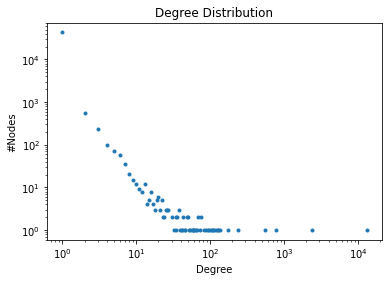

In [53]:
hist = nx.degree_histogram(G)
    
plt.plot(range(0, len(hist)), hist, ".")
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("#Nodes")
plt.loglog()
plt.show()

In [56]:
ego = nx.ego_graph("cloebianco", ['cloebianco', 'ddlzan']) # ego network of the node 0
nx.draw(ego, with_labels=True)

TypeError: 'in <string>' requires string as left operand, not list